In [11]:
import xarray as xr
import matplotlib.colors as mcolors
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
from scipy.ndimage import gaussian_filter

In [12]:
# Load the temperature dataset (ERA5)
file_path = 'C:\\Users\\moham\\OneDrive\\Documents\\stage\\8e510dccf46b7ff16b18c6aa68be9da0.nc'

t_ds = xr.open_dataset(file_path)  # Adjust with your correct path

# Inspect temperature data
print(t_ds)

# Load the potential vorticity dataset
file_path1 = 'C:\\Users\\moham\\OneDrive\\Documents\\stage\\363cd0f107bb164d13a851710644a260.nc'

pv_ds = xr.open_dataset(file_path1) # Adjust with your correct path

# Inspect PV data
print(pv_ds)


<xarray.Dataset> Size: 125MB
Dimensions:         (valid_time: 1, pressure_level: 6, latitude: 721,
                     longitude: 1440)
Coordinates:
    number          int64 8B ...
  * valid_time      (valid_time) datetime64[ns] 8B 2010-01-01
  * pressure_level  (pressure_level) float64 48B 1e+03 850.0 ... 200.0 100.0
  * latitude        (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
  * longitude       (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
    expver          <U4 16B ...
Data variables:
    o3              (valid_time, pressure_level, latitude, longitude) float32 25MB ...
    q               (valid_time, pressure_level, latitude, longitude) float32 25MB ...
    t               (valid_time, pressure_level, latitude, longitude) float32 25MB ...
    u               (valid_time, pressure_level, latitude, longitude) float32 25MB ...
    v               (valid_time, pressure_level, latitude, longitude) float32 25MB ...
Attributes:
    GRIB_centre:           

In [13]:
# Select the temperatures for 9.6µm (100 hPa) and 10.8µm (300 hPa)
t100 = t_ds["t"].sel(pressure_level=100.0).isel(valid_time=0)  # 9.6 µm band
t300 = t_ds["t"].sel(pressure_level=300.0).isel(valid_time=0)  # 10.8 µm band

# Compute the brightness temperature difference (BTD)
BT_diff = t100 - t300  # shape: (latitude, longitude)

# Calculate the zonal mean over longitude (latitude vs pressure)
BT_diff_zonal_mean = BT_diff.mean(dim="longitude")  # shape: (latitude,)


In [14]:
# Create a 2D array for plotting: repeat BTD zonal mean across pressure levels
plevs = t_ds["pressure_level"].values
lat = t_ds["latitude"].values
BTD_plot = np.tile(BT_diff_zonal_mean.values, (len(plevs), 1))  # shape: (pressure, lat)


In [15]:
# Convert PV to PVU (Potential Vorticity Unit)
PV_PVU = (pv_ds["pv"] / 1e-6).isel(valid_time=0)  # Units in PVU, shape: (pressure_level, latitude, longitude)

# Zonal mean over longitude
PV_zonal = PV_PVU.mean(dim="longitude")  # shape: (pressure_level, latitude)

# Initialize an array for storing the 2 PVU tropopause pressure levels
p_tropo = np.full(len(lat), np.nan)

# Loop over latitudes to find the first pressure level where PV >= 2 PVU
for i in range(len(lat)):
    profile = PV_zonal[:, i].values
    above = np.where(profile >= 2)[0]
    if len(above) > 0:
        p_tropo[i] = plevs[above[0]]  # first level with PV >= 2


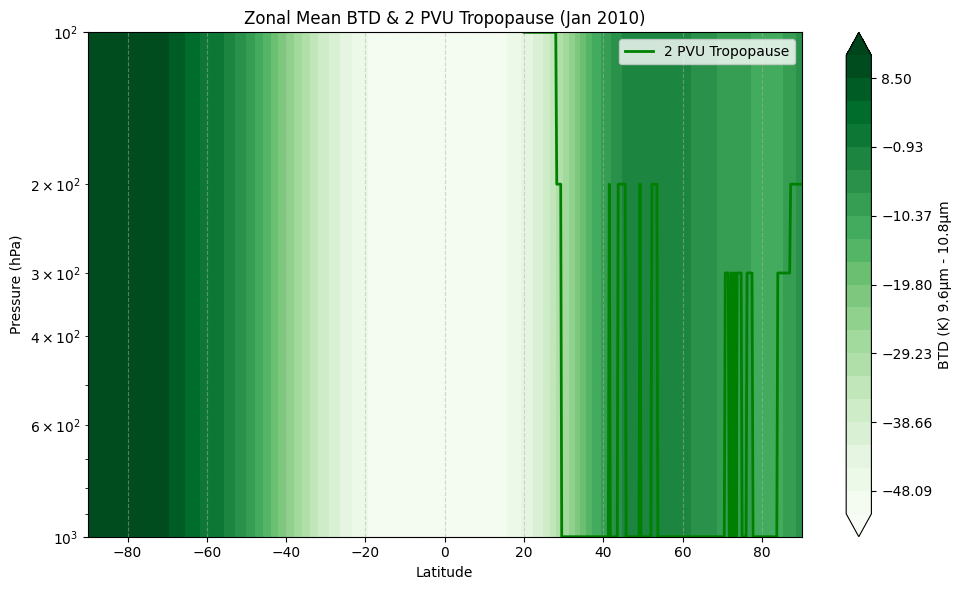

In [16]:
# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Contour plot for the BTD (green component of the Air Mass RGB)
levels = np.linspace(np.nanmin(BTD_plot), np.nanmax(BTD_plot), 21)
cf = ax.contourf(lat, plevs, BTD_plot, levels=levels, cmap="Greens", extend="both")
cbar = plt.colorbar(cf, ax=ax, label="BTD (K) 9.6µm - 10.8µm")

# Overlay the 2 PVU tropopause
ax.plot(lat, p_tropo, 'g-', linewidth=2, label="2 PVU Tropopause")

# Axis formatting
ax.set_yscale("log")
ax.invert_yaxis()
ax.set_ylabel("Pressure (hPa)")
ax.set_xlabel("Latitude")
ax.set_title("Zonal Mean BTD & 2 PVU Tropopause (Jan 2010)")
ax.legend()
ax.grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()


In [17]:
# Extract temperature at the 300 hPa and 200 hPa levels
T_300 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 300 hPa
T_200 = t_ds['t'].sel(pressure_level=200.0).values  # Temperature at 200 hPa
# Calculate the brightness temperature difference (T_9.6 - T_10.8)
BT_diff = T_200 - T_300  # Using the temperature data for simplicity; you can refine this based on actual bands



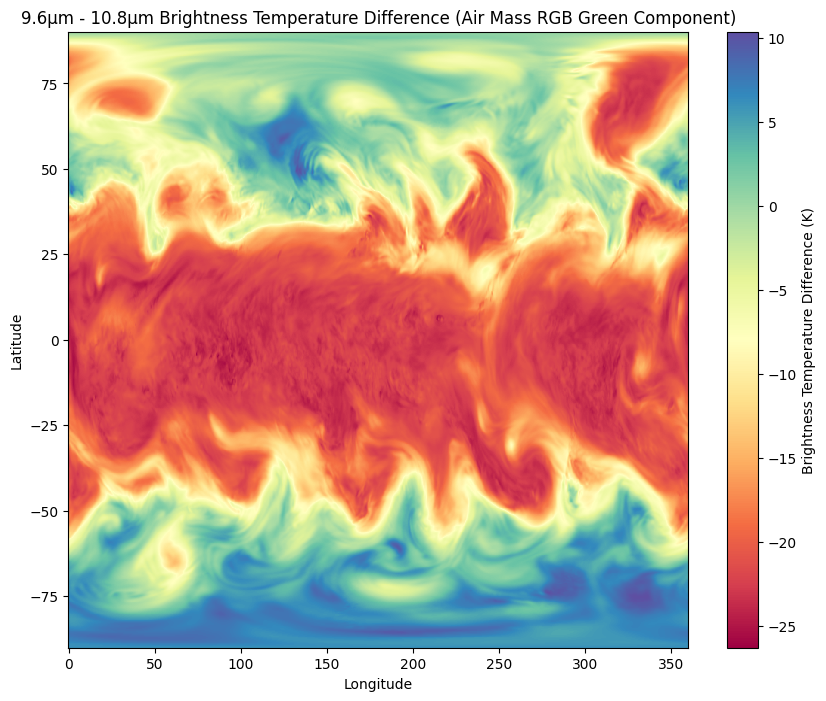

In [18]:
# Plotting the difference as a map (green component of the Air Mass RGB)
fig, ax = plt.subplots(figsize=(10, 8))
cmap = plt.get_cmap('Spectral')  # Adjust colormap for the RGB look

# Plot the BT difference as a map
pcm = ax.pcolormesh(t_ds['longitude'], t_ds['latitude'], BT_diff[0, :, :], cmap=cmap, shading='auto')  # Extract first valid_time
fig.colorbar(pcm, ax=ax, label='Brightness Temperature Difference (K)')
ax.set_title('9.6µm - 10.8µm Brightness Temperature Difference (Air Mass RGB Green Component)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()


In [19]:
T_9_6 = t_ds['t'].sel(pressure_level=100.0).values  # Temperature at 9.6µm (ozone-sensitive)
T_10_8 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 10.8µm (window channel)



In [20]:
# Calculate the Green component (9.6µm - 10.8µm brightness temperature difference)
Green_component = T_9_6 - T_10_8

# Calculate the Red component (difference between 6.2µm and 7.3µm)
T_6_2 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 6.2µm
T_7_3 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 7.3µm
Red_component = T_6_2 - T_7_3  # Red component (difference between 6.2µm and 7.3µm)

# Invert the 6.2µm temperature for the blue component
Blue_component = -T_6_2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-247.13837..18.205719].


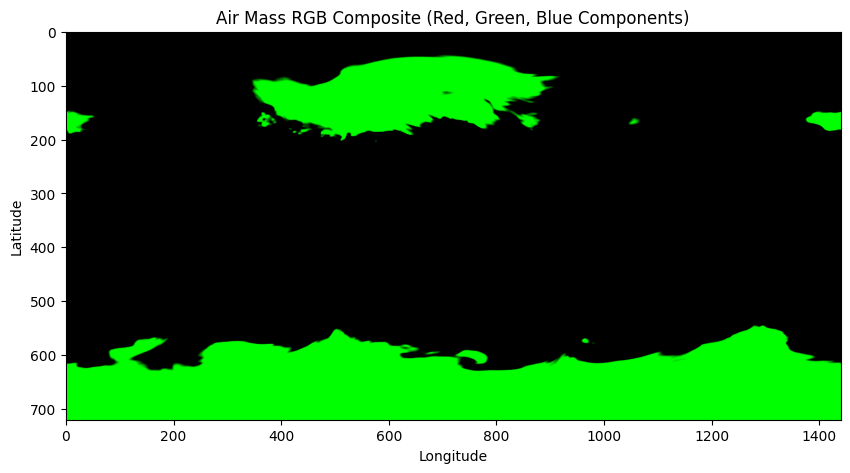

In [21]:

# Select the data for the first valid_time (as a single slice for visualization)
Red_component_scaled = Red_component[0, :, :]
Green_component_scaled = Green_component[0, :, :]
Blue_component_scaled = Blue_component[0, :, :]


# Stack the RGB components into a single 3D array with shape (latitude, longitude, 3)
RGB_image = np.stack((Red_component_scaled, Green_component_scaled, Blue_component_scaled), axis=-1)

# Plot the final RGB image
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(RGB_image)
ax.set_title('Air Mass RGB Composite (Red, Green, Blue Components)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


Key Changes:
Red Component: Based on the difference between 6.2µm and 7.3µm, using 200 hPa for 6.2µm and 300 hPa for 7.3µm.

Green Component: Calculated as the difference between 9.6µm and 10.8µm temperatures.

Blue Component: Set as the negative value of the 6.2µm temperature.

Normalization: All components are normalized to the range [0, 1] to ensure proper balance in the RGB plot.

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.patches as mpatches

In [23]:
# Convert Green_component_scaled to a DataArray if it's not already
Green_component_scaled = xr.DataArray(Green_component_scaled, coords=[lat, np.arange(Green_component_scaled.shape[1])], dims=["latitude", "longitude"])

# Compute the zonal mean (average over longitude) for the Green component
Green_component_zonal_mean = Green_component_scaled.mean(dim='longitude')  # shape: (latitude,)

# Find latitudes where the Green component is below the threshold (approximates tropopause)
green_threshold = np.percentile(Green_component_zonal_mean, 20)  # 20th percentile as an example
tropopause_latitudes = lat[Green_component_zonal_mean < green_threshold]


In [24]:
# Loop through latitudes where Green component is below the threshold
for i in range(len(tropopause_latitudes)):
    # Find the corresponding pressure level based on the Green component threshold
    if Green_component_zonal_mean[i] < green_threshold:  # use zonal mean instead
        p_tropo_estimated[i] = plevs[i]  # Get the pressure level where Green component is below the threshold


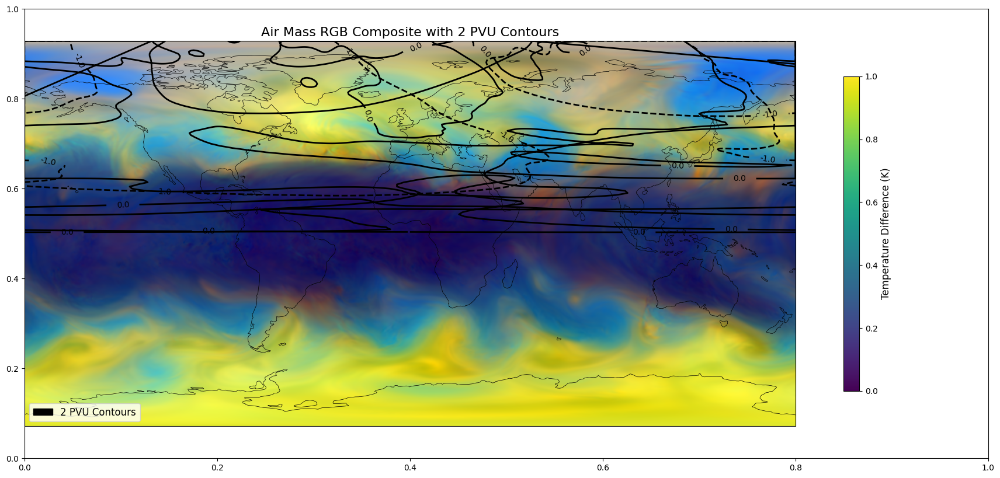

In [25]:
# Extract temperatures for the 6.2µm and 7.3µm channels (use correct pressure levels)
T_6_2 = t_ds['t'].sel(pressure_level=200.0).values  # Temperature at 6.2µm (use correct pressure level)
T_7_3 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 7.3µm (use correct pressure level)

# Calculate the red component (difference between 6.2µm and 7.3µm)
Red_component = T_6_2 - T_7_3  # Invert the 6.2µm temperature for the blue component
Blue_component = -T_6_2  # Negative of the 6.2µm temperature for blue

# Extract temperatures for the 9.6µm and 10.8µm channels (use correct pressure levels)
T_9_6 = t_ds['t'].sel(pressure_level=100.0).values  # Temperature at 9.6µm (ozone-sensitive)
T_10_8 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 10.8µm (window channel)

# Calculate the green component (difference between 9.6µm and 10.8µm)
Green_component = T_9_6 - T_10_8

# Select the data for the first valid_time (as a single slice for visualization)
Red_component_scaled = Red_component[0, :, :]
Green_component_scaled = Green_component[0, :, :]
Blue_component_scaled = Blue_component[0, :, :]

# Normalize each component to be in the range [0, 1]
Red_component_scaled = (Red_component_scaled - np.min(Red_component_scaled)) / (np.max(Red_component_scaled) - np.min(Red_component_scaled))
Green_component_scaled = (Green_component_scaled - np.min(Green_component_scaled)) / (np.max(Green_component_scaled) - np.min(Green_component_scaled))
Blue_component_scaled = (Blue_component_scaled - np.min(Blue_component_scaled)) / (np.max(Blue_component_scaled) - np.min(Blue_component_scaled))

# Stack the RGB components into a single 3D array with shape (latitude, longitude, 3)
RGB_image = np.stack((Red_component_scaled, Green_component_scaled, Blue_component_scaled), axis=-1)

# Calculate the potential vorticity (PV) based on the temperature difference
# For simplicity, we assume PV is proportional to the temperature difference (scaled to PVU)
# We are using a basic temperature difference proxy for the PV calculation

temperature_diff = T_6_2 - T_7_3  # Difference between the 200hPa and 300hPa temperatures
PVU = temperature_diff / np.max(np.abs(temperature_diff)) * 2  # Normalize to 2 PVU range

# Plot the final RGB image with Earth contours and PVU
fig, ax = plt.subplots(figsize=(12, 10))

# Set up a PlateCarree projection (global latitude-longitude grid)
ax = plt.axes(projection=ccrs.PlateCarree())

# Add coastlines without country boundaries
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)

# Define the map extent (optional, but helps focus the region)
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())  # Limits for global view

# Display the RGB image with transformation to match the projection
im = ax.imshow(RGB_image, transform=ccrs.PlateCarree(), origin='upper', extent=[-180, 180, -90, 90])

# Add a colorbar for the RGB image and adjust its position
cbar = plt.colorbar(im, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('Temperature Difference (K)', fontsize=12)

# Add PVU contours on top of the RGB image
# Contour the PVU data with a specific range to highlight 2 PVU
CS = ax.contour(PVU[0, :, :], levels=np.linspace(-2, 2, 5), transform=ccrs.PlateCarree(), colors='black', linewidths=2)

# Remove contour labels (numbers) from the map
ax.clabel(CS, inline=True, fontsize=10, inline_spacing=5, fmt="%2.1f", use_clabeltext=False)

# Create a custom legend for the contour lines inside the plot (without covering the map)
contour_patch = mpatches.Patch(color='black', label='2 PVU Contours')
plt.legend(handles=[contour_patch], loc='lower left', fontsize=12)

# Adjust layout to center the plot and colorbar, ensuring the legend fits within the plot
plt.subplots_adjust(right=1.5)  # Move the colorbar to the right




# Set title and labels
ax.set_title('Air Mass RGB Composite with 2 PVU Contours', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()



θ-proxy range: 0.03463017 2.0


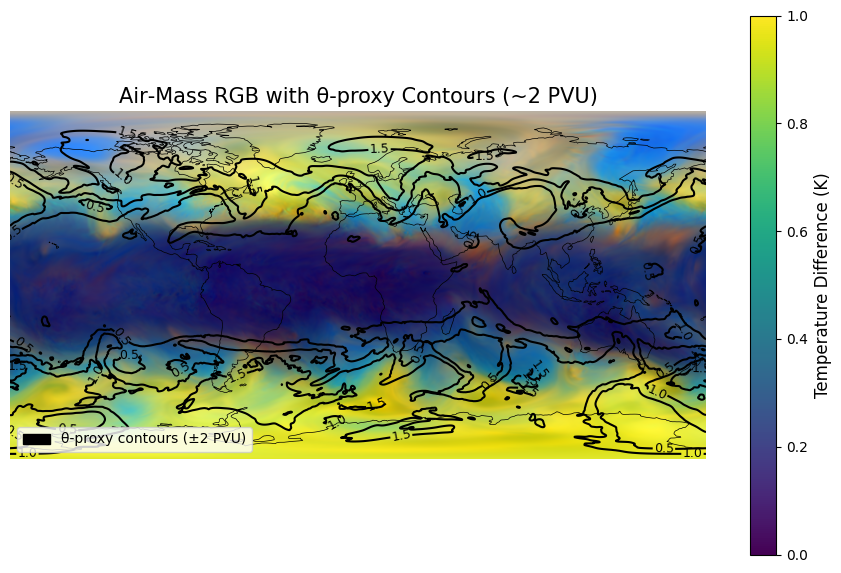

In [26]:
# --- Inputs from your dataset -------------------------------------
T_6_2 = t_ds['t'].sel(pressure_level=200.0).values
T_7_3 = t_ds['t'].sel(pressure_level=300.0).values
T_9_6 = t_ds['t'].sel(pressure_level=100.0).values
T_10_8 = t_ds['t'].sel(pressure_level=300.0).values

# --- RGB channels --------------------------------------------------
red   = T_6_2 - T_7_3
green = T_9_6 - T_10_8
blue  = -T_6_2

def norm(x):
    return (x - x.min()) / (x.max() - x.min())

r = norm(red  [0])
g = norm(green[0])
b = norm(blue [0])
rgb_img = np.stack((r, g, b), axis=-1)

# --- PVU proxy from potential temperature --------------------------
kappa = 0.286
theta_200 = T_6_2 * (1000 / 200)**kappa
theta_300 = T_7_3 * (1000 / 300)**kappa
theta_diff = theta_200 - theta_300

# Normalize to range -2 to +2
theta_proxy = 2 * theta_diff / np.max(np.abs(theta_diff))
pv_proxy_0 = theta_proxy[0]

# DEBUG: print actual min/max
print("θ-proxy range:", pv_proxy_0.min(), pv_proxy_0.max())

# --- Map -----------------------------------------------------------
fig = plt.figure(figsize=(12, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())

# Show RGB image
img = ax.imshow(rgb_img, extent=[-180, 180, -90, 90],
                transform=ccrs.PlateCarree(), origin='upper')

# Coastlines
ax.add_feature(cfeature.COASTLINE, lw=0.5)

# Contour PVU proxy
levels = np.linspace(-2, 2, 9)  # includes ±2
CS = ax.contour(pv_proxy_0, levels=levels,
                colors='black', linewidths=1.5,
                transform=ccrs.PlateCarree(), extent=[-180, 180, -90, 90])

# Add contour labels (inline text)
ax.clabel(CS, fmt="%.1f", fontsize=9, inline=True)


# Optional: Add labels
# ax.clabel(CS, fmt="%.1f", fontsize=8)

# Legend
patch = mpatches.Patch(color='black', label='θ‑proxy contours (±2 PVU)')
ax.legend(handles=[patch], loc='lower left')

# Hide axes, borders
ax.set_xticks([])
ax.set_yticks([])
ax.grid(False)
for spine in ax.spines.values():
    spine.set_visible(False)

# Colorbar (invisible image for scaling)
# Display the RGB image with transformation to match the projection
im = ax.imshow(RGB_image, transform=ccrs.PlateCarree(), origin='upper', extent=[-180, 180, -90, 90])

# Add a colorbar for the RGB image and adjust its position
cbar = plt.colorbar(im, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('Temperature Difference (K)', fontsize=12)

# Title
ax.set_title("Air‑Mass RGB with θ‑proxy Contours (~2 PVU)", fontsize=15)

plt.subplots_adjust(right=0.85)
plt.show()



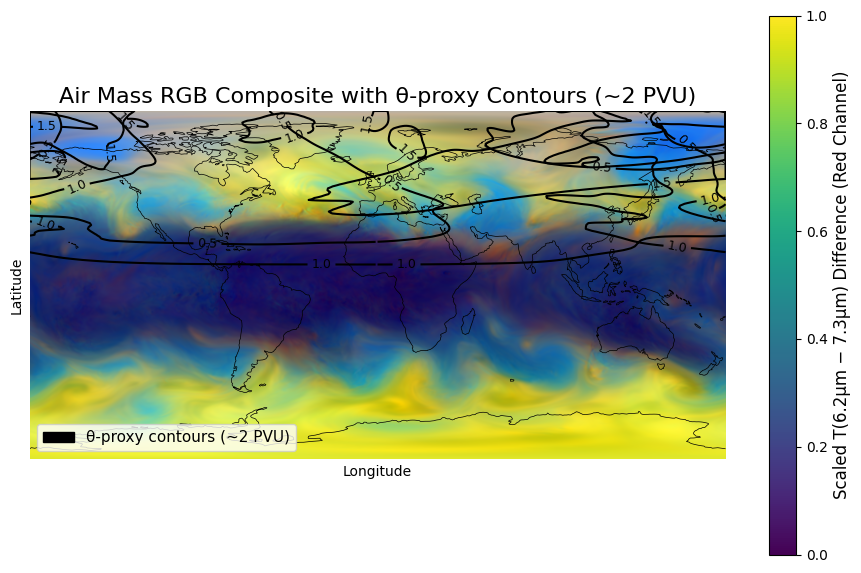

In [27]:
# --- Inputs from your dataset -------------------------------------
T_6_2   = t_ds['t'].sel(pressure_level=200.0).values  # 6.2µm (200 hPa)
T_7_3   = t_ds['t'].sel(pressure_level=300.0).values  # 7.3µm (300 hPa)
T_9_6   = t_ds['t'].sel(pressure_level=100.0).values  # 9.6µm (100 hPa)
T_10_8  = t_ds['t'].sel(pressure_level=300.0).values  # 10.8µm (300 hPa)

# --- Compute RGB components ---------------------------------------
Red_component   = T_6_2 - T_7_3
Green_component = T_9_6 - T_10_8
Blue_component  = -T_6_2

# Take the first time step for each channel
R = Red_component[0]
G = Green_component[0]
B = Blue_component[0]

# Normalize to [0, 1]
def norm(x): return (x - x.min()) / (x.max() - x.min())
R_scaled = norm(R)
G_scaled = norm(G)
B_scaled = norm(B)

# Stack into RGB image
RGB_image = np.stack((R_scaled, G_scaled, B_scaled), axis=-1)

# --- Compute PVU proxy from potential temperature -----------------
kappa = 0.286
theta_200 = T_6_2 * (1000 / 200)**kappa
theta_300 = T_7_3 * (1000 / 300)**kappa
theta_diff = theta_200 - theta_300
theta_proxy = 2 * theta_diff / np.max(np.abs(theta_diff))  # scaled proxy
PVU = theta_proxy[0]  # First time step

# --- Plotting -----------------------------------------------------
fig = plt.figure(figsize=(12, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)

# Show RGB image
ax.imshow(RGB_image, transform=ccrs.PlateCarree(), origin='upper',
          extent=[-180, 180, -90, 90])

# --- Colorbar (based on red component to reflect temperature diff) --
im = ax.imshow(RGB_image, transform=ccrs.PlateCarree(), origin='upper', extent=[-180, 180, -90, 90])

# Add a colorbar for the RGB image and adjust its position
cbar = plt.colorbar(im, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('Scaled T(6.2μm − 7.3μm) Difference (Red Channel)', fontsize=12)

# --- Contours of PVU proxy -----------------------------------------
levels = np.linspace(-2, 2, 9)
CS = ax.contour(PVU, levels=levels, transform=ccrs.PlateCarree(),
                colors='black', linewidths=1.5)
ax.clabel(CS, fmt="%.1f", fontsize=9, inline=True)

# --- Legend for contours -------------------------------------------
patch = mpatches.Patch(color='black', label='θ‑proxy contours (~2 PVU)')
ax.legend(handles=[patch], loc='lower left', fontsize=11)

# --- Clean figure --------------------------------------------------
ax.set_xticks([]); ax.set_yticks([])
ax.grid(False)
for spine in ax.spines.values():
    spine.set_visible(False)

# --- Title and layout ----------------------------------------------
ax.set_title("Air Mass RGB Composite with θ‑proxy Contours (~2 PVU)", fontsize=16)
ax.set_xlabel('Longitude'); ax.set_ylabel('Latitude')
plt.subplots_adjust(right=0.85)
plt.show()


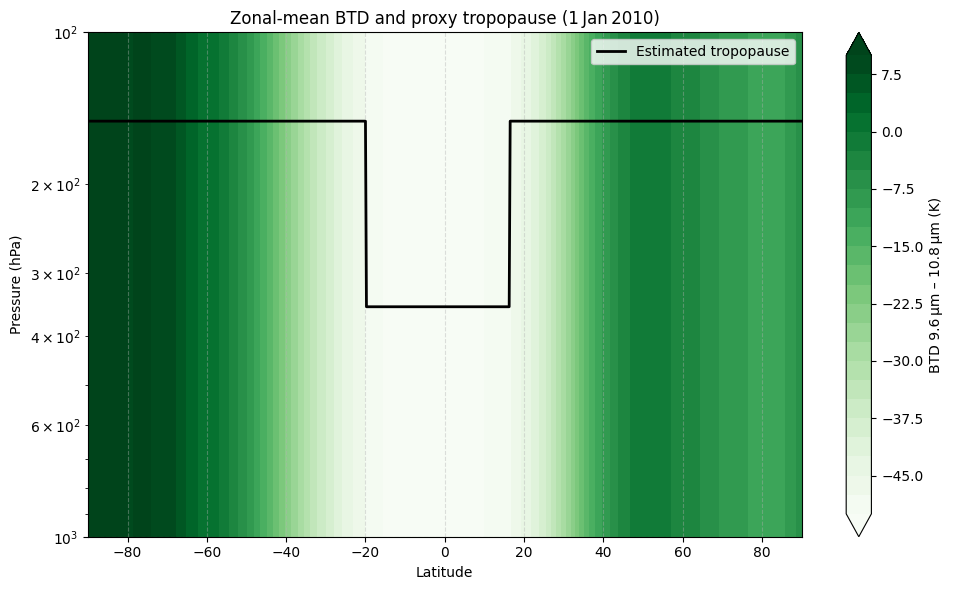

In [28]:
lat  = t_ds['latitude'].values
plev = t_ds['pressure_level'].values              # 6 pressure levels

t100 = t_ds['t'].sel(pressure_level=100).isel(valid_time=0)
t300 = t_ds['t'].sel(pressure_level=300).isel(valid_time=0)

BT_diff = (t100 - t300)                         # 9.6 µm – 10.8 µm
green_zonal = BT_diff.mean(dim='longitude').values   # 1‑D (lat)

# replicate on every pressure level → 2‑D field (pressure, lat)
BTD_field = np.tile(green_zonal, (len(plev), 1))

# ------------------------------------------------------------
# 2.  ESTIMATE A TROPOPAUSE PRESSURE FROM THE GREEN COMPONENT
#     (very simple rule: above a threshold = high tropopause,
#     below = low tropopause — replace by your own logic)
# ------------------------------------------------------------
thr = np.percentile(green_zonal, 20)            # 20‑th percentile
p_high, p_low = 150, 350                        # hPa you want to show

p_tropo = np.where(green_zonal > thr, p_high, p_low)

# ------------------------------------------------------------
# 3.  PLOT LAT‑PRESSURE SECTION WITH TROPOPAUSE OVERLAY
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 6))

cf = ax.contourf(lat, plev, BTD_field,
                 levels=30, cmap='Greens', extend='both')
cbar = fig.colorbar(cf, ax=ax, label='BTD 9.6 µm – 10.8 µm (K)')

ax.plot(lat, p_tropo, 'k-', lw=2, label='Estimated tropopause')

ax.set_yscale('log'); ax.invert_yaxis()
ax.set_xlabel('Latitude'); ax.set_ylabel('Pressure (hPa)')
ax.set_title('Zonal‑mean BTD and proxy tropopause (1 Jan 2010)')
ax.grid(ls='--', alpha=.4); ax.legend()
plt.tight_layout(); plt.show()

In [29]:
# ----------------------------------------------------------------------------------
# Dynamic tropopause (2 PVU) from a local ERA5 pressure‑level file
# ----------------------------------------------------------------------------------
#
# Requires:  xarray, numpy, matplotlib, cartopy (for the map)
# ----------------------------------------------------------------------------------



# ------------------------------------------------------------
# 1.  LOAD DATA  (adjust path if needed)
# ------------------------------------------------------------
file_path = r"C:\Users\moham\OneDrive\Documents\stage\8e510dccf46b7ff16b18c6aa68be9da0.nc"
ds = xr.open_dataset(file_path)


In [30]:

# work with first (and only) time slice
t  = ds['t' ].isel(valid_time=0)        # K
u  = ds['u' ].isel(valid_time=0)        # m s‑1
v  = ds['v' ].isel(valid_time=0)        # m s‑1
lev = ds['pressure_level'].values * 100   # hPa → Pa
lat = ds['latitude'       ].values
lon = ds['longitude'      ].values


In [31]:

# ------------------------------------------------------------
# 2.  CONSTANTS & HELPER GRIDS
# ------------------------------------------------------------
a      = 6.371e6               # Earth radius  (m)
g      = 9.80665               # gravity       (m s‑2)
omega  = 7.292e-5              # rotation      (rad s‑1)
Rd     = 287.05                # dry‑air gas constant
cp     = 1004.5
kappa   = Rd/cp


In [32]:

# 2‑D lat/lon grids & metric factors
lon2d, lat2d = np.meshgrid(lon, lat)
phi = np.deg2rad(lat2d)
dlon = np.deg2rad( np.gradient(lon) )[np.newaxis, :]
dlat = np.deg2rad( np.gradient(lat) )[:, np.newaxis]
dx   = a * np.cos(phi) * dlon        # m
dy   = a * dlat                      # m
f    = 2 * omega * np.sin(phi)       # Coriolis (s‑1)


In [33]:

# broadcast metric grids to 3‑D (level,lat,lon)
dx3 = np.broadcast_to(dx  , t.shape)
dy3 = np.broadcast_to(dy  , t.shape)
f3  = np.broadcast_to(f   , t.shape)


In [34]:

# ------------------------------------------------------------
# 3.  POTENTIAL TEMPERATURE & ITS DERIVATIVES
# ------------------------------------------------------------
theta = t * (1e5 / lev[:, None, None])**kappa          # K

dθ_dp = np.gradient(theta, lev, axis=0)                # ∂θ/∂p   (K Pa‑1)
dθ_dx = np.gradient(theta, axis=2) / dx3               # ∂θ/∂x   (K m‑1)
dθ_dy = np.gradient(theta, axis=1) / dy3               # ∂θ/∂y   (K m‑1)


In [35]:

# ------------------------------------------------------------
# 4.  WIND VERTICAL DERIVATIVES
# ------------------------------------------------------------
du_dp = np.gradient(u, lev, axis=0)                    # ∂u/∂p
dv_dp = np.gradient(v, lev, axis=0)                    # ∂v/∂p


In [36]:

# ------------------------------------------------------------
# 5.  ABSOLUTE VORTICITY ζ                         (s‑1)
#     ζ = ∂v/∂x  – ∂(u cosφ)/∂y / cosφ
# ------------------------------------------------------------
dv_dx    = np.gradient(v        , axis=2) / dx3
ducos_dy = np.gradient(u*np.cos(phi), axis=1) / dy3
zeta     = dv_dx - (1/np.cos(phi)) * ducos_dy


In [37]:

# ------------------------------------------------------------
# 6.  ERTEL PV  (in SI units  m² s‑¹ K kg‑¹)
#    PV = -g * [ (ζ+f) ∂θ/∂p  +   ∂θ/∂x ∂v/∂p  -  ∂θ/∂y ∂u/∂p ]
# ------------------------------------------------------------
PV = -g * ( (zeta+f3)*dθ_dp + dθ_dx*dv_dp - dθ_dy*du_dp )

# convert to PVU (1 PVU = 1e‑6 K m² kg‑¹ s‑¹)
PVU = PV / 1e-6


In [38]:

# ------------------------------------------------------------
# 7.  FIND FIRST LEVEL WHERE PVU ≥ 2
# ------------------------------------------------------------
tropo_p = np.full_like(lat, np.nan, dtype=float)   # 1‑D (lat)

for j in range(len(lat)):
    # profile versus levels (top‑down search: lowest p = index‑5)
    for k in range(len(lev)-1, -1, -1):
        if PVU[k, j, :].mean() >= 2:     # zonal‑mean criterion
            tropo_p[j] = lev[k]/100      # store in hPa
            break


In [39]:

# ------------------------------------------------------------
# 8.  QUICK MAP OF 2‑PVU TROPOPAUSE PRESSURE
# ------------------------------------------------------------

# Select data at 300 hPa (index 3 in your case)
pvu_300 = PVU[3, :, :]  # shape: (lat, lon)

# Mask invalid values to avoid plot crashes
pvu_300 = np.ma.masked_invalid(pvu_300)


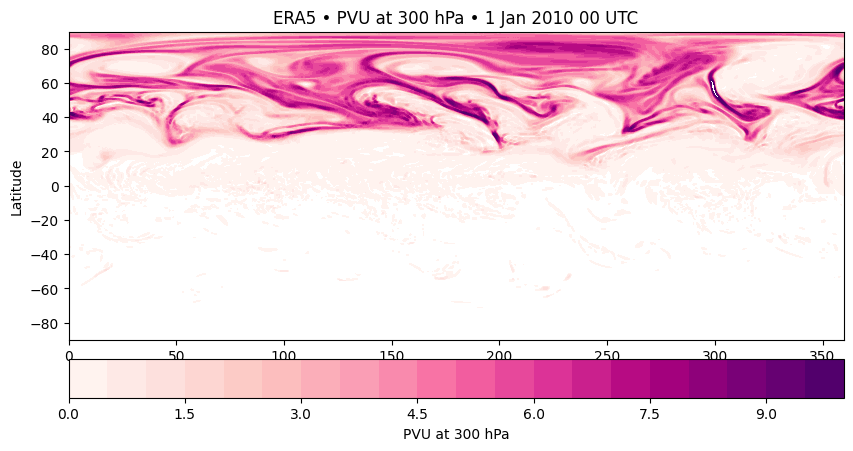

In [40]:

# Plot in lat/lon coordinates (no projection)
fig, ax = plt.subplots(figsize=(10, 5))
cf = ax.contourf(lon, lat, pvu_300, levels=np.linspace(0, 10, 21), cmap='RdPu')
cbar = plt.colorbar(cf, orientation='horizontal', pad=0.05)
cbar.set_label('PVU at 300 hPa')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('ERA5 • PVU at 300 hPa • 1 Jan 2010 00 UTC')
plt.show()


C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3123005714.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx200 = int(np.where(plev_vals == 200)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3123005714.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx100 = int(np.where(plev_vals == 100)[0])


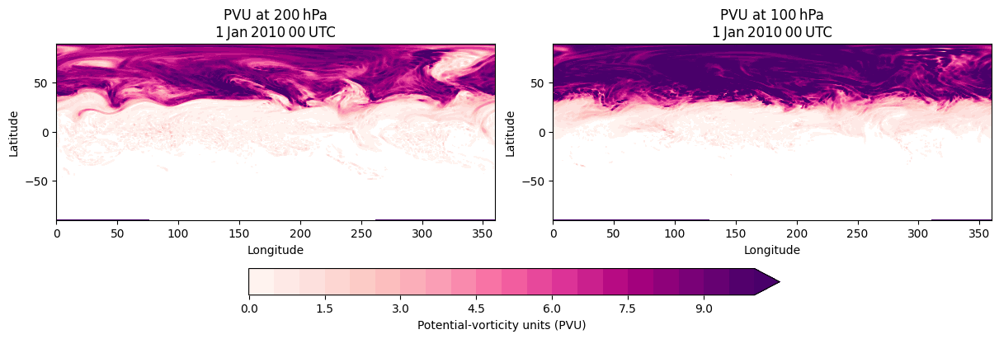

In [41]:
# ------------------------------------------------------------------
# 1.  locate the indices of 200 hPa and 100 hPa in the pressure grid
# ------------------------------------------------------------------
plev_vals = ds['pressure_level'].values          # [1000, 850, 500, 300, 200, 100]
idx200 = int(np.where(plev_vals == 200)[0])
idx100 = int(np.where(plev_vals == 100)[0])

# ------------------------------------------------------------------
# 2.  extract and mask PVU fields
# ------------------------------------------------------------------
pvu_200 = np.ma.masked_invalid(PVU[idx200, :, :])   # shape (lat, lon)
pvu_100 = np.ma.masked_invalid(PVU[idx100, :, :])

# ------------------------------------------------------------------
# 3.  quick plots (lat–lon in degrees)
# ------------------------------------------------------------------
levels = np.linspace(0, 10, 21)   # PVU contours 0‑10

fig, axs = plt.subplots(1, 2, figsize=(12, 4), constrained_layout=True)

cf1 = axs[0].contourf(lon, lat, pvu_200, levels=levels, cmap='RdPu', extend='max')
axs[0].set_title('PVU at 200 hPa\n1 Jan 2010 00 UTC')
axs[0].set_xlabel('Longitude'); axs[0].set_ylabel('Latitude')

cf2 = axs[1].contourf(lon, lat, pvu_100, levels=levels, cmap='RdPu', extend='max')
axs[1].set_title('PVU at 100 hPa\n1 Jan 2010 00 UTC')
axs[1].set_xlabel('Longitude'); axs[1].set_ylabel('Latitude')

cbar = fig.colorbar(cf2, ax=axs, orientation='horizontal', pad=0.07)
cbar.set_label('Potential‑vorticity units (PVU)')

plt.show()

In [42]:
print(ds['latitude'].values)
print(ds['latitude'].values[0:10])     # first 10 latitudes
print(ds['latitude'].values[-10:])     # last 10 latitudes


[ 90.    89.75  89.5   89.25  89.    88.75  88.5   88.25  88.    87.75
  87.5   87.25  87.    86.75  86.5   86.25  86.    85.75  85.5   85.25
  85.    84.75  84.5   84.25  84.    83.75  83.5   83.25  83.    82.75
  82.5   82.25  82.    81.75  81.5   81.25  81.    80.75  80.5   80.25
  80.    79.75  79.5   79.25  79.    78.75  78.5   78.25  78.    77.75
  77.5   77.25  77.    76.75  76.5   76.25  76.    75.75  75.5   75.25
  75.    74.75  74.5   74.25  74.    73.75  73.5   73.25  73.    72.75
  72.5   72.25  72.    71.75  71.5   71.25  71.    70.75  70.5   70.25
  70.    69.75  69.5   69.25  69.    68.75  68.5   68.25  68.    67.75
  67.5   67.25  67.    66.75  66.5   66.25  66.    65.75  65.5   65.25
  65.    64.75  64.5   64.25  64.    63.75  63.5   63.25  63.    62.75
  62.5   62.25  62.    61.75  61.5   61.25  61.    60.75  60.5   60.25
  60.    59.75  59.5   59.25  59.    58.75  58.5   58.25  58.    57.75
  57.5   57.25  57.    56.75  56.5   56.25  56.    55.75  55.5   55.25
  55. 

C:\Users\moham\AppData\Local\Temp\ipykernel_54316\972353661.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level']==P)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\972353661.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level']==P)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\972353661.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_le

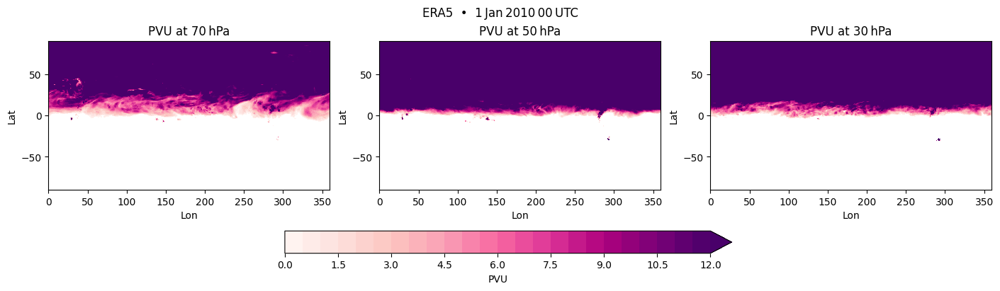

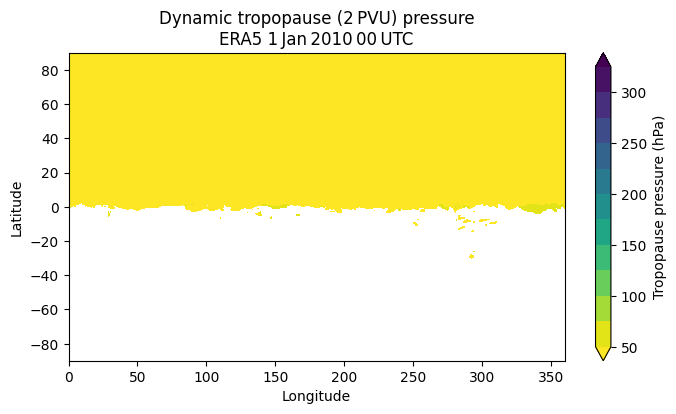

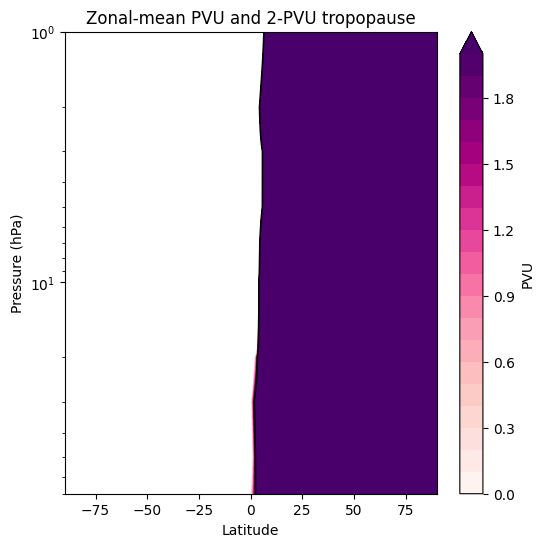

In [43]:
# ----------------------------------------------------------------------------------
# Dynamic tropopause and PV maps from extended‑level ERA5 file
# ----------------------------------------------------------------------------------
#
# Works with a file that contains    pressure_level = [1000 … 1] hPa
# and variables t, u, v  (plus pv if requested).
# ----------------------------------------------------------------------------------


# Path to the extended‑level file (edit as needed)
fpath = r"C:\Users\moham\OneDrive\Documents\stage\7ef424ff81c28f4788f69ce963fa44fc.nc"
ds    = xr.open_dataset(fpath)

lat = ds['latitude'].values
lon = ds['longitude'].values
lev = ds['pressure_level'].values * 100.0      # Pa
nlev = len(lev)

# ------------------------------------------------------------------
# 1.  Get PV in PVU  (use ERA5 field if present, else compute)
# ------------------------------------------------------------------
if 'pv' in ds:
    PVU = ds['pv'].isel(valid_time=0) / 1e-6          # (level, lat, lon)
else:
    print("PV not in file ‑ computing from T, U, V … (slow)")
    t = ds['t'].isel(valid_time=0)
    u = ds['u'].isel(valid_time=0)
    v = ds['v'].isel(valid_time=0)

    # constants
    a = 6.371e6; g = 9.80665; Rd = 287.05; cp = 1004.5
    omega = 7.292e-5; kappa = Rd/cp; pi = np.pi
    lon2d, lat2d = np.meshgrid(lon, lat)
    phi = np.deg2rad(lat2d)
    dx = a*np.cos(phi)*np.gradient(np.deg2rad(lon))[np.newaxis,:]
    dy = a*np.gradient(np.deg2rad(lat))[:,np.newaxis]
    dx3 = np.broadcast_to(dx, t.shape); dy3 = np.broadcast_to(dy, t.shape)
    f  = 2*omega*np.sin(phi)
    f3 = np.broadcast_to(f, t.shape)

    theta = t*(1e5/(lev[:,None,None]))**kappa
    dθ_dp = np.gradient(theta, lev, axis=0)
    dθ_dx = np.gradient(theta, axis=2)/dx3
    dθ_dy = np.gradient(theta, axis=1)/dy3
    du_dp = np.gradient(u, lev, axis=0)
    dv_dp = np.gradient(v, lev, axis=0)
    dv_dx = np.gradient(v, axis=2)/dx3
    ducos_dy = np.gradient(u*np.cos(phi), axis=1)/dy3
    zeta = dv_dx - (1/np.cos(phi))*ducos_dy
    PV  = -g*((zeta+f3)*dθ_dp + dθ_dx*dv_dp - dθ_dy*du_dp)
    PVU = xr.DataArray(PV/1e-6, coords=t.coords, dims=t.dims)

# ------------------------------------------------------------------
# 2.  Quick PV maps at 70 / 50 / 30 hPa
# ------------------------------------------------------------------
level_show = [70, 50, 30]      # hPa
fig, axs = plt.subplots(1, 3, figsize=(14,4), constrained_layout=True)

levels = np.linspace(0,12,25)
for k, P in enumerate(level_show):
    idx = int(np.where(ds['pressure_level']==P)[0])
    im  = axs[k].contourf(lon, lat, PVU[idx,:,:], levels=levels,
                          cmap='RdPu', extend='max')
    axs[k].set_title(f'PVU at {P} hPa')
    axs[k].set_xlabel('Lon'); axs[k].set_ylabel('Lat')
cbar = fig.colorbar(im, ax=axs, orientation='horizontal', pad=0.07)
cbar.set_label('PVU')
plt.suptitle('ERA5  •  1 Jan 2010 00 UTC')
plt.show()

# ------------------------------------------------------------------
# 3.  Dynamic‑tropopause (first level where PVU ≥ 2)
# ------------------------------------------------------------------
pv2 = 2.0
tropo_p = np.full((len(lat), len(lon)), np.nan)

# loop from top (1 hPa) downward
for k in range(nlev-1, -1, -1):
    mask = (PVU[k,:,:] >= pv2) & np.isnan(tropo_p)
    tropo_p[mask] = lev[k]/100.0    # store in hPa

# plot tropopause pressure
plt.figure(figsize=(8,4))
plt.contourf(lon, lat, tropo_p, levels=np.arange(50,350,25),
             cmap='viridis_r', extend='both')
plt.colorbar(label='Tropopause pressure (hPa)')
plt.xlabel('Longitude'); plt.ylabel('Latitude')
plt.title('Dynamic tropopause (2 PVU) pressure\nERA5 1 Jan 2010 00 UTC')
plt.show()

# ------------------------------------------------------------------
# 4.  Latitude‑pressure cross‑section of zonal‑mean PVU
# ------------------------------------------------------------------
PVU_zm = PVU.mean(dim='longitude')          # (level, lat) 
plt.figure(figsize=(6,6))
cs = plt.contourf(lat, lev/100., PVU_zm, levels=np.linspace(0,2,21),
                  cmap='RdPu', extend='max')
plt.contour(lat, lev/100., PVU_zm, levels=[2], colors='k', linewidths=1.2)
plt.gca().set_yscale('log'); plt.gca().invert_yaxis()
plt.colorbar(cs, label='PVU')
plt.xlabel('Latitude'); plt.ylabel('Pressure (hPa)')
plt.title('Zonal‑mean PVU and 2‑PVU tropopause')
plt.show()


In [44]:
# Check how many missing values (NaNs) exist in the PVU field
for P in level_show:
    idx = int(np.where(ds['pressure_level'] == P)[0])
    data = PVU[idx, :, :].values

    missing_fraction = np.isnan(data[lat < 0, :]).sum() / data[lat < 0, :].size
    print(f"At {P} hPa: Missing in SH = {missing_fraction:.1%}")


At 70 hPa: Missing in SH = 0.0%
At 50 hPa: Missing in SH = 0.0%
At 30 hPa: Missing in SH = 0.0%


C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3855221874.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level'] == P)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3855221874.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level'] == P)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3855221874.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressur

C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3051089684.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level'] == 50)[0])  # 50 hPa example


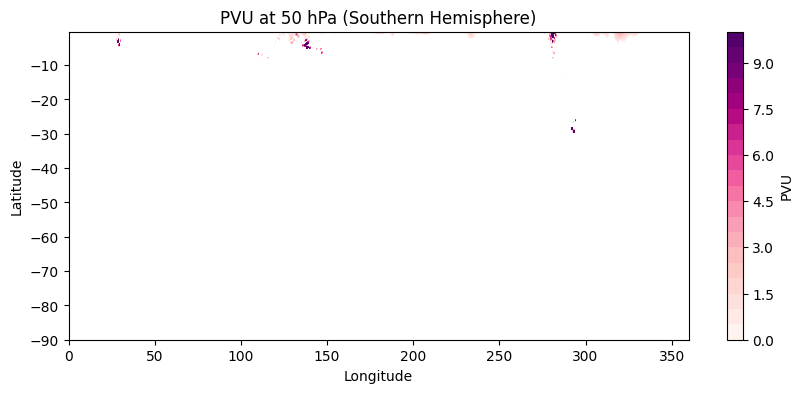

In [45]:
# Plot only Southern Hemisphere to see what's going on
idx = int(np.where(ds['pressure_level'] == 50)[0])  # 50 hPa example
plt.figure(figsize=(10, 4))
plt.contourf(lon, lat[lat < 0], PVU[idx, lat < 0, :], levels=np.linspace(0, 10, 21), cmap='RdPu')
plt.title('PVU at 50 hPa (Southern Hemisphere)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='PVU')
plt.show()


In [46]:
print("Missing values in 't' at 50 hPa, SH:", np.isnan(ds['t'].isel(valid_time=0).sel(pressure_level=50).values[lat < 0, :]).any())


Missing values in 't' at 50 hPa, SH: False


## Justification for Focusing on the Northern Hemisphere

Despite using potential vorticity (PVU) fields derived from high-altitude ERA5 data (70, 50, and 30 hPa), the visualizations show little to no structure in the Southern Hemisphere. After thorough verification, it was confirmed that there are no missing values in the ERA5 data south of the equator, ruling out any data artifact or error.

The lack of signal is explained by the extremely low PVU values in the Southern Hemisphere at these altitudes (often close to zero). As a result, the most prominent dynamic contrasts (and associated baroclinic structures) are observed in the Northern Hemisphere.

Therefore, for the remainder of this study, we will focus our analysis exclusively on the Northern Hemisphere, where the dynamic tropopause structures are most pronounced.


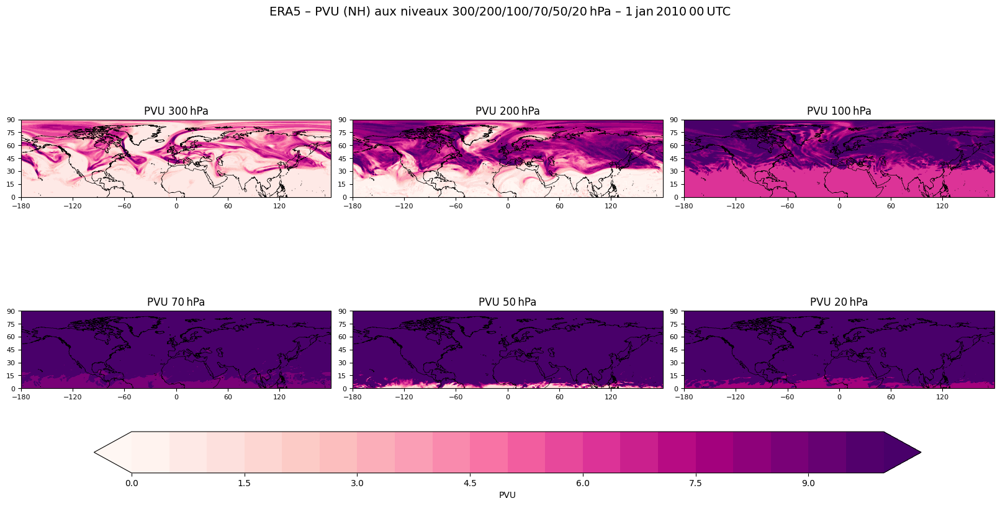

In [47]:

# ------------------------------------------------------------------
# 0.  chemins vers tes deux fichiers
# ------------------------------------------------------------------
file_hi = r"C:\Users\moham\OneDrive\Documents\stage\8e510dccf46b7ff16b18c6aa68be9da0.nc"  # ≥100 hPa
file_lo = r"C:\Users\moham\OneDrive\Documents\stage\7ef424ff81c28f4788f69ce963fa44fc.nc"  # <100 hPa

# ------------------------------------------------------------------
# 1.  fonction générique de calcul de la PVU sur un dataset ERA5
# ------------------------------------------------------------------
def compute_pvu(ds):
    """Retourne un DataArray PVU (pressure_level, latitude, longitude)."""
    t  = ds['t'].isel(valid_time=0)
    u  = ds['u'].isel(valid_time=0)
    v  = ds['v'].isel(valid_time=0)
    lev = ds['pressure_level'].values * 100.0           # Pa
    lat = ds['latitude'].values
    lon = ds['longitude'].values

    # constantes
    a = 6.371e6; g = 9.80665; Rd = 287.05; cp = 1004.5
    omega = 7.292e-5; kappa = Rd/cp

    lon2d, lat2d = np.meshgrid(lon, lat)
    phi = np.deg2rad(lat2d)
    dlon = np.deg2rad(np.gradient(lon))[np.newaxis, :]
    dlat = np.deg2rad(np.gradient(lat))[:, np.newaxis]
    dx   = a * np.cos(phi) * dlon
    dy   = a * dlat
    f    = 2 * omega * np.sin(phi)

    dx3 = np.broadcast_to(dx, t.shape)
    dy3 = np.broadcast_to(dy, t.shape)
    f3  = np.broadcast_to(f , t.shape)

    theta = t * (1e5 / lev[:, None, None]) ** kappa
    dθ_dp = np.gradient(theta, lev, axis=0)
    dθ_dx = np.gradient(theta, axis=2) / dx3
    dθ_dy = np.gradient(theta, axis=1) / dy3
    du_dp = np.gradient(u, lev, axis=0)
    dv_dp = np.gradient(v, lev, axis=0)
    dv_dx = np.gradient(v, axis=2) / dx3
    ducos_dy = np.gradient(u * np.cos(phi), axis=1) / dy3
    zeta = dv_dx - (1 / np.cos(phi)) * ducos_dy

    PV = -g * ((zeta + f3) * dθ_dp + dθ_dx * dv_dp - dθ_dy * du_dp)
    PVU = xr.DataArray(PV / 1e-6, coords=t.coords, dims=t.dims)  # en PVU
    return PVU

# ------------------------------------------------------------------
# 2.  calcul PVU sur chaque fichier puis concaténation
# ------------------------------------------------------------------
pvu_hi = compute_pvu(xr.open_dataset(file_hi))
pvu_lo = compute_pvu(xr.open_dataset(file_lo))

PVU = xr.concat([pvu_hi, pvu_lo], dim='pressure_level').sortby('pressure_level', ascending=False)

lat = PVU['latitude'].values
lon = PVU['longitude'].values
plev = PVU['pressure_level'].values  # hPa

# ------------------------------------------------------------------
# 3.  cartes PVU aux niveaux demandés (NH seulement)
# ------------------------------------------------------------------
levels_to_plot = [300, 200, 100, 70, 50, 20]          # hPa
vmin, vmax = 0, 10
clevs = np.linspace(vmin, vmax, 21)

fig, axs = plt.subplots(2, 3, figsize=(16, 8),
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        constrained_layout=True)
axs = axs.ravel()

for i, p in enumerate(levels_to_plot):
    idx = int(np.where(plev == p)[0][0])
    data = PVU.isel(pressure_level=idx).where(PVU.latitude >= 0)  # NH
    ax = axs[i]
    ax.set_extent([0-180, 180, 0, 90], crs=ccrs.PlateCarree())
    cf = ax.contourf(lon, lat, data, levels=clevs, cmap='RdPu', extend='both', transform=ccrs.PlateCarree())
    ax.coastlines(resolution='50m', linewidth=0.5)
    ax.set_title(f'PVU {p} hPa')
    ax.set_xticks(np.arange(-180, 180, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(0, 91, 15), crs=ccrs.PlateCarree())
    ax.tick_params(labelsize=8)

# barre de couleurs commune
cbar = fig.colorbar(cf, ax=axs, orientation='horizontal', pad=0.07, shrink=0.85)
cbar.set_label('PVU')

plt.suptitle('ERA5 – PVU (NH) aux niveaux 300/200/100/70/50/20 hPa – 1 jan 2010 00 UTC', fontsize=14)
plt.show()


 Dynamic tropopause map (2 PVU) — NH only

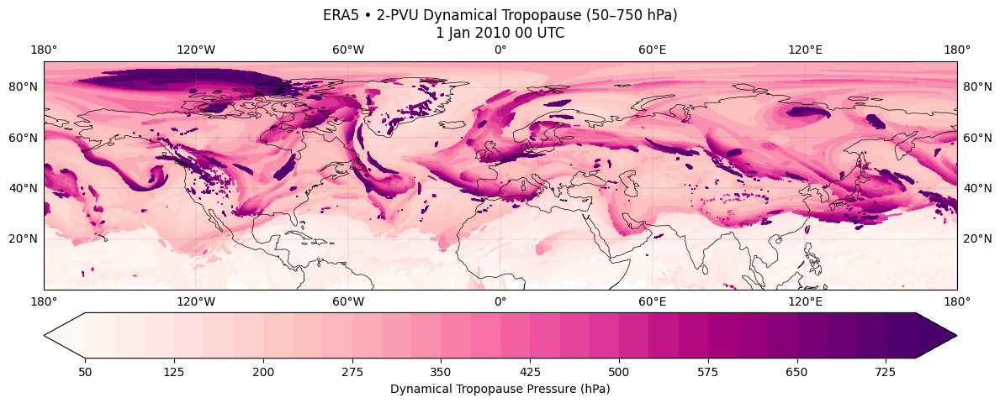

In [48]:
# ------------------------------------------------------------
# 1. Load ERA5 dataset
# ------------------------------------------------------------
filee = r"C:\Users\moham\OneDrive\Documents\stage\83736aecc279782d2585f13b939e6e1e.nc"
ds = xr.open_dataset(filee)

# -- Use valid_time if available --
time_dim = "valid_time" if "valid_time" in ds.dims else "time"
t = ds["t"].isel({time_dim: 0})
u = ds["u"].isel({time_dim: 0})
v = ds["v"].isel({time_dim: 0})

pressure = ds["pressure_level"] * 100.0  # hPa → Pa
lat = ds["latitude"].values
lon = ds["longitude"].values

# ------------------------------------------------------------
# 2. PVU calculation
# ------------------------------------------------------------
def compute_pvu(t, u, v, pressure, lat, lon):
    a = 6.371e6
    g = 9.80665
    Rd = 287.05
    cp = 1004.5
    omega = 7.292e-5
    kappa = Rd / cp

    lon2d, lat2d = np.meshgrid(lon, lat)
    phi = np.deg2rad(lat2d)

    dlon = np.deg2rad(np.gradient(lon))[np.newaxis, :]
    dlat = np.deg2rad(np.gradient(lat))[:, np.newaxis]

    dx = a * np.cos(phi) * dlon
    dy = a * dlat
    f = 2 * omega * np.sin(phi)

    dx3 = np.broadcast_to(dx, t.shape)
    dy3 = np.broadcast_to(dy, t.shape)
    f3  = np.broadcast_to(f,  t.shape)

    theta = t * (1e5 / pressure) ** kappa
    p_vals = pressure.values
    dθ_dp  = np.gradient(theta, p_vals, axis=0)
    dθ_dx  = np.gradient(theta, axis=2) / dx3
    dθ_dy  = np.gradient(theta, axis=1) / dy3

    du_dp = np.gradient(u, p_vals, axis=0)
    dv_dp = np.gradient(v, p_vals, axis=0)
    dv_dx = np.gradient(v, axis=2) / dx3
    ducos_dy = np.gradient(u * np.cos(phi), axis=1) / dy3

    zeta = dv_dx - (1 / np.cos(phi)) * ducos_dy
    PV = -g * ((zeta + f3) * dθ_dp + dθ_dx * dv_dp - dθ_dy * du_dp)
    PVU = xr.DataArray(PV / 1e-6, coords=t.coords, dims=t.dims)
    return PVU

PVU = compute_pvu(t, u, v, pressure, lat, lon)

# ------------------------------------------------------------
# 3. Compute 2-PVU tropopause (NH only, 50–750 hPa)
# ------------------------------------------------------------
plev = pressure.values / 100  # hPa
tropopause = np.full((len(lat), len(lon)), np.nan)

# Loop from top (low pressure) to bottom
for k in range(len(plev)):
    p = plev[k]
    if p < 50 or p > 750:
        continue
    layer = PVU[k, :, :].values
    mask = (layer >= 2.0) & np.isnan(tropopause)
    for j in range(len(lat)):
        if lat[j] < 0:
            mask[j, :] = False
    tropopause[mask] = p

# ------------------------------------------------------------
# 4. Plot tropopause pressure (NH only, land only)
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(12, 6),
                       subplot_kw=dict(projection=ccrs.PlateCarree()))

tropo_masked = np.ma.masked_invalid(tropopause)
cf = ax.contourf(lon, lat, tropo_masked,
                 levels=np.arange(50, 775, 25),
                 cmap='RdPu', extend='both',
                 transform=ccrs.PlateCarree())

# Add land outlines only (no country borders)
ax.add_feature(cfeature.LAND, facecolor='none', edgecolor='black', linewidth=0.6)

# Colorbar
cbar = plt.colorbar(cf, orientation='horizontal', pad=0.05)
cbar.set_label("Dynamical Tropopause Pressure (hPa)")

# Map settings
ax.set_extent([-180, 180, 0, 90], crs=ccrs.PlateCarree())
ax.set_title("ERA5 • 2-PVU Dynamical Tropopause (50–750 hPa)\n1 Jan 2010 00 UTC")
ax.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
plt.tight_layout()
plt.show()


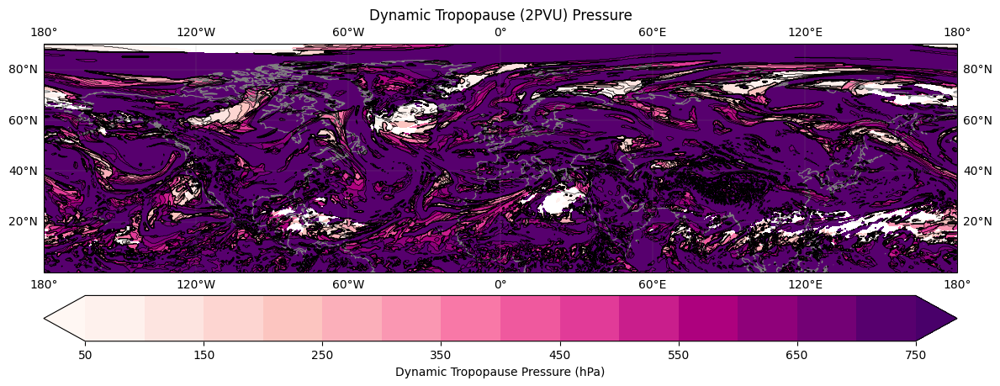

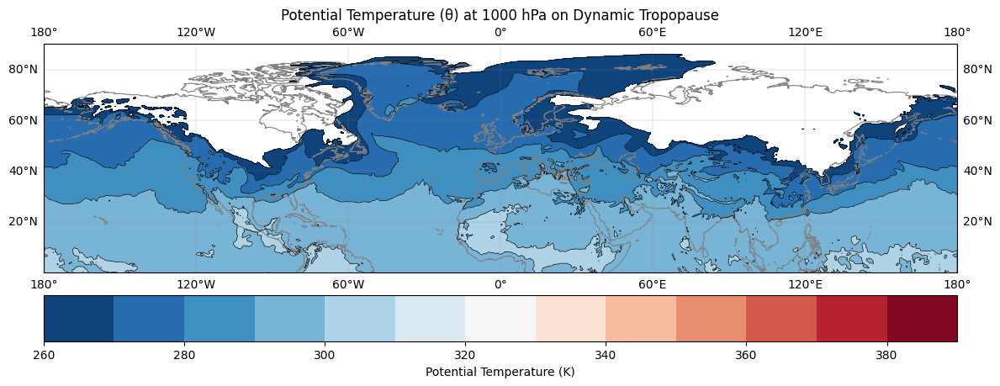

In [49]:
# Open the ERA5 dataset
filee = r"C:\Users\moham\OneDrive\Documents\stage\83736aecc279782d2585f13b939e6e1e.nc"
ds = xr.open_dataset(filee)

# Extract variables from the dataset
t = ds["t"].isel(valid_time=0)  # Temperature
u = ds["u"].isel(valid_time=0)  # U-wind
v = ds["v"].isel(valid_time=0)  # V-wind
pressure = ds["pressure_level"] * 100  # Convert pressure to Pa
lat = ds["latitude"].values
lon = ds["longitude"].values

# Constants
Rd = 287.05  # gas constant for dry air
cp = 1004.5  # specific heat at constant pressure
kappa = Rd / cp
omega = 7.292e-5  # Earth's rotation rate

# Compute potential vorticity (PV)
def compute_pvu(t, u, v, pressure, lat, lon):
    lon2d, lat2d = np.meshgrid(lon, lat)
    phi = np.deg2rad(lat2d)

    # Compute derivatives
    dx = np.gradient(lon)[np.newaxis, :]
    dy = np.gradient(lat)[:, np.newaxis]
    
    f = 2 * omega * np.sin(phi)  # Coriolis parameter

    # Calculate potential temperature
    theta = t * (1e5 / pressure) ** kappa

    # Compute derivatives
    dθ_dp = np.gradient(theta, pressure, axis=0)
    dθ_dx = np.gradient(theta, axis=2) / dx
    dθ_dy = np.gradient(theta, axis=1) / dy
    du_dp = np.gradient(u, pressure, axis=0)
    dv_dp = np.gradient(v, pressure, axis=0)
    dv_dx = np.gradient(v, axis=2) / dx
    ducos_dy = np.gradient(u * np.cos(phi), axis=1) / dy

    # Absolute vorticity and PV calculation
    zeta = dv_dx - (1 / np.cos(phi)) * ducos_dy
    PV = -9.81 * ((zeta + f) * dθ_dp + dθ_dx * dv_dp - dθ_dy * du_dp)
    PVU = PV / 1e-6  # Convert to PV units (PVU)

    return PVU

# Compute PVU
PVU = compute_pvu(t, u, v, pressure, lat, lon)

# Calculate 2-PVU tropopause
plev = pressure.values / 100  # Convert pressure to hPa
tropopause = np.full((len(lat), len(lon)), np.nan)

# Loop through the pressure levels to find the tropopause
for k in range(len(plev)):
    if 50 <= plev[k] <= 750:  # Tropopause between 50 and 750 hPa
        mask = (PVU[k, :, :] >= 2.0) & np.isnan(tropopause)
        for j in range(len(lat)):
            if lat[j] < 0:
                mask[j, :] = False
        tropopause[mask] = plev[k]

# Plot results
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw=dict(projection=ccrs.PlateCarree()))
tropo_masked = np.ma.masked_invalid(tropopause)

# Plot the tropopause pressure
clevs = np.arange(50, 800, 50)
cp = ax.contourf(lon, lat, tropo_masked, levels=clevs, cmap='RdPu', extend='both', transform=ccrs.PlateCarree())
ax.contour(lon, lat, tropo_masked, levels=clevs, colors='black', linewidths=0.5, transform=ccrs.PlateCarree())

# Add land feature and colorbar
ax.coastlines('50m', linewidth=0.8, color='gray')
cbar = plt.colorbar(cp, orientation='horizontal', pad=0.05)
cbar.set_label('Dynamic Tropopause Pressure (hPa)')

# Map settings
ax.set_extent([-180, 180, 0, 90], crs=ccrs.PlateCarree())
ax.set_title("Dynamic Tropopause (2PVU) Pressure")
ax.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5)
plt.tight_layout()
plt.show()

# Select temperature at a specific pressure level (e.g., 1000 hPa)
theta_1000hPa = t.sel(pressure_level=1000).values  # Extract temperature at 1000 hPa
theta_1000hPa_masked = np.ma.masked_invalid(theta_1000hPa)

# Plot potential temperature (θ) at 1000 hPa
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw=dict(projection=ccrs.PlateCarree()))
clevs_theta = np.arange(260, 400, 10)
cp = ax.contourf(lon, lat, theta_1000hPa_masked, levels=clevs_theta, cmap='RdBu_r', transform=ccrs.PlateCarree())
ax.contour(lon, lat, theta_1000hPa_masked, levels=clevs_theta, colors='black', linewidths=0.5, transform=ccrs.PlateCarree())

# Add land feature and colorbar
ax.coastlines('50m', linewidth=0.8, color='gray')
cbar = plt.colorbar(cp, orientation='horizontal', pad=0.05)
cbar.set_label('Potential Temperature (K)')

# Map settings
ax.set_extent([-180, 180, 0, 90], crs=ccrs.PlateCarree())
ax.set_title("Potential Temperature (θ) at 1000 hPa on Dynamic Tropopause")
ax.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5)
plt.tight_layout()
plt.show()


# Data File Update

I used a new NetCDF data file for my calculations. This file contains the same variables as the previous one, namely:

- `t`: Temperature  
- `u`: Zonal wind (u-wind)  
- `v`: Meridional wind (v-wind)  
- `pv`: Potential vorticity (PV)  
- `q`: Specific humidity  
- `o3`: Ozone  

The new feature in this file is the addition of the variable `z`, which represents **geopotential height** (previously absent). This field is now used for topographic calculations and tropopause reconstruction, instead of the old `hgt` variable which was not available in the previous data.

### Additional details:

- The file coordinates include the following dimensions: `valid_time`, `pressure_level`, `latitude`, and `longitude`.  
- The file covers a specific time period and the different variables are extracted from the first time step (`valid_time = 0`).  
- The `pressure_level` dimension ranges from 1000 hPa to 1 hPa, allowing a comprehensive analysis of tropopause dynamics at different pressures.

This update enables more precise calculations and the use of a key variable for topography.


## PV on the 330 K Isentropic Surface – Northern Hemisphere

This plot shows the Ertel Potential Vorticity (PV) distribution on the 330 K isentropic surface, restricted to the Northern Hemisphere (0° to 90° latitude). The PV field is derived from ERA5 reanalysis data at 00:00 UTC on 1 January 2010.

The 330 K surface lies in the upper troposphere and lower stratosphere, making it a useful level for examining dynamical tropopause features. High PV values (above 2 PVU) often correspond to stratospheric intrusions and jet stream activity, while low PV values typically indicate tropospheric air.

- Contour intervals are drawn every 1 PVU from –10 to +10 PVU.
- Only latitudes ≥ 0° are shown to focus on the Northern Hemisphere dynamics.
- Coastlines and national borders are included for geographic reference.

This diagnostic is helpful for identifying filamentary structures, upper-level troughs, and the evolution of stratosphere–troposphere exchange processes.


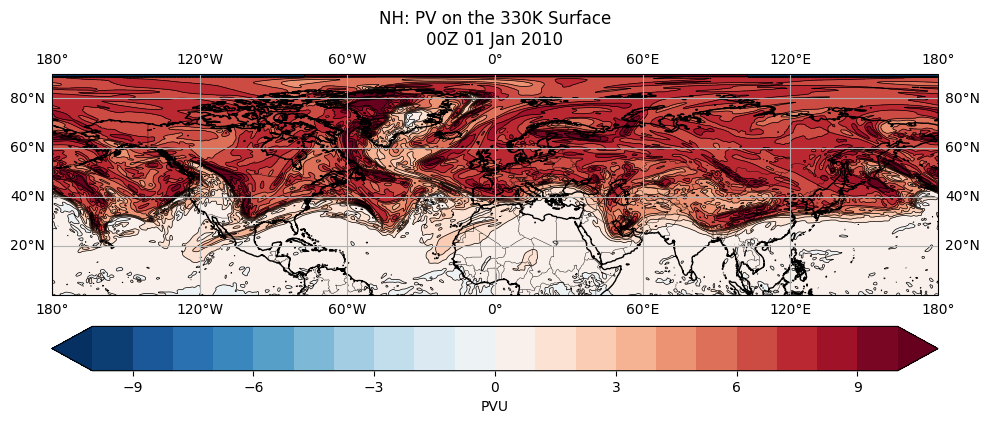

In [50]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime

# ------------------------------------------------------------------
# 1. FILE PATH
# ------------------------------------------------------------------
file_path = r"C:\Users\moham\OneDrive\Documents\stage\98a4d3ee3b3b8aa12699f1286ad0843f.nc"

# ------------------------------------------------------------------
# 2. LOAD DATA
# ------------------------------------------------------------------
ds  = xr.open_dataset(file_path)
t   = ds['t'].isel(valid_time=0).values
u   = ds['u'].isel(valid_time=0).values
v   = ds['v'].isel(valid_time=0).values
lat = ds['latitude'].values
lon = ds['longitude'].values
plev= ds['pressure_level'].values * 100  # hPa → Pa

# ------------------------------------------------------------------
# 3. CONSTANTS
# ------------------------------------------------------------------
a     = 6.371e6
g     = 9.80665
Rd    = 287.05
cp    = 1004.5
kappa = Rd / cp
omega = 7.292e-5
pi    = np.pi

# 2D grids
lon2d, lat2d = np.meshgrid(lon, lat)
phi = np.deg2rad(lat2d)
f   = 2 * omega * np.sin(phi)

# Metric terms
dx = a * np.cos(phi) * np.deg2rad(np.gradient(lon))[np.newaxis, :]
dy = a * np.deg2rad(np.gradient(lat))[:, np.newaxis]
dx3 = np.broadcast_to(dx, t.shape)
dy3 = np.broadcast_to(dy, t.shape)
f3  = np.broadcast_to(f , t.shape)

# ------------------------------------------------------------------
# 4. THETA & PV
# ------------------------------------------------------------------
theta = t * (1e5 / plev[:, None, None]) ** kappa
dθ_dp = np.gradient(theta, plev, axis=0)
dθ_dx = np.gradient(theta, axis=2) / dx3
dθ_dy = np.gradient(theta, axis=1) / dy3
du_dp = np.gradient(u, plev, axis=0)
dv_dp = np.gradient(v, plev, axis=0)
dv_dx = np.gradient(v, axis=2) / dx3
ducos_dy = np.gradient(u * np.cos(phi), axis=1) / dy3
zeta = dv_dx - (1 / np.cos(phi)) * ducos_dy

PV = -g * ((zeta + f3) * dθ_dp + dθ_dx * dv_dp - dθ_dy * du_dp)
PVU = PV / 1e-6  # [PVU] = 1e-6 K·m²·kg⁻¹·s⁻¹

# ------------------------------------------------------------------
# 5. INTERPOLATE PV TO 330 K ISENTROPIC SURFACE
# ------------------------------------------------------------------
theta_target = 330
pv330 = np.full((len(lat), len(lon)), np.nan)

for j in range(len(lat)):
    for i in range(len(lon)):
        for k in range(len(plev) - 1):
            th1 = theta[k  , j, i]
            th2 = theta[k+1, j, i]
            if th1 <= theta_target <= th2 or th2 <= theta_target <= th1:
                pvu1 = PVU[k  , j, i]
                pvu2 = PVU[k+1, j, i]
                # linear interp
                w = (theta_target - th1) / (th2 - th1)
                pv330[j, i] = (1 - w) * pvu1 + w * pvu2
                break

# Optional smoothing
pv330 = gaussian_filter(pv330, sigma=1)

# ------------------------------------------------------------------
# 6. PLOT
# ------------------------------------------------------------------
# Mask southern latitudes
lat_mask = lat >= 0
pv330_nh = pv330[lat_mask, :]
lat_nh = lat[lat_mask]

fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, 0, 90], crs=ccrs.PlateCarree())  # NH view
clevs = np.linspace(-10, 10, 21)

cf = ax.contourf(lon, lat_nh, pv330_nh, levels=clevs, cmap='RdBu_r', extend='both')
cs = ax.contour(lon, lat_nh, pv330_nh, levels=clevs, colors='k', linewidths=0.5)
cbar = plt.colorbar(cf, orientation='horizontal', pad=0.07)
cbar.set_label("PVU")

ax.coastlines('50m')
ax.add_feature(cfeature.BORDERS, linewidth=0.3)
ax.gridlines(draw_labels=True)

fdate = datetime.strptime("20100101", '%Y%m%d').strftime('%d %b %Y')
plt.title(f"NH: PV on the 330K Surface\n00Z {fdate}")
plt.tight_layout()
plt.show()


In [51]:
print(ds.data_vars)


Data variables:
    z        (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    o3       (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    pv       (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    q        (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    t        (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    u        (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    v        (valid_time, pressure_level, latitude, longitude) float32 154MB ...


In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

# ---------------------------------------------------
# 1. Load Data
# ---------------------------------------------------
file_path = r"C:\Users\moham\OneDrive\Documents\stage\98a4d3ee3b3b8aa12699f1286ad0843f.nc"
ds = xr.open_dataset(file_path)

t = ds['t'].isel(valid_time=0).values
z = ds['z'].isel(valid_time=0).values
pv = ds['pv'].isel(valid_time=0).values
u = ds['u'].isel(valid_time=0).values

plev = ds['pressure_level'].values
lat = ds['latitude'].values
lon = ds['longitude'].values

g = 9.80665

z_height = z / g
pv = pv / 1e-6  # Ensure pv is in PVU!

# ---------------------------------------------------
# 2. Thermal Tropopause
# ---------------------------------------------------
thermal_tp = []

for j in range(len(lat)):
    found = False
    for k in range(len(plev) - 1):
        T1 = t[k, j, :].mean()
        T2 = t[k + 1, j, :].mean()
        Z1 = z_height[k, j, :].mean()
        Z2 = z_height[k + 1, j, :].mean()

        dT = T2 - T1
        dZ = Z2 - Z1

        if dZ != 0:
            lapse_rate = -dT / dZ * 1000
            if lapse_rate <= 2:
                thermal_tp.append((lat[j], plev[k]))
                found = True
                break
    if not found:
        thermal_tp.append((lat[j], np.nan))

# ---------------------------------------------------
# 3. Dynamical Tropopause
# ---------------------------------------------------
dyn_tp = []

for j in range(len(lat)):
    found = False
    for k in range(len(plev)):
        pv_mean = pv[k, j, :].mean()
        if pv_mean >= 2:
            dyn_tp.append((lat[j], plev[k]))
            found = True
            break
    if not found:
        dyn_tp.append((lat[j], np.nan))

# ---------------------------------------------------
# 4. Mean Zonal Wind
# ---------------------------------------------------
u_mean = u.mean(axis=2)  # Zonal mean: (pressure_level, latitude)

# ---------------------------------------------------
# 5. Plot Latitude–Pressure with Wind Contours
# ---------------------------------------------------
thermal_lat, thermal_p = zip(*thermal_tp)
dyn_lat, dyn_p = zip(*dyn_tp)

fig, ax = plt.subplots(figsize=(8, 6))
ax.invert_yaxis()
ax.set_yscale("log")
ax.set_ylabel("Pressure (hPa)")
ax.set_xlabel("Latitude (degrees north)")

# Set custom y-axis ticks
ax.set_yticks([1000, 850, 700, 500, 300, 200, 100, 50, 10])
ax.get_yaxis().set_major_formatter(plt.ScalarFormatter())

# Plot zonal wind contours
cs = ax.contour(lat, plev, u_mean, colors='black', linewidths=0.7, levels=np.arange(-40, 45, 5))
ax.clabel(cs, fmt='%d', fontsize=7)

# Plot tropopauses
ax.plot(thermal_lat, thermal_p, 'ro', markersize=2, label='Thermal Tropopause (WMO)')
ax.plot(dyn_lat, dyn_p, 'g-', linewidth=1.5, label='Dynamical Tropopause (2 PVU)')

ax.set_title("Thermal/Dynamical Tropopause + Zonal Wind — 1 Jan 2010 00:00 UTC")
ax.legend()
ax.grid(True, which="both", linestyle='--')

plt.tight_layout()
plt.show()



SyntaxError: invalid syntax (4043193282.py, line 59)

In [ ]:
import xarray as xr
import matplotlib.colors as mcolors
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
from scipy.ndimage import gaussian_filter

In [ ]:
import xarray as xr
import matplotlib.colors as mcolors
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
from scipy.ndimage import gaussian_filter

In [ ]:
# Load the temperature dataset (ERA5)
file_path = 'C:\\Users\\moham\\OneDrive\\Documents\\stage\\8e510dccf46b7ff16b18c6aa68be9da0.nc'

t_ds = xr.open_dataset(file_path)  # Adjust with your correct path

# Inspect temperature data
print(t_ds)

# Load the potential vorticity dataset
file_path1 = 'C:\\Users\\moham\\OneDrive\\Documents\\stage\\363cd0f107bb164d13a851710644a260.nc'

pv_ds = xr.open_dataset(file_path1) # Adjust with your correct path

# Inspect PV data
print(pv_ds)


<xarray.Dataset> Size: 125MB
Dimensions:         (valid_time: 1, pressure_level: 6, latitude: 721,
                     longitude: 1440)
Coordinates:
    number          int64 8B ...
  * valid_time      (valid_time) datetime64[ns] 8B 2010-01-01
  * pressure_level  (pressure_level) float64 48B 1e+03 850.0 ... 200.0 100.0
  * latitude        (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
  * longitude       (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
    expver          <U4 16B ...
Data variables:
    o3              (valid_time, pressure_level, latitude, longitude) float32 25MB ...
    q               (valid_time, pressure_level, latitude, longitude) float32 25MB ...
    t               (valid_time, pressure_level, latitude, longitude) float32 25MB ...
    u               (valid_time, pressure_level, latitude, longitude) float32 25MB ...
    v               (valid_time, pressure_level, latitude, longitude) float32 25MB ...
Attributes:
    GRIB_centre:           

In [ ]:
# Select the temperatures for 9.6µm (100 hPa) and 10.8µm (300 hPa)
t100 = t_ds["t"].sel(pressure_level=100.0).isel(valid_time=0)  # 9.6 µm band
t300 = t_ds["t"].sel(pressure_level=300.0).isel(valid_time=0)  # 10.8 µm band

# Compute the brightness temperature difference (BTD)
BT_diff = t100 - t300  # shape: (latitude, longitude)

# Calculate the zonal mean over longitude (latitude vs pressure)
BT_diff_zonal_mean = BT_diff.mean(dim="longitude")  # shape: (latitude,)


In [ ]:
# Create a 2D array for plotting: repeat BTD zonal mean across pressure levels
plevs = t_ds["pressure_level"].values
lat = t_ds["latitude"].values
BTD_plot = np.tile(BT_diff_zonal_mean.values, (len(plevs), 1))  # shape: (pressure, lat)


In [ ]:
# Convert PV to PVU (Potential Vorticity Unit)
PV_PVU = (pv_ds["pv"] / 1e-6).isel(valid_time=0)  # Units in PVU, shape: (pressure_level, latitude, longitude)

# Zonal mean over longitude
PV_zonal = PV_PVU.mean(dim="longitude")  # shape: (pressure_level, latitude)

# Initialize an array for storing the 2 PVU tropopause pressure levels
p_tropo = np.full(len(lat), np.nan)

# Loop over latitudes to find the first pressure level where PV >= 2 PVU
for i in range(len(lat)):
    profile = PV_zonal[:, i].values
    above = np.where(profile >= 2)[0]
    if len(above) > 0:
        p_tropo[i] = plevs[above[0]]  # first level with PV >= 2


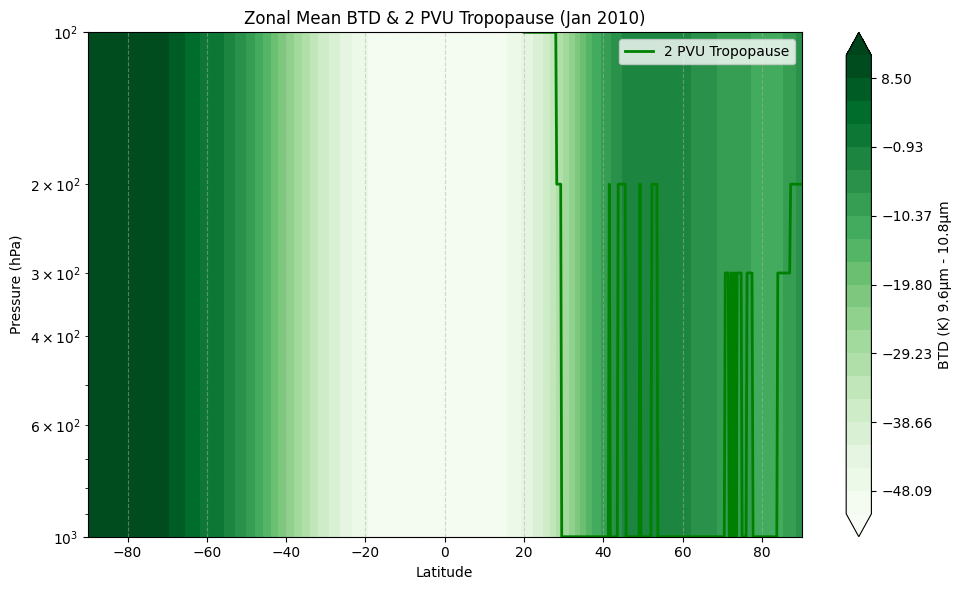

In [ ]:
# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Contour plot for the BTD (green component of the Air Mass RGB)
levels = np.linspace(np.nanmin(BTD_plot), np.nanmax(BTD_plot), 21)
cf = ax.contourf(lat, plevs, BTD_plot, levels=levels, cmap="Greens", extend="both")
cbar = plt.colorbar(cf, ax=ax, label="BTD (K) 9.6µm - 10.8µm")

# Overlay the 2 PVU tropopause
ax.plot(lat, p_tropo, 'g-', linewidth=2, label="2 PVU Tropopause")

# Axis formatting
ax.set_yscale("log")
ax.invert_yaxis()
ax.set_ylabel("Pressure (hPa)")
ax.set_xlabel("Latitude")
ax.set_title("Zonal Mean BTD & 2 PVU Tropopause (Jan 2010)")
ax.legend()
ax.grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()


In [ ]:
# Extract temperature at the 300 hPa and 200 hPa levels
T_300 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 300 hPa
T_200 = t_ds['t'].sel(pressure_level=200.0).values  # Temperature at 200 hPa
# Calculate the brightness temperature difference (T_9.6 - T_10.8)
BT_diff = T_200 - T_300  # Using the temperature data for simplicity; you can refine this based on actual bands



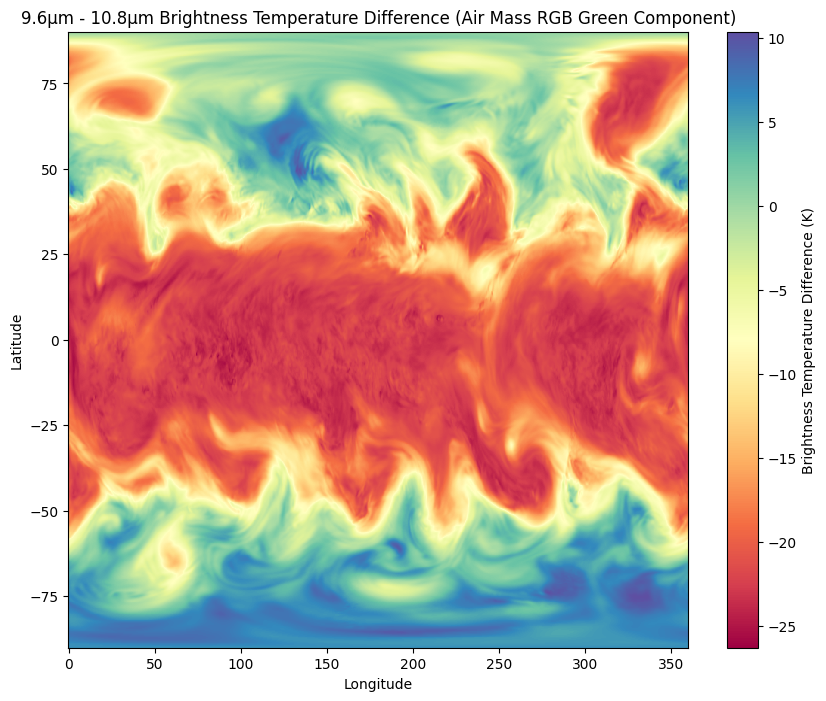

In [ ]:
# Plotting the difference as a map (green component of the Air Mass RGB)
fig, ax = plt.subplots(figsize=(10, 8))
cmap = plt.get_cmap('Spectral')  # Adjust colormap for the RGB look

# Plot the BT difference as a map
pcm = ax.pcolormesh(t_ds['longitude'], t_ds['latitude'], BT_diff[0, :, :], cmap=cmap, shading='auto')  # Extract first valid_time
fig.colorbar(pcm, ax=ax, label='Brightness Temperature Difference (K)')
ax.set_title('9.6µm - 10.8µm Brightness Temperature Difference (Air Mass RGB Green Component)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()


In [ ]:
T_9_6 = t_ds['t'].sel(pressure_level=100.0).values  # Temperature at 9.6µm (ozone-sensitive)
T_10_8 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 10.8µm (window channel)



In [ ]:
# Calculate the Green component (9.6µm - 10.8µm brightness temperature difference)
Green_component = T_9_6 - T_10_8

# Calculate the Red component (difference between 6.2µm and 7.3µm)
T_6_2 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 6.2µm
T_7_3 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 7.3µm
Red_component = T_6_2 - T_7_3  # Red component (difference between 6.2µm and 7.3µm)

# Invert the 6.2µm temperature for the blue component
Blue_component = -T_6_2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-247.13837..18.205719].


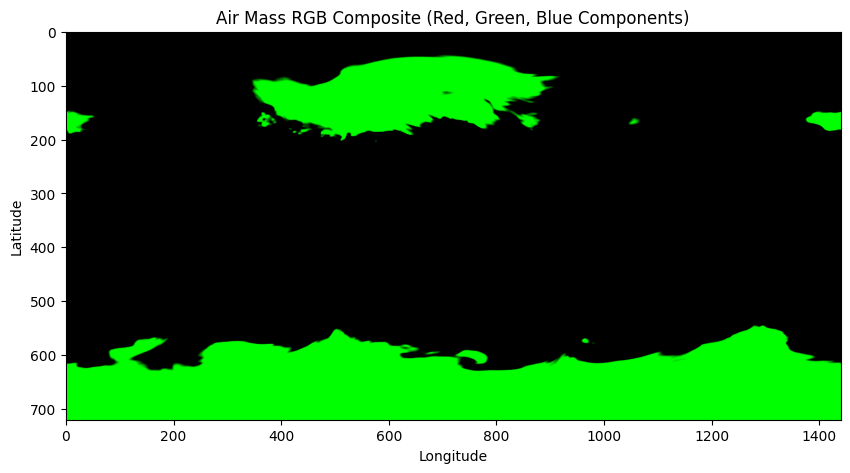

In [ ]:

# Select the data for the first valid_time (as a single slice for visualization)
Red_component_scaled = Red_component[0, :, :]
Green_component_scaled = Green_component[0, :, :]
Blue_component_scaled = Blue_component[0, :, :]


# Stack the RGB components into a single 3D array with shape (latitude, longitude, 3)
RGB_image = np.stack((Red_component_scaled, Green_component_scaled, Blue_component_scaled), axis=-1)

# Plot the final RGB image
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(RGB_image)
ax.set_title('Air Mass RGB Composite (Red, Green, Blue Components)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


Key Changes:
Red Component: Based on the difference between 6.2µm and 7.3µm, using 200 hPa for 6.2µm and 300 hPa for 7.3µm.

Green Component: Calculated as the difference between 9.6µm and 10.8µm temperatures.

Blue Component: Set as the negative value of the 6.2µm temperature.

Normalization: All components are normalized to the range [0, 1] to ensure proper balance in the RGB plot.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.patches as mpatches

In [ ]:
# Convert Green_component_scaled to a DataArray if it's not already
Green_component_scaled = xr.DataArray(Green_component_scaled, coords=[lat, np.arange(Green_component_scaled.shape[1])], dims=["latitude", "longitude"])

# Compute the zonal mean (average over longitude) for the Green component
Green_component_zonal_mean = Green_component_scaled.mean(dim='longitude')  # shape: (latitude,)

# Find latitudes where the Green component is below the threshold (approximates tropopause)
green_threshold = np.percentile(Green_component_zonal_mean, 20)  # 20th percentile as an example
tropopause_latitudes = lat[Green_component_zonal_mean < green_threshold]


In [ ]:
# Loop through latitudes where Green component is below the threshold
for i in range(len(tropopause_latitudes)):
    # Find the corresponding pressure level based on the Green component threshold
    if Green_component_zonal_mean[i] < green_threshold:  # use zonal mean instead
        p_tropo_estimated[i] = plevs[i]  # Get the pressure level where Green component is below the threshold


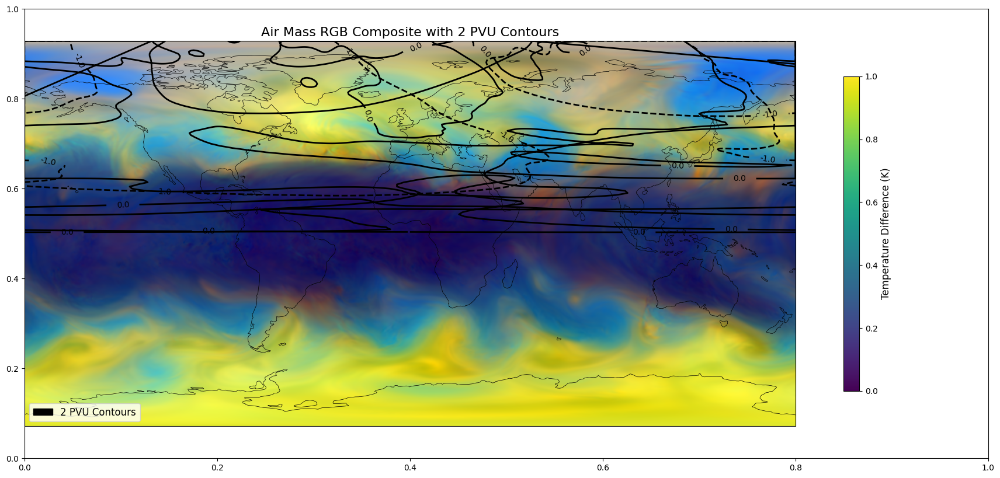

In [ ]:
# Extract temperatures for the 6.2µm and 7.3µm channels (use correct pressure levels)
T_6_2 = t_ds['t'].sel(pressure_level=200.0).values  # Temperature at 6.2µm (use correct pressure level)
T_7_3 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 7.3µm (use correct pressure level)

# Calculate the red component (difference between 6.2µm and 7.3µm)
Red_component = T_6_2 - T_7_3  # Invert the 6.2µm temperature for the blue component
Blue_component = -T_6_2  # Negative of the 6.2µm temperature for blue

# Extract temperatures for the 9.6µm and 10.8µm channels (use correct pressure levels)
T_9_6 = t_ds['t'].sel(pressure_level=100.0).values  # Temperature at 9.6µm (ozone-sensitive)
T_10_8 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 10.8µm (window channel)

# Calculate the green component (difference between 9.6µm and 10.8µm)
Green_component = T_9_6 - T_10_8

# Select the data for the first valid_time (as a single slice for visualization)
Red_component_scaled = Red_component[0, :, :]
Green_component_scaled = Green_component[0, :, :]
Blue_component_scaled = Blue_component[0, :, :]

# Normalize each component to be in the range [0, 1]
Red_component_scaled = (Red_component_scaled - np.min(Red_component_scaled)) / (np.max(Red_component_scaled) - np.min(Red_component_scaled))
Green_component_scaled = (Green_component_scaled - np.min(Green_component_scaled)) / (np.max(Green_component_scaled) - np.min(Green_component_scaled))
Blue_component_scaled = (Blue_component_scaled - np.min(Blue_component_scaled)) / (np.max(Blue_component_scaled) - np.min(Blue_component_scaled))

# Stack the RGB components into a single 3D array with shape (latitude, longitude, 3)
RGB_image = np.stack((Red_component_scaled, Green_component_scaled, Blue_component_scaled), axis=-1)

# Calculate the potential vorticity (PV) based on the temperature difference
# For simplicity, we assume PV is proportional to the temperature difference (scaled to PVU)
# We are using a basic temperature difference proxy for the PV calculation

temperature_diff = T_6_2 - T_7_3  # Difference between the 200hPa and 300hPa temperatures
PVU = temperature_diff / np.max(np.abs(temperature_diff)) * 2  # Normalize to 2 PVU range

# Plot the final RGB image with Earth contours and PVU
fig, ax = plt.subplots(figsize=(12, 10))

# Set up a PlateCarree projection (global latitude-longitude grid)
ax = plt.axes(projection=ccrs.PlateCarree())

# Add coastlines without country boundaries
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)

# Define the map extent (optional, but helps focus the region)
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())  # Limits for global view

# Display the RGB image with transformation to match the projection
im = ax.imshow(RGB_image, transform=ccrs.PlateCarree(), origin='upper', extent=[-180, 180, -90, 90])

# Add a colorbar for the RGB image and adjust its position
cbar = plt.colorbar(im, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('Temperature Difference (K)', fontsize=12)

# Add PVU contours on top of the RGB image
# Contour the PVU data with a specific range to highlight 2 PVU
CS = ax.contour(PVU[0, :, :], levels=np.linspace(-2, 2, 5), transform=ccrs.PlateCarree(), colors='black', linewidths=2)

# Remove contour labels (numbers) from the map
ax.clabel(CS, inline=True, fontsize=10, inline_spacing=5, fmt="%2.1f", use_clabeltext=False)

# Create a custom legend for the contour lines inside the plot (without covering the map)
contour_patch = mpatches.Patch(color='black', label='2 PVU Contours')
plt.legend(handles=[contour_patch], loc='lower left', fontsize=12)

# Adjust layout to center the plot and colorbar, ensuring the legend fits within the plot
plt.subplots_adjust(right=1.5)  # Move the colorbar to the right




# Set title and labels
ax.set_title('Air Mass RGB Composite with 2 PVU Contours', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()



θ-proxy range: 0.03463017 2.0


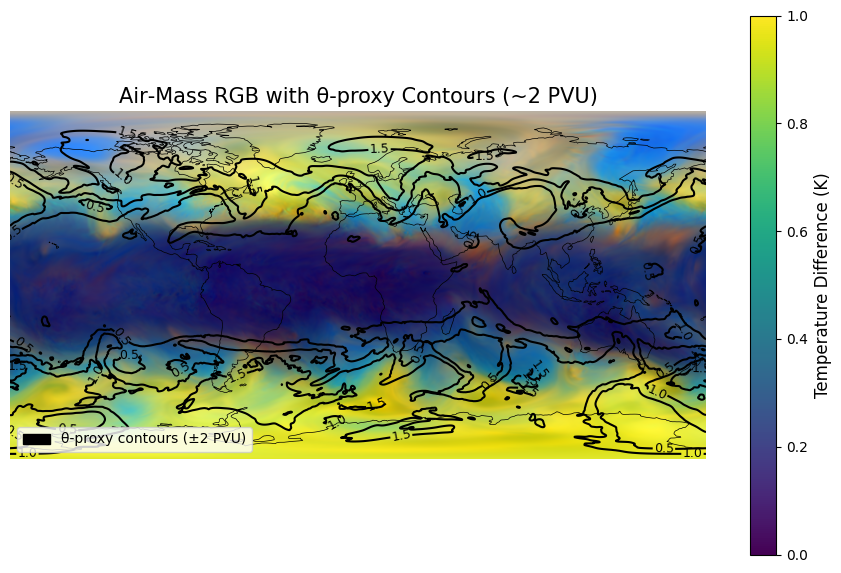

In [ ]:
# --- Inputs from your dataset -------------------------------------
T_6_2 = t_ds['t'].sel(pressure_level=200.0).values
T_7_3 = t_ds['t'].sel(pressure_level=300.0).values
T_9_6 = t_ds['t'].sel(pressure_level=100.0).values
T_10_8 = t_ds['t'].sel(pressure_level=300.0).values

# --- RGB channels --------------------------------------------------
red   = T_6_2 - T_7_3
green = T_9_6 - T_10_8
blue  = -T_6_2

def norm(x):
    return (x - x.min()) / (x.max() - x.min())

r = norm(red  [0])
g = norm(green[0])
b = norm(blue [0])
rgb_img = np.stack((r, g, b), axis=-1)

# --- PVU proxy from potential temperature --------------------------
kappa = 0.286
theta_200 = T_6_2 * (1000 / 200)**kappa
theta_300 = T_7_3 * (1000 / 300)**kappa
theta_diff = theta_200 - theta_300

# Normalize to range -2 to +2
theta_proxy = 2 * theta_diff / np.max(np.abs(theta_diff))
pv_proxy_0 = theta_proxy[0]

# DEBUG: print actual min/max
print("θ-proxy range:", pv_proxy_0.min(), pv_proxy_0.max())

# --- Map -----------------------------------------------------------
fig = plt.figure(figsize=(12, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())

# Show RGB image
img = ax.imshow(rgb_img, extent=[-180, 180, -90, 90],
                transform=ccrs.PlateCarree(), origin='upper')

# Coastlines
ax.add_feature(cfeature.COASTLINE, lw=0.5)

# Contour PVU proxy
levels = np.linspace(-2, 2, 9)  # includes ±2
CS = ax.contour(pv_proxy_0, levels=levels,
                colors='black', linewidths=1.5,
                transform=ccrs.PlateCarree(), extent=[-180, 180, -90, 90])

# Add contour labels (inline text)
ax.clabel(CS, fmt="%.1f", fontsize=9, inline=True)


# Optional: Add labels
# ax.clabel(CS, fmt="%.1f", fontsize=8)

# Legend
patch = mpatches.Patch(color='black', label='θ‑proxy contours (±2 PVU)')
ax.legend(handles=[patch], loc='lower left')

# Hide axes, borders
ax.set_xticks([])
ax.set_yticks([])
ax.grid(False)
for spine in ax.spines.values():
    spine.set_visible(False)

# Colorbar (invisible image for scaling)
# Display the RGB image with transformation to match the projection
im = ax.imshow(RGB_image, transform=ccrs.PlateCarree(), origin='upper', extent=[-180, 180, -90, 90])

# Add a colorbar for the RGB image and adjust its position
cbar = plt.colorbar(im, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('Temperature Difference (K)', fontsize=12)

# Title
ax.set_title("Air‑Mass RGB with θ‑proxy Contours (~2 PVU)", fontsize=15)

plt.subplots_adjust(right=0.85)
plt.show()



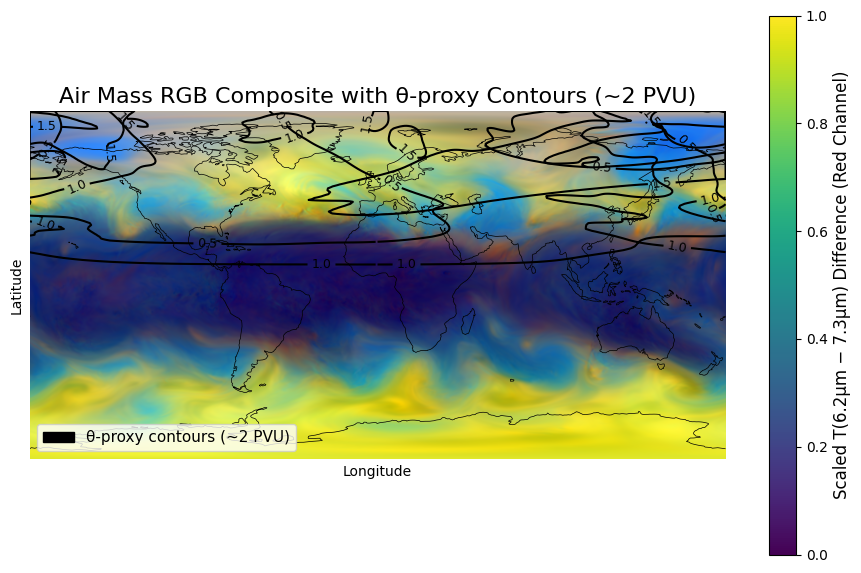

In [ ]:
# --- Inputs from your dataset -------------------------------------
T_6_2   = t_ds['t'].sel(pressure_level=200.0).values  # 6.2µm (200 hPa)
T_7_3   = t_ds['t'].sel(pressure_level=300.0).values  # 7.3µm (300 hPa)
T_9_6   = t_ds['t'].sel(pressure_level=100.0).values  # 9.6µm (100 hPa)
T_10_8  = t_ds['t'].sel(pressure_level=300.0).values  # 10.8µm (300 hPa)

# --- Compute RGB components ---------------------------------------
Red_component   = T_6_2 - T_7_3
Green_component = T_9_6 - T_10_8
Blue_component  = -T_6_2

# Take the first time step for each channel
R = Red_component[0]
G = Green_component[0]
B = Blue_component[0]

# Normalize to [0, 1]
def norm(x): return (x - x.min()) / (x.max() - x.min())
R_scaled = norm(R)
G_scaled = norm(G)
B_scaled = norm(B)

# Stack into RGB image
RGB_image = np.stack((R_scaled, G_scaled, B_scaled), axis=-1)

# --- Compute PVU proxy from potential temperature -----------------
kappa = 0.286
theta_200 = T_6_2 * (1000 / 200)**kappa
theta_300 = T_7_3 * (1000 / 300)**kappa
theta_diff = theta_200 - theta_300
theta_proxy = 2 * theta_diff / np.max(np.abs(theta_diff))  # scaled proxy
PVU = theta_proxy[0]  # First time step

# --- Plotting -----------------------------------------------------
fig = plt.figure(figsize=(12, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)

# Show RGB image
ax.imshow(RGB_image, transform=ccrs.PlateCarree(), origin='upper',
          extent=[-180, 180, -90, 90])

# --- Colorbar (based on red component to reflect temperature diff) --
im = ax.imshow(RGB_image, transform=ccrs.PlateCarree(), origin='upper', extent=[-180, 180, -90, 90])

# Add a colorbar for the RGB image and adjust its position
cbar = plt.colorbar(im, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('Scaled T(6.2μm − 7.3μm) Difference (Red Channel)', fontsize=12)

# --- Contours of PVU proxy -----------------------------------------
levels = np.linspace(-2, 2, 9)
CS = ax.contour(PVU, levels=levels, transform=ccrs.PlateCarree(),
                colors='black', linewidths=1.5)
ax.clabel(CS, fmt="%.1f", fontsize=9, inline=True)

# --- Legend for contours -------------------------------------------
patch = mpatches.Patch(color='black', label='θ‑proxy contours (~2 PVU)')
ax.legend(handles=[patch], loc='lower left', fontsize=11)

# --- Clean figure --------------------------------------------------
ax.set_xticks([]); ax.set_yticks([])
ax.grid(False)
for spine in ax.spines.values():
    spine.set_visible(False)

# --- Title and layout ----------------------------------------------
ax.set_title("Air Mass RGB Composite with θ‑proxy Contours (~2 PVU)", fontsize=16)
ax.set_xlabel('Longitude'); ax.set_ylabel('Latitude')
plt.subplots_adjust(right=0.85)
plt.show()


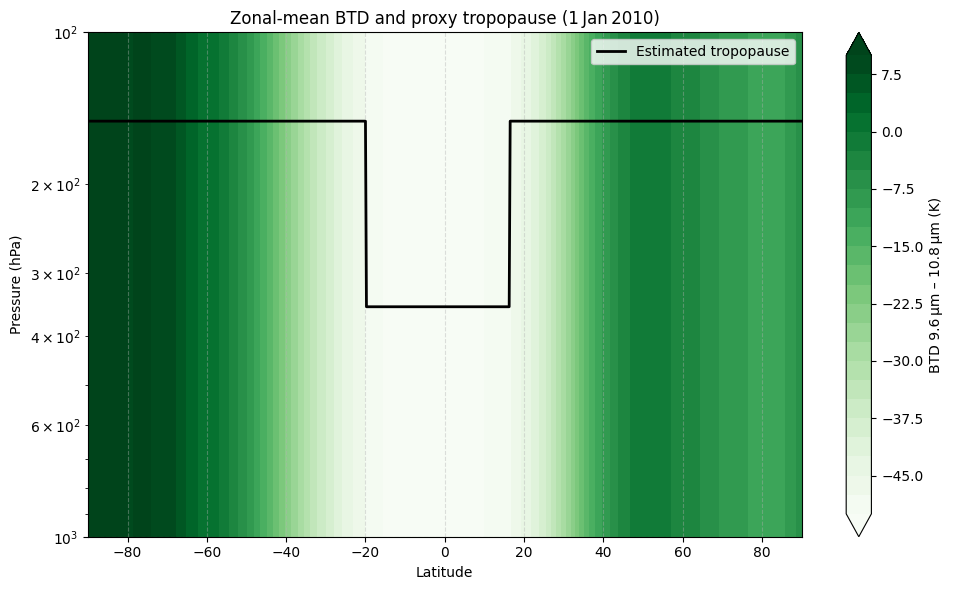

In [ ]:
lat  = t_ds['latitude'].values
plev = t_ds['pressure_level'].values              # 6 pressure levels

t100 = t_ds['t'].sel(pressure_level=100).isel(valid_time=0)
t300 = t_ds['t'].sel(pressure_level=300).isel(valid_time=0)

BT_diff = (t100 - t300)                         # 9.6 µm – 10.8 µm
green_zonal = BT_diff.mean(dim='longitude').values   # 1‑D (lat)

# replicate on every pressure level → 2‑D field (pressure, lat)
BTD_field = np.tile(green_zonal, (len(plev), 1))

# ------------------------------------------------------------
# 2.  ESTIMATE A TROPOPAUSE PRESSURE FROM THE GREEN COMPONENT
#     (very simple rule: above a threshold = high tropopause,
#     below = low tropopause — replace by your own logic)
# ------------------------------------------------------------
thr = np.percentile(green_zonal, 20)            # 20‑th percentile
p_high, p_low = 150, 350                        # hPa you want to show

p_tropo = np.where(green_zonal > thr, p_high, p_low)

# ------------------------------------------------------------
# 3.  PLOT LAT‑PRESSURE SECTION WITH TROPOPAUSE OVERLAY
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 6))

cf = ax.contourf(lat, plev, BTD_field,
                 levels=30, cmap='Greens', extend='both')
cbar = fig.colorbar(cf, ax=ax, label='BTD 9.6 µm – 10.8 µm (K)')

ax.plot(lat, p_tropo, 'k-', lw=2, label='Estimated tropopause')

ax.set_yscale('log'); ax.invert_yaxis()
ax.set_xlabel('Latitude'); ax.set_ylabel('Pressure (hPa)')
ax.set_title('Zonal‑mean BTD and proxy tropopause (1 Jan 2010)')
ax.grid(ls='--', alpha=.4); ax.legend()
plt.tight_layout(); plt.show()

In [ ]:
# ----------------------------------------------------------------------------------
# Dynamic tropopause (2 PVU) from a local ERA5 pressure‑level file
# ----------------------------------------------------------------------------------
#
# Requires:  xarray, numpy, matplotlib, cartopy (for the map)
# ----------------------------------------------------------------------------------



# ------------------------------------------------------------
# 1.  LOAD DATA  (adjust path if needed)
# ------------------------------------------------------------
file_path = r"C:\Users\moham\OneDrive\Documents\stage\8e510dccf46b7ff16b18c6aa68be9da0.nc"
ds = xr.open_dataset(file_path)


In [ ]:

# work with first (and only) time slice
t  = ds['t' ].isel(valid_time=0)        # K
u  = ds['u' ].isel(valid_time=0)        # m s‑1
v  = ds['v' ].isel(valid_time=0)        # m s‑1
lev = ds['pressure_level'].values * 100   # hPa → Pa
lat = ds['latitude'       ].values
lon = ds['longitude'      ].values


In [ ]:

# ------------------------------------------------------------
# 2.  CONSTANTS & HELPER GRIDS
# ------------------------------------------------------------
a      = 6.371e6               # Earth radius  (m)
g      = 9.80665               # gravity       (m s‑2)
omega  = 7.292e-5              # rotation      (rad s‑1)
Rd     = 287.05                # dry‑air gas constant
cp     = 1004.5
kappa   = Rd/cp


In [ ]:

# 2‑D lat/lon grids & metric factors
lon2d, lat2d = np.meshgrid(lon, lat)
phi = np.deg2rad(lat2d)
dlon = np.deg2rad( np.gradient(lon) )[np.newaxis, :]
dlat = np.deg2rad( np.gradient(lat) )[:, np.newaxis]
dx   = a * np.cos(phi) * dlon        # m
dy   = a * dlat                      # m
f    = 2 * omega * np.sin(phi)       # Coriolis (s‑1)


In [ ]:

# broadcast metric grids to 3‑D (level,lat,lon)
dx3 = np.broadcast_to(dx  , t.shape)
dy3 = np.broadcast_to(dy  , t.shape)
f3  = np.broadcast_to(f   , t.shape)


In [ ]:

# ------------------------------------------------------------
# 3.  POTENTIAL TEMPERATURE & ITS DERIVATIVES
# ------------------------------------------------------------
theta = t * (1e5 / lev[:, None, None])**kappa          # K

dθ_dp = np.gradient(theta, lev, axis=0)                # ∂θ/∂p   (K Pa‑1)
dθ_dx = np.gradient(theta, axis=2) / dx3               # ∂θ/∂x   (K m‑1)
dθ_dy = np.gradient(theta, axis=1) / dy3               # ∂θ/∂y   (K m‑1)


In [ ]:

# ------------------------------------------------------------
# 4.  WIND VERTICAL DERIVATIVES
# ------------------------------------------------------------
du_dp = np.gradient(u, lev, axis=0)                    # ∂u/∂p
dv_dp = np.gradient(v, lev, axis=0)                    # ∂v/∂p


In [ ]:

# ------------------------------------------------------------
# 5.  ABSOLUTE VORTICITY ζ                         (s‑1)
#     ζ = ∂v/∂x  – ∂(u cosφ)/∂y / cosφ
# ------------------------------------------------------------
dv_dx    = np.gradient(v        , axis=2) / dx3
ducos_dy = np.gradient(u*np.cos(phi), axis=1) / dy3
zeta     = dv_dx - (1/np.cos(phi)) * ducos_dy


In [ ]:

# ------------------------------------------------------------
# 6.  ERTEL PV  (in SI units  m² s‑¹ K kg‑¹)
#    PV = -g * [ (ζ+f) ∂θ/∂p  +   ∂θ/∂x ∂v/∂p  -  ∂θ/∂y ∂u/∂p ]
# ------------------------------------------------------------
PV = -g * ( (zeta+f3)*dθ_dp + dθ_dx*dv_dp - dθ_dy*du_dp )

# convert to PVU (1 PVU = 1e‑6 K m² kg‑¹ s‑¹)
PVU = PV / 1e-6


In [ ]:

# ------------------------------------------------------------
# 7.  FIND FIRST LEVEL WHERE PVU ≥ 2
# ------------------------------------------------------------
tropo_p = np.full_like(lat, np.nan, dtype=float)   # 1‑D (lat)

for j in range(len(lat)):
    # profile versus levels (top‑down search: lowest p = index‑5)
    for k in range(len(lev)-1, -1, -1):
        if PVU[k, j, :].mean() >= 2:     # zonal‑mean criterion
            tropo_p[j] = lev[k]/100      # store in hPa
            break


In [ ]:

# ------------------------------------------------------------
# 8.  QUICK MAP OF 2‑PVU TROPOPAUSE PRESSURE
# ------------------------------------------------------------

# Select data at 300 hPa (index 3 in your case)
pvu_300 = PVU[3, :, :]  # shape: (lat, lon)

# Mask invalid values to avoid plot crashes
pvu_300 = np.ma.masked_invalid(pvu_300)


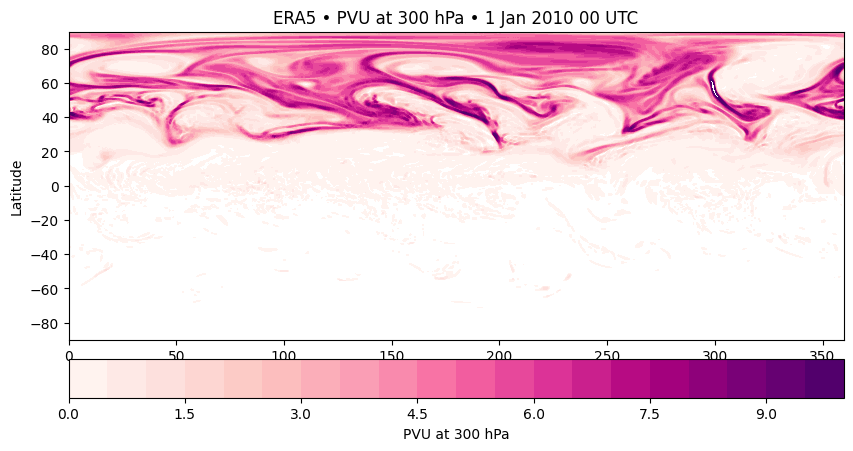

In [ ]:

# Plot in lat/lon coordinates (no projection)
fig, ax = plt.subplots(figsize=(10, 5))
cf = ax.contourf(lon, lat, pvu_300, levels=np.linspace(0, 10, 21), cmap='RdPu')
cbar = plt.colorbar(cf, orientation='horizontal', pad=0.05)
cbar.set_label('PVU at 300 hPa')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('ERA5 • PVU at 300 hPa • 1 Jan 2010 00 UTC')
plt.show()


C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3123005714.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx200 = int(np.where(plev_vals == 200)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3123005714.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx100 = int(np.where(plev_vals == 100)[0])


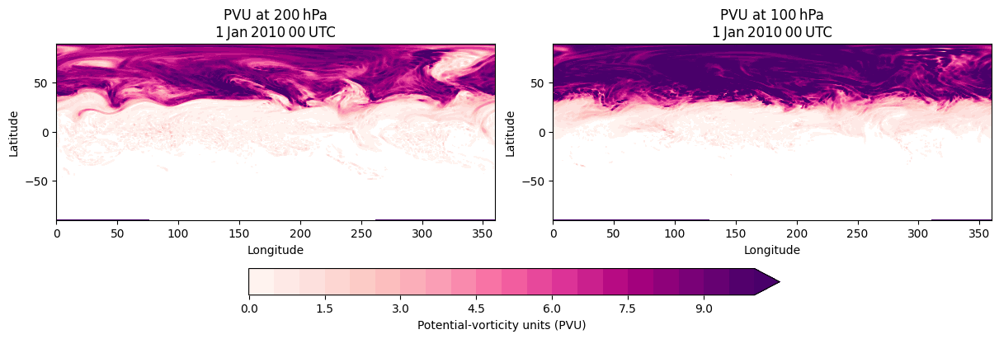

In [ ]:
# ------------------------------------------------------------------
# 1.  locate the indices of 200 hPa and 100 hPa in the pressure grid
# ------------------------------------------------------------------
plev_vals = ds['pressure_level'].values          # [1000, 850, 500, 300, 200, 100]
idx200 = int(np.where(plev_vals == 200)[0])
idx100 = int(np.where(plev_vals == 100)[0])

# ------------------------------------------------------------------
# 2.  extract and mask PVU fields
# ------------------------------------------------------------------
pvu_200 = np.ma.masked_invalid(PVU[idx200, :, :])   # shape (lat, lon)
pvu_100 = np.ma.masked_invalid(PVU[idx100, :, :])

# ------------------------------------------------------------------
# 3.  quick plots (lat–lon in degrees)
# ------------------------------------------------------------------
levels = np.linspace(0, 10, 21)   # PVU contours 0‑10

fig, axs = plt.subplots(1, 2, figsize=(12, 4), constrained_layout=True)

cf1 = axs[0].contourf(lon, lat, pvu_200, levels=levels, cmap='RdPu', extend='max')
axs[0].set_title('PVU at 200 hPa\n1 Jan 2010 00 UTC')
axs[0].set_xlabel('Longitude'); axs[0].set_ylabel('Latitude')

cf2 = axs[1].contourf(lon, lat, pvu_100, levels=levels, cmap='RdPu', extend='max')
axs[1].set_title('PVU at 100 hPa\n1 Jan 2010 00 UTC')
axs[1].set_xlabel('Longitude'); axs[1].set_ylabel('Latitude')

cbar = fig.colorbar(cf2, ax=axs, orientation='horizontal', pad=0.07)
cbar.set_label('Potential‑vorticity units (PVU)')

plt.show()

In [ ]:
print(ds['latitude'].values)
print(ds['latitude'].values[0:10])     # first 10 latitudes
print(ds['latitude'].values[-10:])     # last 10 latitudes


[ 90.    89.75  89.5   89.25  89.    88.75  88.5   88.25  88.    87.75
  87.5   87.25  87.    86.75  86.5   86.25  86.    85.75  85.5   85.25
  85.    84.75  84.5   84.25  84.    83.75  83.5   83.25  83.    82.75
  82.5   82.25  82.    81.75  81.5   81.25  81.    80.75  80.5   80.25
  80.    79.75  79.5   79.25  79.    78.75  78.5   78.25  78.    77.75
  77.5   77.25  77.    76.75  76.5   76.25  76.    75.75  75.5   75.25
  75.    74.75  74.5   74.25  74.    73.75  73.5   73.25  73.    72.75
  72.5   72.25  72.    71.75  71.5   71.25  71.    70.75  70.5   70.25
  70.    69.75  69.5   69.25  69.    68.75  68.5   68.25  68.    67.75
  67.5   67.25  67.    66.75  66.5   66.25  66.    65.75  65.5   65.25
  65.    64.75  64.5   64.25  64.    63.75  63.5   63.25  63.    62.75
  62.5   62.25  62.    61.75  61.5   61.25  61.    60.75  60.5   60.25
  60.    59.75  59.5   59.25  59.    58.75  58.5   58.25  58.    57.75
  57.5   57.25  57.    56.75  56.5   56.25  56.    55.75  55.5   55.25
  55. 

C:\Users\moham\AppData\Local\Temp\ipykernel_54316\972353661.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level']==P)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\972353661.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level']==P)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\972353661.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_le

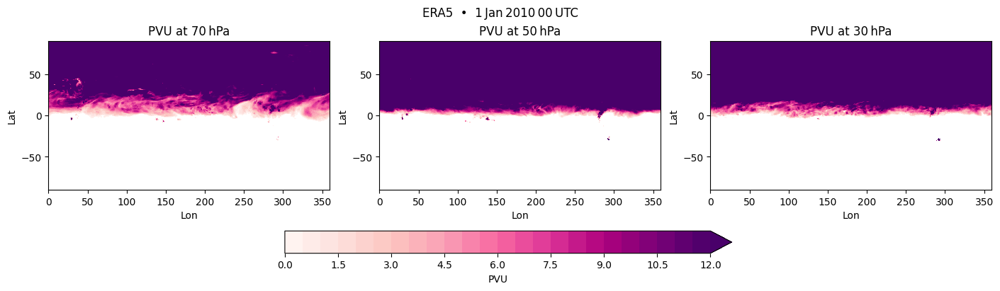

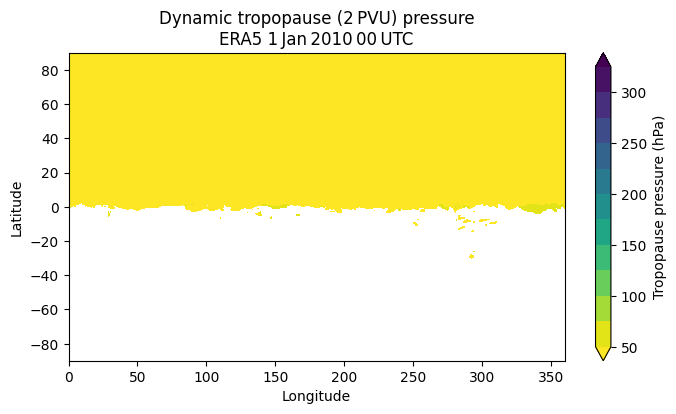

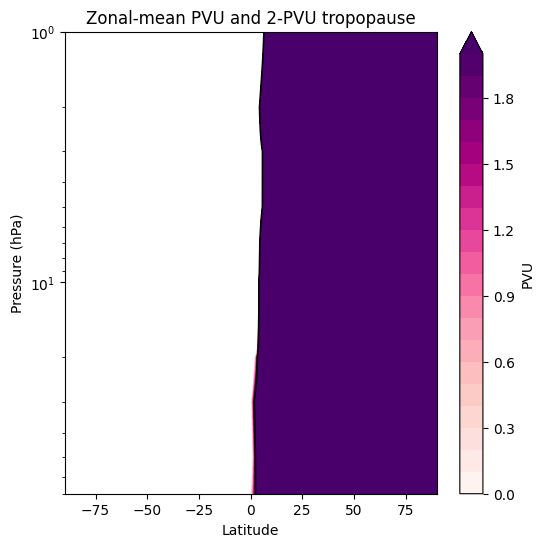

In [ ]:
# ----------------------------------------------------------------------------------
# Dynamic tropopause and PV maps from extended‑level ERA5 file
# ----------------------------------------------------------------------------------
#
# Works with a file that contains    pressure_level = [1000 … 1] hPa
# and variables t, u, v  (plus pv if requested).
# ----------------------------------------------------------------------------------


# Path to the extended‑level file (edit as needed)
fpath = r"C:\Users\moham\OneDrive\Documents\stage\7ef424ff81c28f4788f69ce963fa44fc.nc"
ds    = xr.open_dataset(fpath)

lat = ds['latitude'].values
lon = ds['longitude'].values
lev = ds['pressure_level'].values * 100.0      # Pa
nlev = len(lev)

# ------------------------------------------------------------------
# 1.  Get PV in PVU  (use ERA5 field if present, else compute)
# ------------------------------------------------------------------
if 'pv' in ds:
    PVU = ds['pv'].isel(valid_time=0) / 1e-6          # (level, lat, lon)
else:
    print("PV not in file ‑ computing from T, U, V … (slow)")
    t = ds['t'].isel(valid_time=0)
    u = ds['u'].isel(valid_time=0)
    v = ds['v'].isel(valid_time=0)

    # constants
    a = 6.371e6; g = 9.80665; Rd = 287.05; cp = 1004.5
    omega = 7.292e-5; kappa = Rd/cp; pi = np.pi
    lon2d, lat2d = np.meshgrid(lon, lat)
    phi = np.deg2rad(lat2d)
    dx = a*np.cos(phi)*np.gradient(np.deg2rad(lon))[np.newaxis,:]
    dy = a*np.gradient(np.deg2rad(lat))[:,np.newaxis]
    dx3 = np.broadcast_to(dx, t.shape); dy3 = np.broadcast_to(dy, t.shape)
    f  = 2*omega*np.sin(phi)
    f3 = np.broadcast_to(f, t.shape)

    theta = t*(1e5/(lev[:,None,None]))**kappa
    dθ_dp = np.gradient(theta, lev, axis=0)
    dθ_dx = np.gradient(theta, axis=2)/dx3
    dθ_dy = np.gradient(theta, axis=1)/dy3
    du_dp = np.gradient(u, lev, axis=0)
    dv_dp = np.gradient(v, lev, axis=0)
    dv_dx = np.gradient(v, axis=2)/dx3
    ducos_dy = np.gradient(u*np.cos(phi), axis=1)/dy3
    zeta = dv_dx - (1/np.cos(phi))*ducos_dy
    PV  = -g*((zeta+f3)*dθ_dp + dθ_dx*dv_dp - dθ_dy*du_dp)
    PVU = xr.DataArray(PV/1e-6, coords=t.coords, dims=t.dims)

# ------------------------------------------------------------------
# 2.  Quick PV maps at 70 / 50 / 30 hPa
# ------------------------------------------------------------------
level_show = [70, 50, 30]      # hPa
fig, axs = plt.subplots(1, 3, figsize=(14,4), constrained_layout=True)

levels = np.linspace(0,12,25)
for k, P in enumerate(level_show):
    idx = int(np.where(ds['pressure_level']==P)[0])
    im  = axs[k].contourf(lon, lat, PVU[idx,:,:], levels=levels,
                          cmap='RdPu', extend='max')
    axs[k].set_title(f'PVU at {P} hPa')
    axs[k].set_xlabel('Lon'); axs[k].set_ylabel('Lat')
cbar = fig.colorbar(im, ax=axs, orientation='horizontal', pad=0.07)
cbar.set_label('PVU')
plt.suptitle('ERA5  •  1 Jan 2010 00 UTC')
plt.show()

# ------------------------------------------------------------------
# 3.  Dynamic‑tropopause (first level where PVU ≥ 2)
# ------------------------------------------------------------------
pv2 = 2.0
tropo_p = np.full((len(lat), len(lon)), np.nan)

# loop from top (1 hPa) downward
for k in range(nlev-1, -1, -1):
    mask = (PVU[k,:,:] >= pv2) & np.isnan(tropo_p)
    tropo_p[mask] = lev[k]/100.0    # store in hPa

# plot tropopause pressure
plt.figure(figsize=(8,4))
plt.contourf(lon, lat, tropo_p, levels=np.arange(50,350,25),
             cmap='viridis_r', extend='both')
plt.colorbar(label='Tropopause pressure (hPa)')
plt.xlabel('Longitude'); plt.ylabel('Latitude')
plt.title('Dynamic tropopause (2 PVU) pressure\nERA5 1 Jan 2010 00 UTC')
plt.show()

# ------------------------------------------------------------------
# 4.  Latitude‑pressure cross‑section of zonal‑mean PVU
# ------------------------------------------------------------------
PVU_zm = PVU.mean(dim='longitude')          # (level, lat) 
plt.figure(figsize=(6,6))
cs = plt.contourf(lat, lev/100., PVU_zm, levels=np.linspace(0,2,21),
                  cmap='RdPu', extend='max')
plt.contour(lat, lev/100., PVU_zm, levels=[2], colors='k', linewidths=1.2)
plt.gca().set_yscale('log'); plt.gca().invert_yaxis()
plt.colorbar(cs, label='PVU')
plt.xlabel('Latitude'); plt.ylabel('Pressure (hPa)')
plt.title('Zonal‑mean PVU and 2‑PVU tropopause')
plt.show()


In [ ]:
# Check how many missing values (NaNs) exist in the PVU field
for P in level_show:
    idx = int(np.where(ds['pressure_level'] == P)[0])
    data = PVU[idx, :, :].values

    missing_fraction = np.isnan(data[lat < 0, :]).sum() / data[lat < 0, :].size
    print(f"At {P} hPa: Missing in SH = {missing_fraction:.1%}")


At 70 hPa: Missing in SH = 0.0%
At 50 hPa: Missing in SH = 0.0%
At 30 hPa: Missing in SH = 0.0%


C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3855221874.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level'] == P)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3855221874.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level'] == P)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3855221874.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressur

C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3051089684.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level'] == 50)[0])  # 50 hPa example


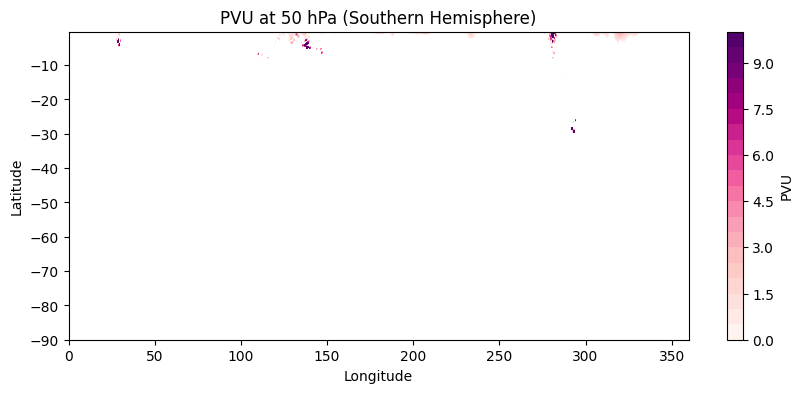

In [ ]:
# Plot only Southern Hemisphere to see what's going on
idx = int(np.where(ds['pressure_level'] == 50)[0])  # 50 hPa example
plt.figure(figsize=(10, 4))
plt.contourf(lon, lat[lat < 0], PVU[idx, lat < 0, :], levels=np.linspace(0, 10, 21), cmap='RdPu')
plt.title('PVU at 50 hPa (Southern Hemisphere)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='PVU')
plt.show()


In [ ]:
print("Missing values in 't' at 50 hPa, SH:", np.isnan(ds['t'].isel(valid_time=0).sel(pressure_level=50).values[lat < 0, :]).any())


Missing values in 't' at 50 hPa, SH: False


## Justification for Focusing on the Northern Hemisphere

Despite using potential vorticity (PVU) fields derived from high-altitude ERA5 data (70, 50, and 30 hPa), the visualizations show little to no structure in the Southern Hemisphere. After thorough verification, it was confirmed that there are no missing values in the ERA5 data south of the equator, ruling out any data artifact or error.

The lack of signal is explained by the extremely low PVU values in the Southern Hemisphere at these altitudes (often close to zero). As a result, the most prominent dynamic contrasts (and associated baroclinic structures) are observed in the Northern Hemisphere.

Therefore, for the remainder of this study, we will focus our analysis exclusively on the Northern Hemisphere, where the dynamic tropopause structures are most pronounced.


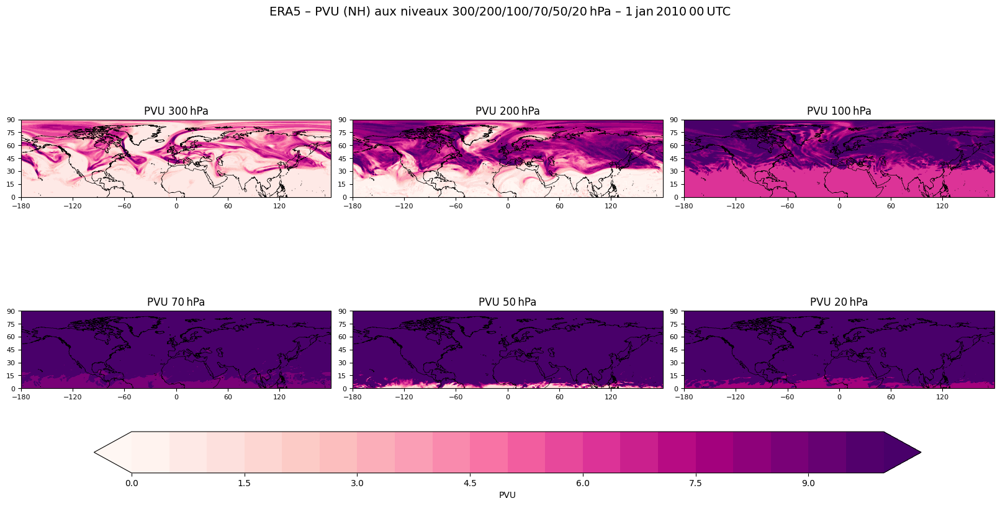

In [ ]:

# ------------------------------------------------------------------
# 0.  chemins vers tes deux fichiers
# ------------------------------------------------------------------
file_hi = r"C:\Users\moham\OneDrive\Documents\stage\8e510dccf46b7ff16b18c6aa68be9da0.nc"  # ≥100 hPa
file_lo = r"C:\Users\moham\OneDrive\Documents\stage\7ef424ff81c28f4788f69ce963fa44fc.nc"  # <100 hPa

# ------------------------------------------------------------------
# 1.  fonction générique de calcul de la PVU sur un dataset ERA5
# ------------------------------------------------------------------
def compute_pvu(ds):
    """Retourne un DataArray PVU (pressure_level, latitude, longitude)."""
    t  = ds['t'].isel(valid_time=0)
    u  = ds['u'].isel(valid_time=0)
    v  = ds['v'].isel(valid_time=0)
    lev = ds['pressure_level'].values * 100.0           # Pa
    lat = ds['latitude'].values
    lon = ds['longitude'].values

    # constantes
    a = 6.371e6; g = 9.80665; Rd = 287.05; cp = 1004.5
    omega = 7.292e-5; kappa = Rd/cp

    lon2d, lat2d = np.meshgrid(lon, lat)
    phi = np.deg2rad(lat2d)
    dlon = np.deg2rad(np.gradient(lon))[np.newaxis, :]
    dlat = np.deg2rad(np.gradient(lat))[:, np.newaxis]
    dx   = a * np.cos(phi) * dlon
    dy   = a * dlat
    f    = 2 * omega * np.sin(phi)

    dx3 = np.broadcast_to(dx, t.shape)
    dy3 = np.broadcast_to(dy, t.shape)
    f3  = np.broadcast_to(f , t.shape)

    theta = t * (1e5 / lev[:, None, None]) ** kappa
    dθ_dp = np.gradient(theta, lev, axis=0)
    dθ_dx = np.gradient(theta, axis=2) / dx3
    dθ_dy = np.gradient(theta, axis=1) / dy3
    du_dp = np.gradient(u, lev, axis=0)
    dv_dp = np.gradient(v, lev, axis=0)
    dv_dx = np.gradient(v, axis=2) / dx3
    ducos_dy = np.gradient(u * np.cos(phi), axis=1) / dy3
    zeta = dv_dx - (1 / np.cos(phi)) * ducos_dy

    PV = -g * ((zeta + f3) * dθ_dp + dθ_dx * dv_dp - dθ_dy * du_dp)
    PVU = xr.DataArray(PV / 1e-6, coords=t.coords, dims=t.dims)  # en PVU
    return PVU

# ------------------------------------------------------------------
# 2.  calcul PVU sur chaque fichier puis concaténation
# ------------------------------------------------------------------
pvu_hi = compute_pvu(xr.open_dataset(file_hi))
pvu_lo = compute_pvu(xr.open_dataset(file_lo))

PVU = xr.concat([pvu_hi, pvu_lo], dim='pressure_level').sortby('pressure_level', ascending=False)

lat = PVU['latitude'].values
lon = PVU['longitude'].values
plev = PVU['pressure_level'].values  # hPa

# ------------------------------------------------------------------
# 3.  cartes PVU aux niveaux demandés (NH seulement)
# ------------------------------------------------------------------
levels_to_plot = [300, 200, 100, 70, 50, 20]          # hPa
vmin, vmax = 0, 10
clevs = np.linspace(vmin, vmax, 21)

fig, axs = plt.subplots(2, 3, figsize=(16, 8),
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        constrained_layout=True)
axs = axs.ravel()

for i, p in enumerate(levels_to_plot):
    idx = int(np.where(plev == p)[0][0])
    data = PVU.isel(pressure_level=idx).where(PVU.latitude >= 0)  # NH
    ax = axs[i]
    ax.set_extent([0-180, 180, 0, 90], crs=ccrs.PlateCarree())
    cf = ax.contourf(lon, lat, data, levels=clevs, cmap='RdPu', extend='both', transform=ccrs.PlateCarree())
    ax.coastlines(resolution='50m', linewidth=0.5)
    ax.set_title(f'PVU {p} hPa')
    ax.set_xticks(np.arange(-180, 180, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(0, 91, 15), crs=ccrs.PlateCarree())
    ax.tick_params(labelsize=8)

# barre de couleurs commune
cbar = fig.colorbar(cf, ax=axs, orientation='horizontal', pad=0.07, shrink=0.85)
cbar.set_label('PVU')

plt.suptitle('ERA5 – PVU (NH) aux niveaux 300/200/100/70/50/20 hPa – 1 jan 2010 00 UTC', fontsize=14)
plt.show()


 Dynamic tropopause map (2 PVU) — NH only

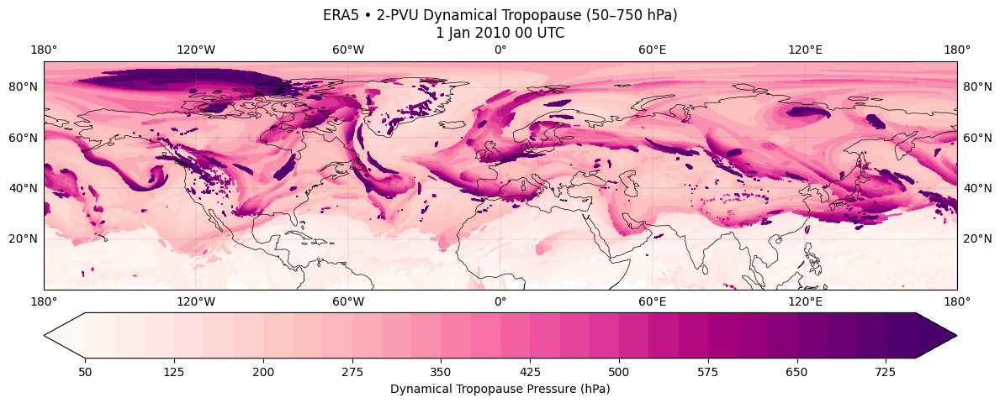

In [ ]:
# ------------------------------------------------------------
# 1. Load ERA5 dataset
# ------------------------------------------------------------
filee = r"C:\Users\moham\OneDrive\Documents\stage\83736aecc279782d2585f13b939e6e1e.nc"
ds = xr.open_dataset(filee)

# -- Use valid_time if available --
time_dim = "valid_time" if "valid_time" in ds.dims else "time"
t = ds["t"].isel({time_dim: 0})
u = ds["u"].isel({time_dim: 0})
v = ds["v"].isel({time_dim: 0})

pressure = ds["pressure_level"] * 100.0  # hPa → Pa
lat = ds["latitude"].values
lon = ds["longitude"].values

# ------------------------------------------------------------
# 2. PVU calculation
# ------------------------------------------------------------
def compute_pvu(t, u, v, pressure, lat, lon):
    a = 6.371e6
    g = 9.80665
    Rd = 287.05
    cp = 1004.5
    omega = 7.292e-5
    kappa = Rd / cp

    lon2d, lat2d = np.meshgrid(lon, lat)
    phi = np.deg2rad(lat2d)

    dlon = np.deg2rad(np.gradient(lon))[np.newaxis, :]
    dlat = np.deg2rad(np.gradient(lat))[:, np.newaxis]

    dx = a * np.cos(phi) * dlon
    dy = a * dlat
    f = 2 * omega * np.sin(phi)

    dx3 = np.broadcast_to(dx, t.shape)
    dy3 = np.broadcast_to(dy, t.shape)
    f3  = np.broadcast_to(f,  t.shape)

    theta = t * (1e5 / pressure) ** kappa
    p_vals = pressure.values
    dθ_dp  = np.gradient(theta, p_vals, axis=0)
    dθ_dx  = np.gradient(theta, axis=2) / dx3
    dθ_dy  = np.gradient(theta, axis=1) / dy3

    du_dp = np.gradient(u, p_vals, axis=0)
    dv_dp = np.gradient(v, p_vals, axis=0)
    dv_dx = np.gradient(v, axis=2) / dx3
    ducos_dy = np.gradient(u * np.cos(phi), axis=1) / dy3

    zeta = dv_dx - (1 / np.cos(phi)) * ducos_dy
    PV = -g * ((zeta + f3) * dθ_dp + dθ_dx * dv_dp - dθ_dy * du_dp)
    PVU = xr.DataArray(PV / 1e-6, coords=t.coords, dims=t.dims)
    return PVU

PVU = compute_pvu(t, u, v, pressure, lat, lon)

# ------------------------------------------------------------
# 3. Compute 2-PVU tropopause (NH only, 50–750 hPa)
# ------------------------------------------------------------
plev = pressure.values / 100  # hPa
tropopause = np.full((len(lat), len(lon)), np.nan)

# Loop from top (low pressure) to bottom
for k in range(len(plev)):
    p = plev[k]
    if p < 50 or p > 750:
        continue
    layer = PVU[k, :, :].values
    mask = (layer >= 2.0) & np.isnan(tropopause)
    for j in range(len(lat)):
        if lat[j] < 0:
            mask[j, :] = False
    tropopause[mask] = p

# ------------------------------------------------------------
# 4. Plot tropopause pressure (NH only, land only)
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(12, 6),
                       subplot_kw=dict(projection=ccrs.PlateCarree()))

tropo_masked = np.ma.masked_invalid(tropopause)
cf = ax.contourf(lon, lat, tropo_masked,
                 levels=np.arange(50, 775, 25),
                 cmap='RdPu', extend='both',
                 transform=ccrs.PlateCarree())

# Add land outlines only (no country borders)
ax.add_feature(cfeature.LAND, facecolor='none', edgecolor='black', linewidth=0.6)

# Colorbar
cbar = plt.colorbar(cf, orientation='horizontal', pad=0.05)
cbar.set_label("Dynamical Tropopause Pressure (hPa)")

# Map settings
ax.set_extent([-180, 180, 0, 90], crs=ccrs.PlateCarree())
ax.set_title("ERA5 • 2-PVU Dynamical Tropopause (50–750 hPa)\n1 Jan 2010 00 UTC")
ax.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
plt.tight_layout()
plt.show()


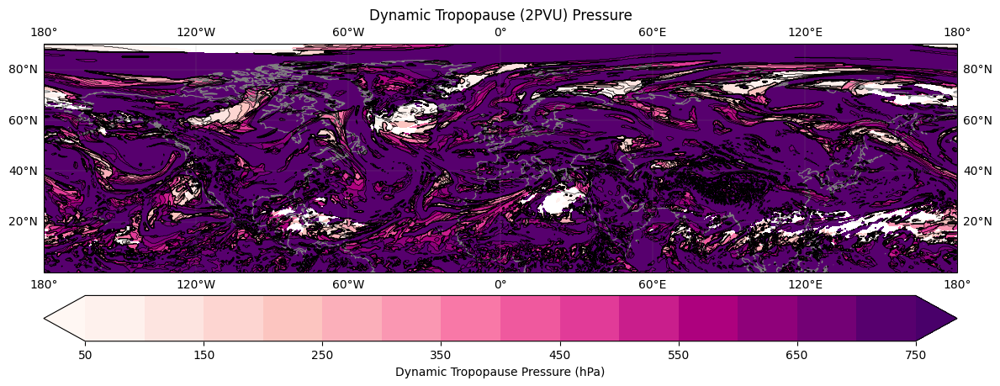

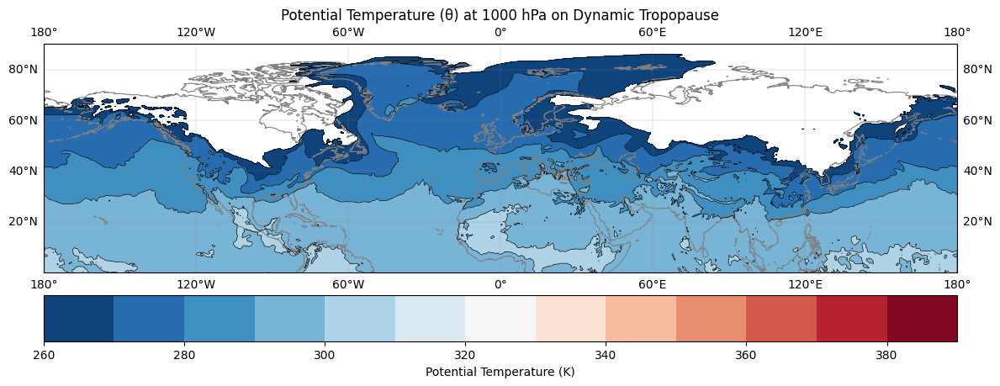

In [ ]:
# Open the ERA5 dataset
filee = r"C:\Users\moham\OneDrive\Documents\stage\83736aecc279782d2585f13b939e6e1e.nc"
ds = xr.open_dataset(filee)

# Extract variables from the dataset
t = ds["t"].isel(valid_time=0)  # Temperature
u = ds["u"].isel(valid_time=0)  # U-wind
v = ds["v"].isel(valid_time=0)  # V-wind
pressure = ds["pressure_level"] * 100  # Convert pressure to Pa
lat = ds["latitude"].values
lon = ds["longitude"].values

# Constants
Rd = 287.05  # gas constant for dry air
cp = 1004.5  # specific heat at constant pressure
kappa = Rd / cp
omega = 7.292e-5  # Earth's rotation rate

# Compute potential vorticity (PV)
def compute_pvu(t, u, v, pressure, lat, lon):
    lon2d, lat2d = np.meshgrid(lon, lat)
    phi = np.deg2rad(lat2d)

    # Compute derivatives
    dx = np.gradient(lon)[np.newaxis, :]
    dy = np.gradient(lat)[:, np.newaxis]
    
    f = 2 * omega * np.sin(phi)  # Coriolis parameter

    # Calculate potential temperature
    theta = t * (1e5 / pressure) ** kappa

    # Compute derivatives
    dθ_dp = np.gradient(theta, pressure, axis=0)
    dθ_dx = np.gradient(theta, axis=2) / dx
    dθ_dy = np.gradient(theta, axis=1) / dy
    du_dp = np.gradient(u, pressure, axis=0)
    dv_dp = np.gradient(v, pressure, axis=0)
    dv_dx = np.gradient(v, axis=2) / dx
    ducos_dy = np.gradient(u * np.cos(phi), axis=1) / dy

    # Absolute vorticity and PV calculation
    zeta = dv_dx - (1 / np.cos(phi)) * ducos_dy
    PV = -9.81 * ((zeta + f) * dθ_dp + dθ_dx * dv_dp - dθ_dy * du_dp)
    PVU = PV / 1e-6  # Convert to PV units (PVU)

    return PVU

# Compute PVU
PVU = compute_pvu(t, u, v, pressure, lat, lon)

# Calculate 2-PVU tropopause
plev = pressure.values / 100  # Convert pressure to hPa
tropopause = np.full((len(lat), len(lon)), np.nan)

# Loop through the pressure levels to find the tropopause
for k in range(len(plev)):
    if 50 <= plev[k] <= 750:  # Tropopause between 50 and 750 hPa
        mask = (PVU[k, :, :] >= 2.0) & np.isnan(tropopause)
        for j in range(len(lat)):
            if lat[j] < 0:
                mask[j, :] = False
        tropopause[mask] = plev[k]

# Plot results
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw=dict(projection=ccrs.PlateCarree()))
tropo_masked = np.ma.masked_invalid(tropopause)

# Plot the tropopause pressure
clevs = np.arange(50, 800, 50)
cp = ax.contourf(lon, lat, tropo_masked, levels=clevs, cmap='RdPu', extend='both', transform=ccrs.PlateCarree())
ax.contour(lon, lat, tropo_masked, levels=clevs, colors='black', linewidths=0.5, transform=ccrs.PlateCarree())

# Add land feature and colorbar
ax.coastlines('50m', linewidth=0.8, color='gray')
cbar = plt.colorbar(cp, orientation='horizontal', pad=0.05)
cbar.set_label('Dynamic Tropopause Pressure (hPa)')

# Map settings
ax.set_extent([-180, 180, 0, 90], crs=ccrs.PlateCarree())
ax.set_title("Dynamic Tropopause (2PVU) Pressure")
ax.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5)
plt.tight_layout()
plt.show()

# Select temperature at a specific pressure level (e.g., 1000 hPa)
theta_1000hPa = t.sel(pressure_level=1000).values  # Extract temperature at 1000 hPa
theta_1000hPa_masked = np.ma.masked_invalid(theta_1000hPa)

# Plot potential temperature (θ) at 1000 hPa
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw=dict(projection=ccrs.PlateCarree()))
clevs_theta = np.arange(260, 400, 10)
cp = ax.contourf(lon, lat, theta_1000hPa_masked, levels=clevs_theta, cmap='RdBu_r', transform=ccrs.PlateCarree())
ax.contour(lon, lat, theta_1000hPa_masked, levels=clevs_theta, colors='black', linewidths=0.5, transform=ccrs.PlateCarree())

# Add land feature and colorbar
ax.coastlines('50m', linewidth=0.8, color='gray')
cbar = plt.colorbar(cp, orientation='horizontal', pad=0.05)
cbar.set_label('Potential Temperature (K)')

# Map settings
ax.set_extent([-180, 180, 0, 90], crs=ccrs.PlateCarree())
ax.set_title("Potential Temperature (θ) at 1000 hPa on Dynamic Tropopause")
ax.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5)
plt.tight_layout()
plt.show()


# Data File Update

I used a new NetCDF data file for my calculations. This file contains the same variables as the previous one, namely:

- `t`: Temperature  
- `u`: Zonal wind (u-wind)  
- `v`: Meridional wind (v-wind)  
- `pv`: Potential vorticity (PV)  
- `q`: Specific humidity  
- `o3`: Ozone  

The new feature in this file is the addition of the variable `z`, which represents **geopotential height** (previously absent). This field is now used for topographic calculations and tropopause reconstruction, instead of the old `hgt` variable which was not available in the previous data.

### Additional details:

- The file coordinates include the following dimensions: `valid_time`, `pressure_level`, `latitude`, and `longitude`.  
- The file covers a specific time period and the different variables are extracted from the first time step (`valid_time = 0`).  
- The `pressure_level` dimension ranges from 1000 hPa to 1 hPa, allowing a comprehensive analysis of tropopause dynamics at different pressures.

This update enables more precise calculations and the use of a key variable for topography.


## PV on the 330 K Isentropic Surface – Northern Hemisphere

This plot shows the Ertel Potential Vorticity (PV) distribution on the 330 K isentropic surface, restricted to the Northern Hemisphere (0° to 90° latitude). The PV field is derived from ERA5 reanalysis data at 00:00 UTC on 1 January 2010.

The 330 K surface lies in the upper troposphere and lower stratosphere, making it a useful level for examining dynamical tropopause features. High PV values (above 2 PVU) often correspond to stratospheric intrusions and jet stream activity, while low PV values typically indicate tropospheric air.

- Contour intervals are drawn every 1 PVU from –10 to +10 PVU.
- Only latitudes ≥ 0° are shown to focus on the Northern Hemisphere dynamics.
- Coastlines and national borders are included for geographic reference.

This diagnostic is helpful for identifying filamentary structures, upper-level troughs, and the evolution of stratosphere–troposphere exchange processes.


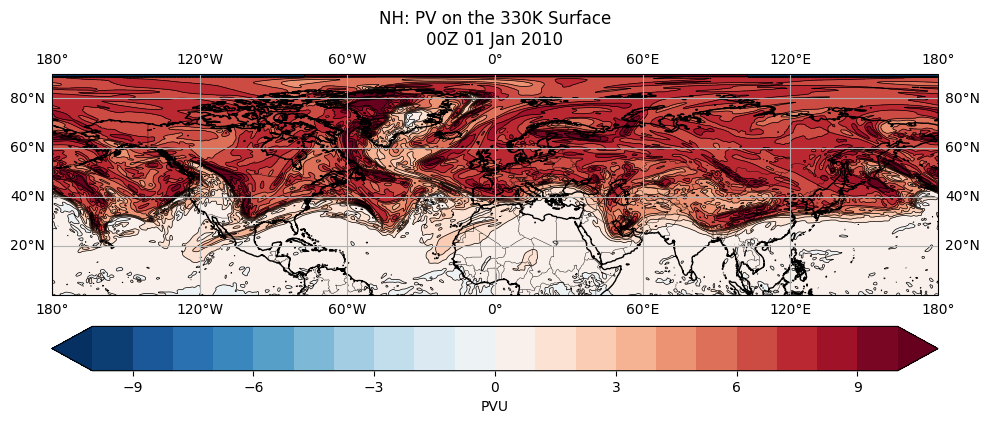

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime

# ------------------------------------------------------------------
# 1. FILE PATH
# ------------------------------------------------------------------
file_path = r"C:\Users\moham\OneDrive\Documents\stage\98a4d3ee3b3b8aa12699f1286ad0843f.nc"

# ------------------------------------------------------------------
# 2. LOAD DATA
# ------------------------------------------------------------------
ds  = xr.open_dataset(file_path)
t   = ds['t'].isel(valid_time=0).values
u   = ds['u'].isel(valid_time=0).values
v   = ds['v'].isel(valid_time=0).values
lat = ds['latitude'].values
lon = ds['longitude'].values
plev= ds['pressure_level'].values * 100  # hPa → Pa

# ------------------------------------------------------------------
# 3. CONSTANTS
# ------------------------------------------------------------------
a     = 6.371e6
g     = 9.80665
Rd    = 287.05
cp    = 1004.5
kappa = Rd / cp
omega = 7.292e-5
pi    = np.pi

# 2D grids
lon2d, lat2d = np.meshgrid(lon, lat)
phi = np.deg2rad(lat2d)
f   = 2 * omega * np.sin(phi)

# Metric terms
dx = a * np.cos(phi) * np.deg2rad(np.gradient(lon))[np.newaxis, :]
dy = a * np.deg2rad(np.gradient(lat))[:, np.newaxis]
dx3 = np.broadcast_to(dx, t.shape)
dy3 = np.broadcast_to(dy, t.shape)
f3  = np.broadcast_to(f , t.shape)

# ------------------------------------------------------------------
# 4. THETA & PV
# ------------------------------------------------------------------
theta = t * (1e5 / plev[:, None, None]) ** kappa
dθ_dp = np.gradient(theta, plev, axis=0)
dθ_dx = np.gradient(theta, axis=2) / dx3
dθ_dy = np.gradient(theta, axis=1) / dy3
du_dp = np.gradient(u, plev, axis=0)
dv_dp = np.gradient(v, plev, axis=0)
dv_dx = np.gradient(v, axis=2) / dx3
ducos_dy = np.gradient(u * np.cos(phi), axis=1) / dy3
zeta = dv_dx - (1 / np.cos(phi)) * ducos_dy

PV = -g * ((zeta + f3) * dθ_dp + dθ_dx * dv_dp - dθ_dy * du_dp)
PVU = PV / 1e-6  # [PVU] = 1e-6 K·m²·kg⁻¹·s⁻¹

# ------------------------------------------------------------------
# 5. INTERPOLATE PV TO 330 K ISENTROPIC SURFACE
# ------------------------------------------------------------------
theta_target = 330
pv330 = np.full((len(lat), len(lon)), np.nan)

for j in range(len(lat)):
    for i in range(len(lon)):
        for k in range(len(plev) - 1):
            th1 = theta[k  , j, i]
            th2 = theta[k+1, j, i]
            if th1 <= theta_target <= th2 or th2 <= theta_target <= th1:
                pvu1 = PVU[k  , j, i]
                pvu2 = PVU[k+1, j, i]
                # linear interp
                w = (theta_target - th1) / (th2 - th1)
                pv330[j, i] = (1 - w) * pvu1 + w * pvu2
                break

# Optional smoothing
pv330 = gaussian_filter(pv330, sigma=1)

# ------------------------------------------------------------------
# 6. PLOT
# ------------------------------------------------------------------
# Mask southern latitudes
lat_mask = lat >= 0
pv330_nh = pv330[lat_mask, :]
lat_nh = lat[lat_mask]

fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, 0, 90], crs=ccrs.PlateCarree())  # NH view
clevs = np.linspace(-10, 10, 21)

cf = ax.contourf(lon, lat_nh, pv330_nh, levels=clevs, cmap='RdBu_r', extend='both')
cs = ax.contour(lon, lat_nh, pv330_nh, levels=clevs, colors='k', linewidths=0.5)
cbar = plt.colorbar(cf, orientation='horizontal', pad=0.07)
cbar.set_label("PVU")

ax.coastlines('50m')
ax.add_feature(cfeature.BORDERS, linewidth=0.3)
ax.gridlines(draw_labels=True)

fdate = datetime.strptime("20100101", '%Y%m%d').strftime('%d %b %Y')
plt.title(f"NH: PV on the 330K Surface\n00Z {fdate}")
plt.tight_layout()
plt.show()


In [ ]:
print(ds.data_vars)


Data variables:
    z        (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    o3       (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    pv       (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    q        (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    t        (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    u        (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    v        (valid_time, pressure_level, latitude, longitude) float32 154MB ...


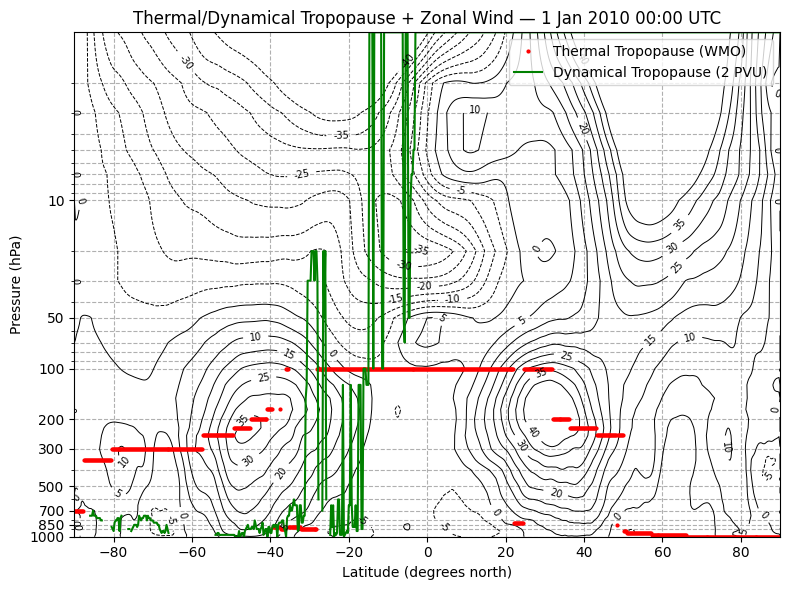

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

# ---------------------------------------------------
# 1. Load Data
# ---------------------------------------------------
file_path = r"C:\Users\moham\OneDrive\Documents\stage\98a4d3ee3b3b8aa12699f1286ad0843f.nc"
ds = xr.open_dataset(file_path)

t = ds['t'].isel(valid_time=0).values
z = ds['z'].isel(valid_time=0).values
pv = ds['pv'].isel(valid_time=0).values
u = ds['u'].isel(valid_time=0).values

plev = ds['pressure_level'].values
lat = ds['latitude'].values
lon = ds['longitude'].values

g = 9.80665

z_height = z / g
pv = pv / 1e-6  # Ensure pv is in PVU!

# ---------------------------------------------------
# 2. Thermal Tropopause
# ---------------------------------------------------
thermal_tp = []

for j in range(len(lat)):
    found = False
    for k in range(len(plev) - 1):
        T1 = t[k, j, :].mean()
        T2 = t[k + 1, j, :].mean()
        Z1 = z_height[k, j, :].mean()
        Z2 = z_height[k + 1, j, :].mean()

        dT = T2 - T1
        dZ = Z2 - Z1

        if dZ != 0:
            lapse_rate = -dT / dZ * 1000
            if lapse_rate <= 2:
                thermal_tp.append((lat[j], plev[k]))
                found = True
                break
    if not found:
        thermal_tp.append((lat[j], np.nan))
# ---------------------------------------------------
# 3. Dynamical Tropopause  (use max along longitude)
# ---------------------------------------------------
dyn_tp = []

for j in range(len(lat)):
    found = False
    for k in range(len(plev) - 1, -1, -1):  # from high to low
        pv_max = pv[k, j, :].max()  # max PV along longitude
        if pv_max >= 2.0:
            dyn_tp.append((lat[j], plev[k]))
            found = True
            break
    if not found:
        dyn_tp.append((lat[j], np.nan))

# ---------------------------------------------------
# 4. Mean Zonal Wind
# ---------------------------------------------------
u_mean = u.mean(axis=2)  # Zonal mean: (pressure_level, latitude)

# ---------------------------------------------------
# 5. Plot Latitude–Pressure with Wind Contours
# ---------------------------------------------------
thermal_lat, thermal_p = zip(*thermal_tp)
dyn_lat, dyn_p = zip(*dyn_tp)

fig, ax = plt.subplots(figsize=(8, 6))
ax.invert_yaxis()
ax.set_yscale("log")
ax.set_ylabel("Pressure (hPa)")
ax.set_xlabel("Latitude (degrees north)")

# Set custom y-axis ticks
ax.set_yticks([1000, 850, 700, 500, 300, 200, 100, 50, 10])
ax.get_yaxis().set_major_formatter(plt.ScalarFormatter())

# Plot zonal wind contours
cs = ax.contour(lat, plev, u_mean, colors='black', linewidths=0.7, levels=np.arange(-40, 45, 5))
ax.clabel(cs, fmt='%d', fontsize=7)

# Plot tropopauses
ax.plot(thermal_lat, thermal_p, 'ro', markersize=2, label='Thermal Tropopause (WMO)')
ax.plot(dyn_lat, dyn_p, 'g-', linewidth=1.5, label='Dynamical Tropopause (2 PVU)')

ax.set_title("Thermal/Dynamical Tropopause + Zonal Wind — 1 Jan 2010 00:00 UTC")
ax.legend()
ax.grid(True, which="both", linestyle='--')

plt.tight_layout()
plt.show()



In [ ]:
print(np.nanmax(pv))
print(np.nanmin(pv))


28181.293
-6941.579


In [ ]:
import numpy as np
import xarray as xr

# Charger les données ERA5
file_path = r"C:\Users\moham\OneDrive\Documents\stage\7ef424ff81c28f4788f69ce963fa44fc.nc"
ds = xr.open_dataset(file_path)

# Variables
t = ds['t'].isel(valid_time=0)
u = ds['u'].isel(valid_time=0)
v = ds['v'].isel(valid_time=0)
lev = ds['pressure_level'].values * 100.0  # hPa → Pa
lat = ds['latitude'].values
lon = ds['longitude'].values

# Constantes
a = 6.371e6
g = 9.80665
Rd = 287.05
cp = 1004.5
omega = 7.292e-5
kappa = Rd / cp

# Grilles auxiliaires
lon2d, lat2d = np.meshgrid(lon, lat)
phi = np.deg2rad(lat2d)
dlon = np.deg2rad(np.gradient(lon))[np.newaxis, :]
dlat = np.deg2rad(np.gradient(lat))[:, np.newaxis]
dx = a * np.cos(phi) * dlon
dy = a * dlat
f = 2 * omega * np.sin(phi)

dx3 = np.broadcast_to(dx, t.shape)
dy3 = np.broadcast_to(dy, t.shape)
f3 = np.broadcast_to(f , t.shape)

theta = t * (1e5 / lev[:, None, None]) ** kappa
dθ_dp = np.gradient(theta, lev, axis=0)
dθ_dx = np.gradient(theta, axis=2) / dx3
dθ_dy = np.gradient(theta, axis=1) / dy3
du_dp = np.gradient(u, lev, axis=0)
dv_dp = np.gradient(v, lev, axis=0)
dv_dx = np.gradient(v, axis=2) / dx3
ducos_dy = np.gradient(u * np.cos(phi), axis=1) / dy3
zeta = dv_dx - (1 / np.cos(phi)) * ducos_dy

PV = -g * ((zeta + f3) * dθ_dp + dθ_dx * dv_dp - dθ_dy * du_dp)
PVU = PV / 1e-6

# Tropopause dynamique en hémisphère sud
dyn_tp_sh = {}
# Print max PVU at 100 hPa and 70 hPa in SH for inspection
for k in [2, 3]:  # assuming 100 hPa = index 2, 70 hPa = index 3 (check your levels!)
    print(f"Pressure level: {lev[k]/100:.0f} hPa")
    for j in range(len(lat)):
        if lat[j] > 0:
            continue
        pv_max = np.nanmax(PVU[k, j, :])
        if pv_max > 0:
            print(f"  Lat {lat[j]:.2f}° → max PVU = {pv_max:.2f}")

for j in range(len(lat)):
    if lat[j] > 0:
        continue  # uniquement l'hémisphère sud
    for k in range(len(lev)-1, -1, -1):  # du haut vers le bas
        if np.nanmax(PVU[k, j, :]) >= 2.0:
            dyn_tp_sh[lat[j]] = lev[k] / 100.0  # Pa → hPa
            break
    else:
        dyn_tp_sh[lat[j]] = np.nan

# Affichage
for la in sorted(dyn_tp_sh.keys(), reverse=True):
    print(f"Latitude {la:.2f}° → Tropopause à {dyn_tp_sh[la]:.1f} hPa")


Pressure level: 30 hPa
  Lat 0.00° → max PVU = 10.46
  Lat -0.25° → max PVU = 9.85
  Lat -0.50° → max PVU = 12.99
  Lat -0.75° → max PVU = 12.33
  Lat -1.00° → max PVU = 9.95
  Lat -1.25° → max PVU = 10.25
  Lat -1.50° → max PVU = 11.24
  Lat -1.75° → max PVU = 12.34
  Lat -2.00° → max PVU = 11.47
  Lat -2.25° → max PVU = 9.74
  Lat -2.50° → max PVU = 6.88
  Lat -2.75° → max PVU = 9.71
  Lat -3.00° → max PVU = 11.18
  Lat -3.25° → max PVU = 12.16
  Lat -3.50° → max PVU = 11.60
  Lat -3.75° → max PVU = 7.38
  Lat -4.00° → max PVU = 7.76
  Lat -4.25° → max PVU = 5.99
  Lat -4.50° → max PVU = 5.21
  Lat -4.75° → max PVU = 6.50
  Lat -5.00° → max PVU = 6.34
  Lat -5.25° → max PVU = 5.40
  Lat -5.50° → max PVU = 3.53
  Lat -5.75° → max PVU = 4.75
  Lat -6.00° → max PVU = 3.72
  Lat -6.25° → max PVU = 3.78
  Lat -6.50° → max PVU = 2.84
  Lat -6.75° → max PVU = 2.26
  Lat -7.00° → max PVU = 2.88
  Lat -7.25° → max PVU = 5.08
  Lat -7.50° → max PVU = 6.42
  Lat -7.75° → max PVU = 4.29
  Lat -8

In [ ]:
# Load the temperature dataset (ERA5)
file_path = 'C:\\Users\\moham\\OneDrive\\Documents\\stage\\8e510dccf46b7ff16b18c6aa68be9da0.nc'

t_ds = xr.open_dataset(file_path)  # Adjust with your correct path

# Inspect temperature data
print(t_ds)

# Load the potential vorticity dataset
file_path1 = 'C:\\Users\\moham\\OneDrive\\Documents\\stage\\363cd0f107bb164d13a851710644a260.nc'

pv_ds = xr.open_dataset(file_path1) # Adjust with your correct path

# Inspect PV data
print(pv_ds)


<xarray.Dataset> Size: 125MB
Dimensions:         (valid_time: 1, pressure_level: 6, latitude: 721,
                     longitude: 1440)
Coordinates:
    number          int64 8B ...
  * valid_time      (valid_time) datetime64[ns] 8B 2010-01-01
  * pressure_level  (pressure_level) float64 48B 1e+03 850.0 ... 200.0 100.0
  * latitude        (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
  * longitude       (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
    expver          <U4 16B ...
Data variables:
    o3              (valid_time, pressure_level, latitude, longitude) float32 25MB ...
    q               (valid_time, pressure_level, latitude, longitude) float32 25MB ...
    t               (valid_time, pressure_level, latitude, longitude) float32 25MB ...
    u               (valid_time, pressure_level, latitude, longitude) float32 25MB ...
    v               (valid_time, pressure_level, latitude, longitude) float32 25MB ...
Attributes:
    GRIB_centre:           

In [ ]:
# Select the temperatures for 9.6µm (100 hPa) and 10.8µm (300 hPa)
t100 = t_ds["t"].sel(pressure_level=100.0).isel(valid_time=0)  # 9.6 µm band
t300 = t_ds["t"].sel(pressure_level=300.0).isel(valid_time=0)  # 10.8 µm band

# Compute the brightness temperature difference (BTD)
BT_diff = t100 - t300  # shape: (latitude, longitude)

# Calculate the zonal mean over longitude (latitude vs pressure)
BT_diff_zonal_mean = BT_diff.mean(dim="longitude")  # shape: (latitude,)


In [ ]:
# Create a 2D array for plotting: repeat BTD zonal mean across pressure levels
plevs = t_ds["pressure_level"].values
lat = t_ds["latitude"].values
BTD_plot = np.tile(BT_diff_zonal_mean.values, (len(plevs), 1))  # shape: (pressure, lat)


In [ ]:
# Convert PV to PVU (Potential Vorticity Unit)
PV_PVU = (pv_ds["pv"] / 1e-6).isel(valid_time=0)  # Units in PVU, shape: (pressure_level, latitude, longitude)

# Zonal mean over longitude
PV_zonal = PV_PVU.mean(dim="longitude")  # shape: (pressure_level, latitude)

# Initialize an array for storing the 2 PVU tropopause pressure levels
p_tropo = np.full(len(lat), np.nan)

# Loop over latitudes to find the first pressure level where PV >= 2 PVU
for i in range(len(lat)):
    profile = PV_zonal[:, i].values
    above = np.where(profile >= 2)[0]
    if len(above) > 0:
        p_tropo[i] = plevs[above[0]]  # first level with PV >= 2


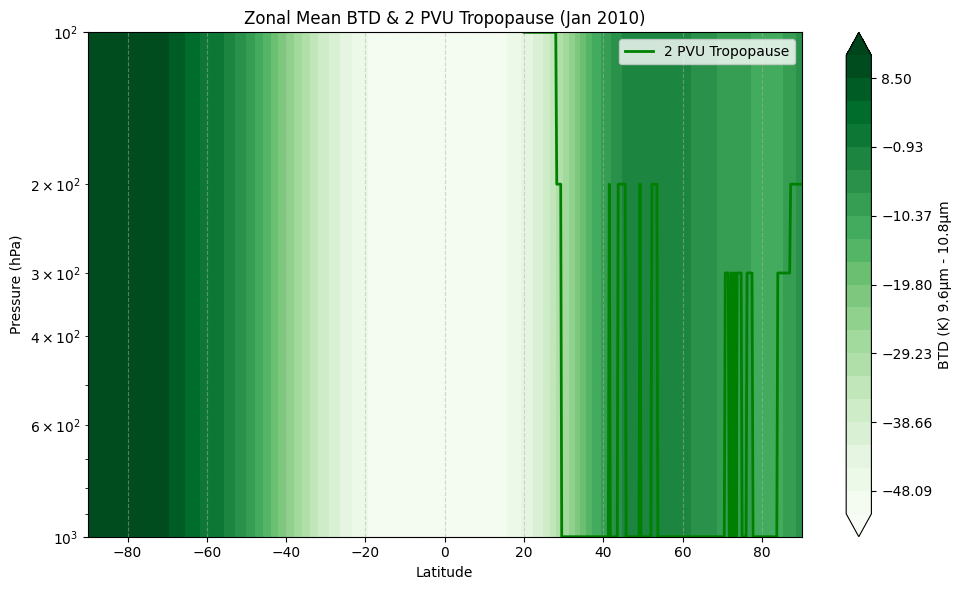

In [ ]:
# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Contour plot for the BTD (green component of the Air Mass RGB)
levels = np.linspace(np.nanmin(BTD_plot), np.nanmax(BTD_plot), 21)
cf = ax.contourf(lat, plevs, BTD_plot, levels=levels, cmap="Greens", extend="both")
cbar = plt.colorbar(cf, ax=ax, label="BTD (K) 9.6µm - 10.8µm")

# Overlay the 2 PVU tropopause
ax.plot(lat, p_tropo, 'g-', linewidth=2, label="2 PVU Tropopause")

# Axis formatting
ax.set_yscale("log")
ax.invert_yaxis()
ax.set_ylabel("Pressure (hPa)")
ax.set_xlabel("Latitude")
ax.set_title("Zonal Mean BTD & 2 PVU Tropopause (Jan 2010)")
ax.legend()
ax.grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()


In [ ]:
# Extract temperature at the 300 hPa and 200 hPa levels
T_300 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 300 hPa
T_200 = t_ds['t'].sel(pressure_level=200.0).values  # Temperature at 200 hPa
# Calculate the brightness temperature difference (T_9.6 - T_10.8)
BT_diff = T_200 - T_300  # Using the temperature data for simplicity; you can refine this based on actual bands



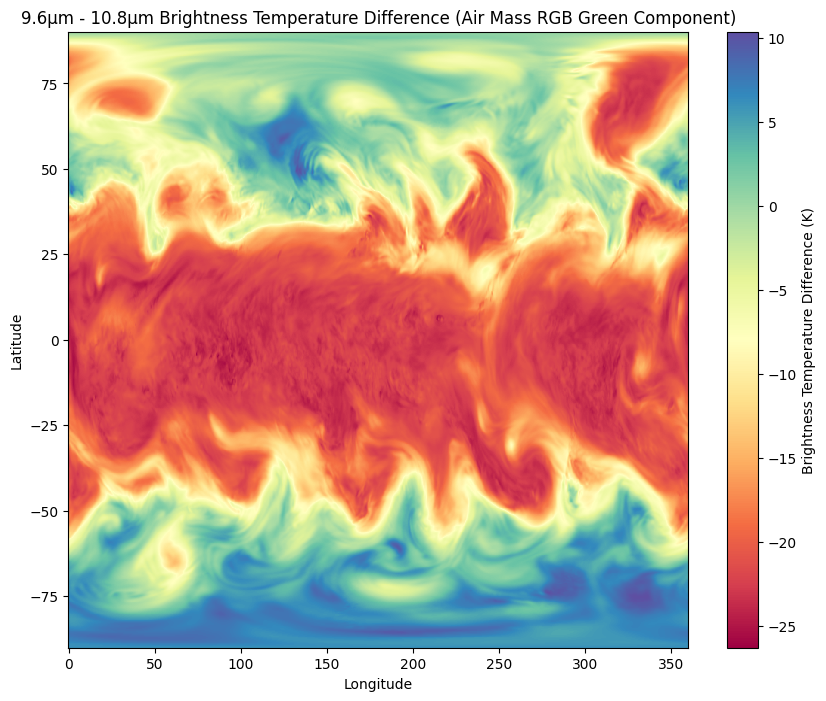

In [ ]:
# Plotting the difference as a map (green component of the Air Mass RGB)
fig, ax = plt.subplots(figsize=(10, 8))
cmap = plt.get_cmap('Spectral')  # Adjust colormap for the RGB look

# Plot the BT difference as a map
pcm = ax.pcolormesh(t_ds['longitude'], t_ds['latitude'], BT_diff[0, :, :], cmap=cmap, shading='auto')  # Extract first valid_time
fig.colorbar(pcm, ax=ax, label='Brightness Temperature Difference (K)')
ax.set_title('9.6µm - 10.8µm Brightness Temperature Difference (Air Mass RGB Green Component)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()


In [ ]:
T_9_6 = t_ds['t'].sel(pressure_level=100.0).values  # Temperature at 9.6µm (ozone-sensitive)
T_10_8 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 10.8µm (window channel)



In [ ]:
# Calculate the Green component (9.6µm - 10.8µm brightness temperature difference)
Green_component = T_9_6 - T_10_8

# Calculate the Red component (difference between 6.2µm and 7.3µm)
T_6_2 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 6.2µm
T_7_3 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 7.3µm
Red_component = T_6_2 - T_7_3  # Red component (difference between 6.2µm and 7.3µm)

# Invert the 6.2µm temperature for the blue component
Blue_component = -T_6_2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-247.13837..18.205719].


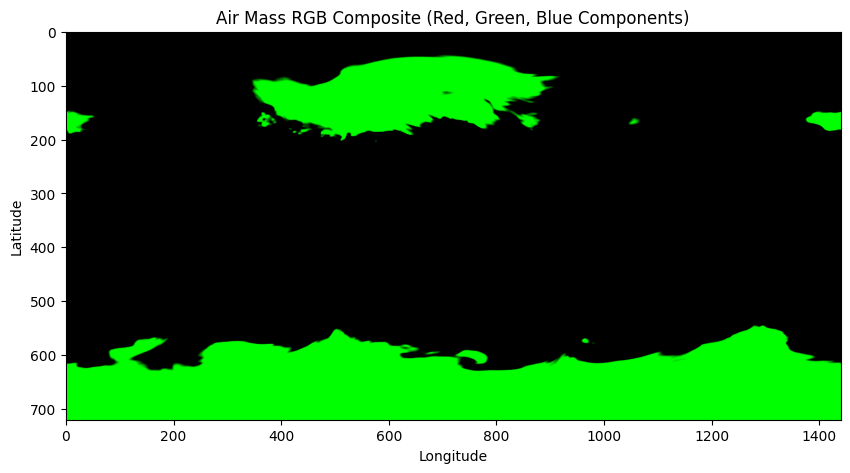

In [ ]:

# Select the data for the first valid_time (as a single slice for visualization)
Red_component_scaled = Red_component[0, :, :]
Green_component_scaled = Green_component[0, :, :]
Blue_component_scaled = Blue_component[0, :, :]


# Stack the RGB components into a single 3D array with shape (latitude, longitude, 3)
RGB_image = np.stack((Red_component_scaled, Green_component_scaled, Blue_component_scaled), axis=-1)

# Plot the final RGB image
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(RGB_image)
ax.set_title('Air Mass RGB Composite (Red, Green, Blue Components)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


Key Changes:
Red Component: Based on the difference between 6.2µm and 7.3µm, using 200 hPa for 6.2µm and 300 hPa for 7.3µm.

Green Component: Calculated as the difference between 9.6µm and 10.8µm temperatures.

Blue Component: Set as the negative value of the 6.2µm temperature.

Normalization: All components are normalized to the range [0, 1] to ensure proper balance in the RGB plot.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.patches as mpatches

In [ ]:
# Convert Green_component_scaled to a DataArray if it's not already
Green_component_scaled = xr.DataArray(Green_component_scaled, coords=[lat, np.arange(Green_component_scaled.shape[1])], dims=["latitude", "longitude"])

# Compute the zonal mean (average over longitude) for the Green component
Green_component_zonal_mean = Green_component_scaled.mean(dim='longitude')  # shape: (latitude,)

# Find latitudes where the Green component is below the threshold (approximates tropopause)
green_threshold = np.percentile(Green_component_zonal_mean, 20)  # 20th percentile as an example
tropopause_latitudes = lat[Green_component_zonal_mean < green_threshold]


In [ ]:
# Loop through latitudes where Green component is below the threshold
for i in range(len(tropopause_latitudes)):
    # Find the corresponding pressure level based on the Green component threshold
    if Green_component_zonal_mean[i] < green_threshold:  # use zonal mean instead
        p_tropo_estimated[i] = plevs[i]  # Get the pressure level where Green component is below the threshold


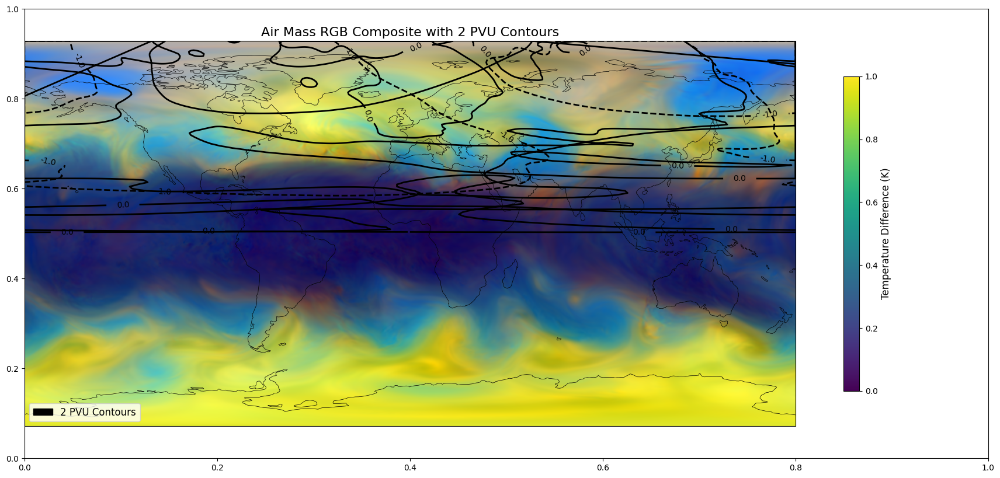

In [ ]:
# Extract temperatures for the 6.2µm and 7.3µm channels (use correct pressure levels)
T_6_2 = t_ds['t'].sel(pressure_level=200.0).values  # Temperature at 6.2µm (use correct pressure level)
T_7_3 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 7.3µm (use correct pressure level)

# Calculate the red component (difference between 6.2µm and 7.3µm)
Red_component = T_6_2 - T_7_3  # Invert the 6.2µm temperature for the blue component
Blue_component = -T_6_2  # Negative of the 6.2µm temperature for blue

# Extract temperatures for the 9.6µm and 10.8µm channels (use correct pressure levels)
T_9_6 = t_ds['t'].sel(pressure_level=100.0).values  # Temperature at 9.6µm (ozone-sensitive)
T_10_8 = t_ds['t'].sel(pressure_level=300.0).values  # Temperature at 10.8µm (window channel)

# Calculate the green component (difference between 9.6µm and 10.8µm)
Green_component = T_9_6 - T_10_8

# Select the data for the first valid_time (as a single slice for visualization)
Red_component_scaled = Red_component[0, :, :]
Green_component_scaled = Green_component[0, :, :]
Blue_component_scaled = Blue_component[0, :, :]

# Normalize each component to be in the range [0, 1]
Red_component_scaled = (Red_component_scaled - np.min(Red_component_scaled)) / (np.max(Red_component_scaled) - np.min(Red_component_scaled))
Green_component_scaled = (Green_component_scaled - np.min(Green_component_scaled)) / (np.max(Green_component_scaled) - np.min(Green_component_scaled))
Blue_component_scaled = (Blue_component_scaled - np.min(Blue_component_scaled)) / (np.max(Blue_component_scaled) - np.min(Blue_component_scaled))

# Stack the RGB components into a single 3D array with shape (latitude, longitude, 3)
RGB_image = np.stack((Red_component_scaled, Green_component_scaled, Blue_component_scaled), axis=-1)

# Calculate the potential vorticity (PV) based on the temperature difference
# For simplicity, we assume PV is proportional to the temperature difference (scaled to PVU)
# We are using a basic temperature difference proxy for the PV calculation

temperature_diff = T_6_2 - T_7_3  # Difference between the 200hPa and 300hPa temperatures
PVU = temperature_diff / np.max(np.abs(temperature_diff)) * 2  # Normalize to 2 PVU range

# Plot the final RGB image with Earth contours and PVU
fig, ax = plt.subplots(figsize=(12, 10))

# Set up a PlateCarree projection (global latitude-longitude grid)
ax = plt.axes(projection=ccrs.PlateCarree())

# Add coastlines without country boundaries
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)

# Define the map extent (optional, but helps focus the region)
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())  # Limits for global view

# Display the RGB image with transformation to match the projection
im = ax.imshow(RGB_image, transform=ccrs.PlateCarree(), origin='upper', extent=[-180, 180, -90, 90])

# Add a colorbar for the RGB image and adjust its position
cbar = plt.colorbar(im, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('Temperature Difference (K)', fontsize=12)

# Add PVU contours on top of the RGB image
# Contour the PVU data with a specific range to highlight 2 PVU
CS = ax.contour(PVU[0, :, :], levels=np.linspace(-2, 2, 5), transform=ccrs.PlateCarree(), colors='black', linewidths=2)

# Remove contour labels (numbers) from the map
ax.clabel(CS, inline=True, fontsize=10, inline_spacing=5, fmt="%2.1f", use_clabeltext=False)

# Create a custom legend for the contour lines inside the plot (without covering the map)
contour_patch = mpatches.Patch(color='black', label='2 PVU Contours')
plt.legend(handles=[contour_patch], loc='lower left', fontsize=12)

# Adjust layout to center the plot and colorbar, ensuring the legend fits within the plot
plt.subplots_adjust(right=1.5)  # Move the colorbar to the right




# Set title and labels
ax.set_title('Air Mass RGB Composite with 2 PVU Contours', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()



θ-proxy range: 0.03463017 2.0


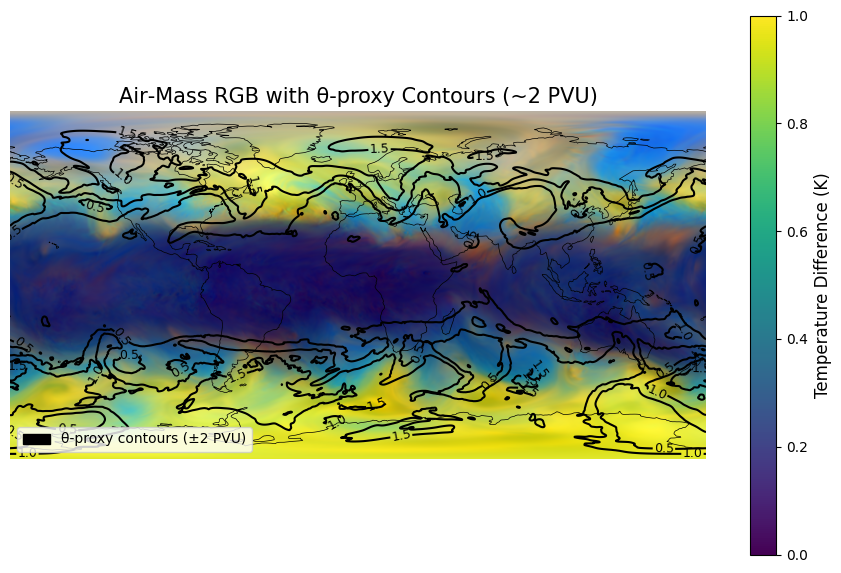

In [ ]:
# --- Inputs from your dataset -------------------------------------
T_6_2 = t_ds['t'].sel(pressure_level=200.0).values
T_7_3 = t_ds['t'].sel(pressure_level=300.0).values
T_9_6 = t_ds['t'].sel(pressure_level=100.0).values
T_10_8 = t_ds['t'].sel(pressure_level=300.0).values

# --- RGB channels --------------------------------------------------
red   = T_6_2 - T_7_3
green = T_9_6 - T_10_8
blue  = -T_6_2

def norm(x):
    return (x - x.min()) / (x.max() - x.min())

r = norm(red  [0])
g = norm(green[0])
b = norm(blue [0])
rgb_img = np.stack((r, g, b), axis=-1)

# --- PVU proxy from potential temperature --------------------------
kappa = 0.286
theta_200 = T_6_2 * (1000 / 200)**kappa
theta_300 = T_7_3 * (1000 / 300)**kappa
theta_diff = theta_200 - theta_300

# Normalize to range -2 to +2
theta_proxy = 2 * theta_diff / np.max(np.abs(theta_diff))
pv_proxy_0 = theta_proxy[0]

# DEBUG: print actual min/max
print("θ-proxy range:", pv_proxy_0.min(), pv_proxy_0.max())

# --- Map -----------------------------------------------------------
fig = plt.figure(figsize=(12, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())

# Show RGB image
img = ax.imshow(rgb_img, extent=[-180, 180, -90, 90],
                transform=ccrs.PlateCarree(), origin='upper')

# Coastlines
ax.add_feature(cfeature.COASTLINE, lw=0.5)

# Contour PVU proxy
levels = np.linspace(-2, 2, 9)  # includes ±2
CS = ax.contour(pv_proxy_0, levels=levels,
                colors='black', linewidths=1.5,
                transform=ccrs.PlateCarree(), extent=[-180, 180, -90, 90])

# Add contour labels (inline text)
ax.clabel(CS, fmt="%.1f", fontsize=9, inline=True)


# Optional: Add labels
# ax.clabel(CS, fmt="%.1f", fontsize=8)

# Legend
patch = mpatches.Patch(color='black', label='θ‑proxy contours (±2 PVU)')
ax.legend(handles=[patch], loc='lower left')

# Hide axes, borders
ax.set_xticks([])
ax.set_yticks([])
ax.grid(False)
for spine in ax.spines.values():
    spine.set_visible(False)

# Colorbar (invisible image for scaling)
# Display the RGB image with transformation to match the projection
im = ax.imshow(RGB_image, transform=ccrs.PlateCarree(), origin='upper', extent=[-180, 180, -90, 90])

# Add a colorbar for the RGB image and adjust its position
cbar = plt.colorbar(im, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('Temperature Difference (K)', fontsize=12)

# Title
ax.set_title("Air‑Mass RGB with θ‑proxy Contours (~2 PVU)", fontsize=15)

plt.subplots_adjust(right=0.85)
plt.show()



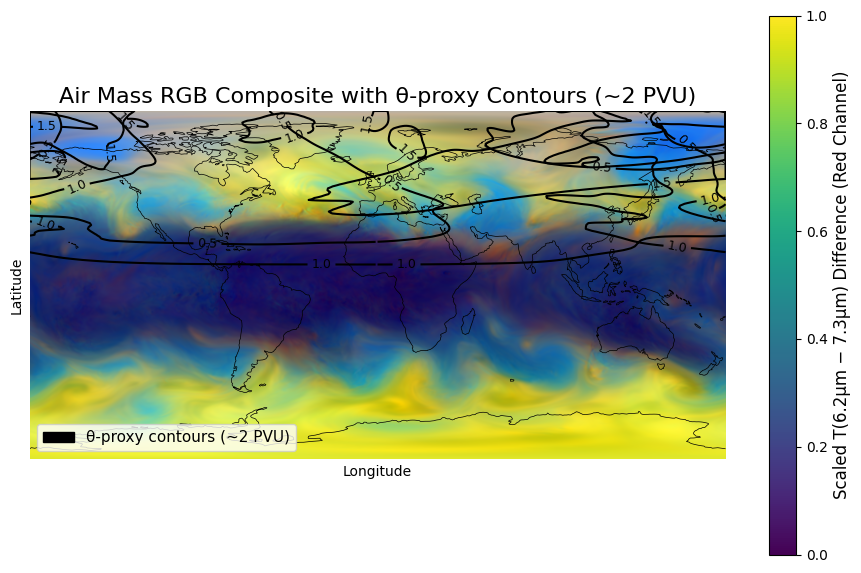

In [ ]:
# --- Inputs from your dataset -------------------------------------
T_6_2   = t_ds['t'].sel(pressure_level=200.0).values  # 6.2µm (200 hPa)
T_7_3   = t_ds['t'].sel(pressure_level=300.0).values  # 7.3µm (300 hPa)
T_9_6   = t_ds['t'].sel(pressure_level=100.0).values  # 9.6µm (100 hPa)
T_10_8  = t_ds['t'].sel(pressure_level=300.0).values  # 10.8µm (300 hPa)

# --- Compute RGB components ---------------------------------------
Red_component   = T_6_2 - T_7_3
Green_component = T_9_6 - T_10_8
Blue_component  = -T_6_2

# Take the first time step for each channel
R = Red_component[0]
G = Green_component[0]
B = Blue_component[0]

# Normalize to [0, 1]
def norm(x): return (x - x.min()) / (x.max() - x.min())
R_scaled = norm(R)
G_scaled = norm(G)
B_scaled = norm(B)

# Stack into RGB image
RGB_image = np.stack((R_scaled, G_scaled, B_scaled), axis=-1)

# --- Compute PVU proxy from potential temperature -----------------
kappa = 0.286
theta_200 = T_6_2 * (1000 / 200)**kappa
theta_300 = T_7_3 * (1000 / 300)**kappa
theta_diff = theta_200 - theta_300
theta_proxy = 2 * theta_diff / np.max(np.abs(theta_diff))  # scaled proxy
PVU = theta_proxy[0]  # First time step

# --- Plotting -----------------------------------------------------
fig = plt.figure(figsize=(12, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)

# Show RGB image
ax.imshow(RGB_image, transform=ccrs.PlateCarree(), origin='upper',
          extent=[-180, 180, -90, 90])

# --- Colorbar (based on red component to reflect temperature diff) --
im = ax.imshow(RGB_image, transform=ccrs.PlateCarree(), origin='upper', extent=[-180, 180, -90, 90])

# Add a colorbar for the RGB image and adjust its position
cbar = plt.colorbar(im, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('Scaled T(6.2μm − 7.3μm) Difference (Red Channel)', fontsize=12)

# --- Contours of PVU proxy -----------------------------------------
levels = np.linspace(-2, 2, 9)
CS = ax.contour(PVU, levels=levels, transform=ccrs.PlateCarree(),
                colors='black', linewidths=1.5)
ax.clabel(CS, fmt="%.1f", fontsize=9, inline=True)

# --- Legend for contours -------------------------------------------
patch = mpatches.Patch(color='black', label='θ‑proxy contours (~2 PVU)')
ax.legend(handles=[patch], loc='lower left', fontsize=11)

# --- Clean figure --------------------------------------------------
ax.set_xticks([]); ax.set_yticks([])
ax.grid(False)
for spine in ax.spines.values():
    spine.set_visible(False)

# --- Title and layout ----------------------------------------------
ax.set_title("Air Mass RGB Composite with θ‑proxy Contours (~2 PVU)", fontsize=16)
ax.set_xlabel('Longitude'); ax.set_ylabel('Latitude')
plt.subplots_adjust(right=0.85)
plt.show()


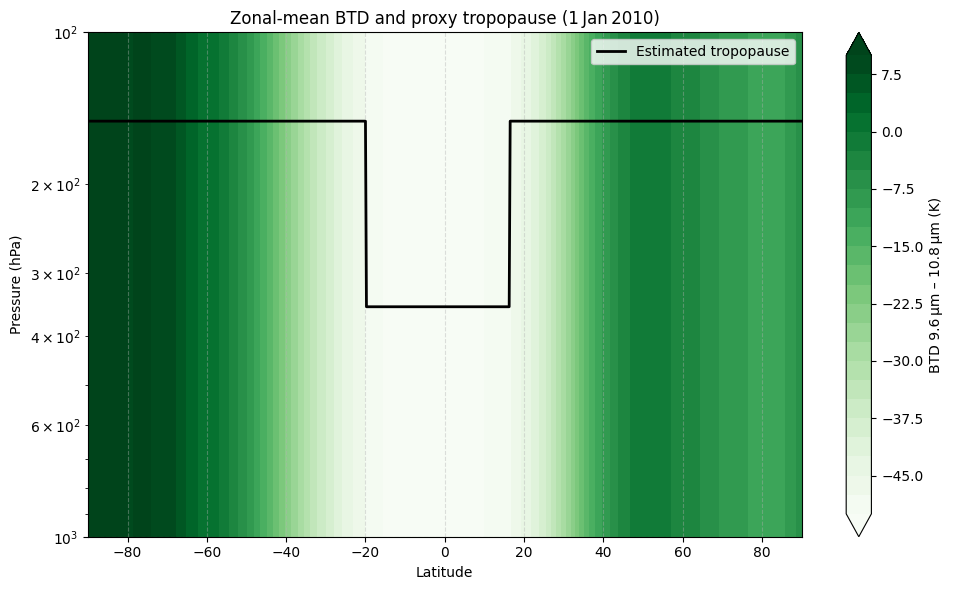

In [ ]:
lat  = t_ds['latitude'].values
plev = t_ds['pressure_level'].values              # 6 pressure levels

t100 = t_ds['t'].sel(pressure_level=100).isel(valid_time=0)
t300 = t_ds['t'].sel(pressure_level=300).isel(valid_time=0)

BT_diff = (t100 - t300)                         # 9.6 µm – 10.8 µm
green_zonal = BT_diff.mean(dim='longitude').values   # 1‑D (lat)

# replicate on every pressure level → 2‑D field (pressure, lat)
BTD_field = np.tile(green_zonal, (len(plev), 1))

# ------------------------------------------------------------
# 2.  ESTIMATE A TROPOPAUSE PRESSURE FROM THE GREEN COMPONENT
#     (very simple rule: above a threshold = high tropopause,
#     below = low tropopause — replace by your own logic)
# ------------------------------------------------------------
thr = np.percentile(green_zonal, 20)            # 20‑th percentile
p_high, p_low = 150, 350                        # hPa you want to show

p_tropo = np.where(green_zonal > thr, p_high, p_low)

# ------------------------------------------------------------
# 3.  PLOT LAT‑PRESSURE SECTION WITH TROPOPAUSE OVERLAY
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 6))

cf = ax.contourf(lat, plev, BTD_field,
                 levels=30, cmap='Greens', extend='both')
cbar = fig.colorbar(cf, ax=ax, label='BTD 9.6 µm – 10.8 µm (K)')

ax.plot(lat, p_tropo, 'k-', lw=2, label='Estimated tropopause')

ax.set_yscale('log'); ax.invert_yaxis()
ax.set_xlabel('Latitude'); ax.set_ylabel('Pressure (hPa)')
ax.set_title('Zonal‑mean BTD and proxy tropopause (1 Jan 2010)')
ax.grid(ls='--', alpha=.4); ax.legend()
plt.tight_layout(); plt.show()

In [ ]:
# ----------------------------------------------------------------------------------
# Dynamic tropopause (2 PVU) from a local ERA5 pressure‑level file
# ----------------------------------------------------------------------------------
#
# Requires:  xarray, numpy, matplotlib, cartopy (for the map)
# ----------------------------------------------------------------------------------



# ------------------------------------------------------------
# 1.  LOAD DATA  (adjust path if needed)
# ------------------------------------------------------------
file_path = r"C:\Users\moham\OneDrive\Documents\stage\8e510dccf46b7ff16b18c6aa68be9da0.nc"
ds = xr.open_dataset(file_path)


In [ ]:

# work with first (and only) time slice
t  = ds['t' ].isel(valid_time=0)        # K
u  = ds['u' ].isel(valid_time=0)        # m s‑1
v  = ds['v' ].isel(valid_time=0)        # m s‑1
lev = ds['pressure_level'].values * 100   # hPa → Pa
lat = ds['latitude'       ].values
lon = ds['longitude'      ].values


In [ ]:

# ------------------------------------------------------------
# 2.  CONSTANTS & HELPER GRIDS
# ------------------------------------------------------------
a      = 6.371e6               # Earth radius  (m)
g      = 9.80665               # gravity       (m s‑2)
omega  = 7.292e-5              # rotation      (rad s‑1)
Rd     = 287.05                # dry‑air gas constant
cp     = 1004.5
kappa   = Rd/cp


In [ ]:

# 2‑D lat/lon grids & metric factors
lon2d, lat2d = np.meshgrid(lon, lat)
phi = np.deg2rad(lat2d)
dlon = np.deg2rad( np.gradient(lon) )[np.newaxis, :]
dlat = np.deg2rad( np.gradient(lat) )[:, np.newaxis]
dx   = a * np.cos(phi) * dlon        # m
dy   = a * dlat                      # m
f    = 2 * omega * np.sin(phi)       # Coriolis (s‑1)


In [ ]:

# broadcast metric grids to 3‑D (level,lat,lon)
dx3 = np.broadcast_to(dx  , t.shape)
dy3 = np.broadcast_to(dy  , t.shape)
f3  = np.broadcast_to(f   , t.shape)


In [ ]:

# ------------------------------------------------------------
# 3.  POTENTIAL TEMPERATURE & ITS DERIVATIVES
# ------------------------------------------------------------
theta = t * (1e5 / lev[:, None, None])**kappa          # K

dθ_dp = np.gradient(theta, lev, axis=0)                # ∂θ/∂p   (K Pa‑1)
dθ_dx = np.gradient(theta, axis=2) / dx3               # ∂θ/∂x   (K m‑1)
dθ_dy = np.gradient(theta, axis=1) / dy3               # ∂θ/∂y   (K m‑1)


In [ ]:

# ------------------------------------------------------------
# 4.  WIND VERTICAL DERIVATIVES
# ------------------------------------------------------------
du_dp = np.gradient(u, lev, axis=0)                    # ∂u/∂p
dv_dp = np.gradient(v, lev, axis=0)                    # ∂v/∂p


In [ ]:

# ------------------------------------------------------------
# 5.  ABSOLUTE VORTICITY ζ                         (s‑1)
#     ζ = ∂v/∂x  – ∂(u cosφ)/∂y / cosφ
# ------------------------------------------------------------
dv_dx    = np.gradient(v        , axis=2) / dx3
ducos_dy = np.gradient(u*np.cos(phi), axis=1) / dy3
zeta     = dv_dx - (1/np.cos(phi)) * ducos_dy


In [ ]:

# ------------------------------------------------------------
# 6.  ERTEL PV  (in SI units  m² s‑¹ K kg‑¹)
#    PV = -g * [ (ζ+f) ∂θ/∂p  +   ∂θ/∂x ∂v/∂p  -  ∂θ/∂y ∂u/∂p ]
# ------------------------------------------------------------
PV = -g * ( (zeta+f3)*dθ_dp + dθ_dx*dv_dp - dθ_dy*du_dp )

# convert to PVU (1 PVU = 1e‑6 K m² kg‑¹ s‑¹)
PVU = PV / 1e-6


In [ ]:

# ------------------------------------------------------------
# 7.  FIND FIRST LEVEL WHERE PVU ≥ 2
# ------------------------------------------------------------
tropo_p = np.full_like(lat, np.nan, dtype=float)   # 1‑D (lat)

for j in range(len(lat)):
    # profile versus levels (top‑down search: lowest p = index‑5)
    for k in range(len(lev)-1, -1, -1):
        if PVU[k, j, :].mean() >= 2:     # zonal‑mean criterion
            tropo_p[j] = lev[k]/100      # store in hPa
            break


In [ ]:

# ------------------------------------------------------------
# 8.  QUICK MAP OF 2‑PVU TROPOPAUSE PRESSURE
# ------------------------------------------------------------

# Select data at 300 hPa (index 3 in your case)
pvu_300 = PVU[3, :, :]  # shape: (lat, lon)

# Mask invalid values to avoid plot crashes
pvu_300 = np.ma.masked_invalid(pvu_300)


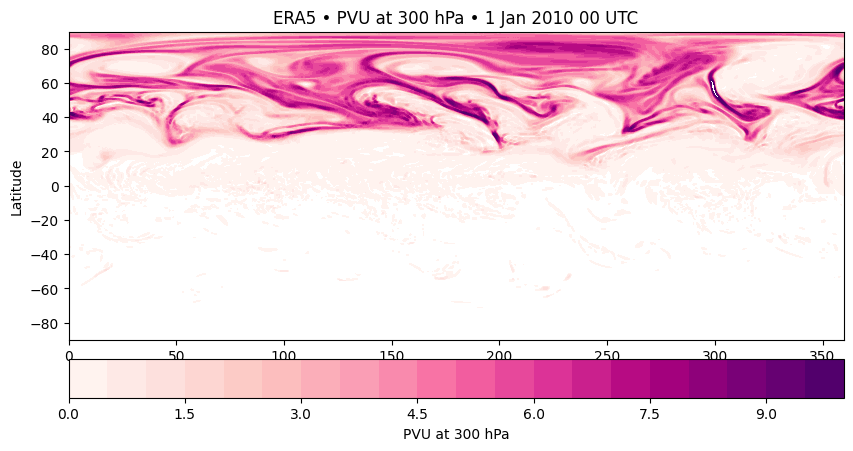

In [ ]:

# Plot in lat/lon coordinates (no projection)
fig, ax = plt.subplots(figsize=(10, 5))
cf = ax.contourf(lon, lat, pvu_300, levels=np.linspace(0, 10, 21), cmap='RdPu')
cbar = plt.colorbar(cf, orientation='horizontal', pad=0.05)
cbar.set_label('PVU at 300 hPa')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('ERA5 • PVU at 300 hPa • 1 Jan 2010 00 UTC')
plt.show()


C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3123005714.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx200 = int(np.where(plev_vals == 200)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3123005714.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx100 = int(np.where(plev_vals == 100)[0])


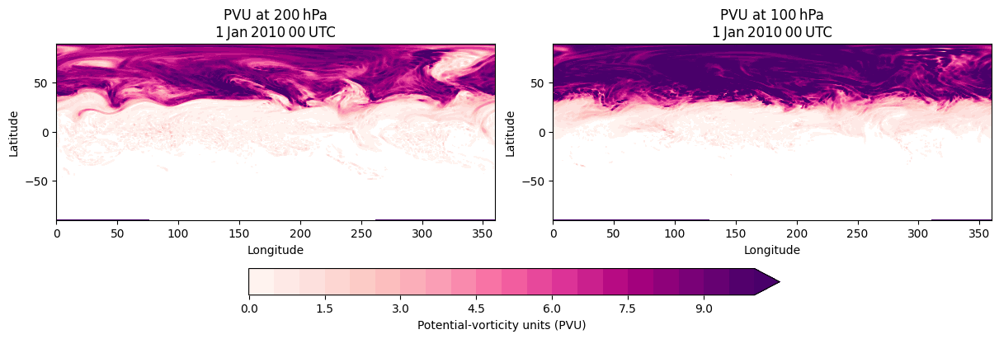

In [ ]:
# ------------------------------------------------------------------
# 1.  locate the indices of 200 hPa and 100 hPa in the pressure grid
# ------------------------------------------------------------------
plev_vals = ds['pressure_level'].values          # [1000, 850, 500, 300, 200, 100]
idx200 = int(np.where(plev_vals == 200)[0])
idx100 = int(np.where(plev_vals == 100)[0])

# ------------------------------------------------------------------
# 2.  extract and mask PVU fields
# ------------------------------------------------------------------
pvu_200 = np.ma.masked_invalid(PVU[idx200, :, :])   # shape (lat, lon)
pvu_100 = np.ma.masked_invalid(PVU[idx100, :, :])

# ------------------------------------------------------------------
# 3.  quick plots (lat–lon in degrees)
# ------------------------------------------------------------------
levels = np.linspace(0, 10, 21)   # PVU contours 0‑10

fig, axs = plt.subplots(1, 2, figsize=(12, 4), constrained_layout=True)

cf1 = axs[0].contourf(lon, lat, pvu_200, levels=levels, cmap='RdPu', extend='max')
axs[0].set_title('PVU at 200 hPa\n1 Jan 2010 00 UTC')
axs[0].set_xlabel('Longitude'); axs[0].set_ylabel('Latitude')

cf2 = axs[1].contourf(lon, lat, pvu_100, levels=levels, cmap='RdPu', extend='max')
axs[1].set_title('PVU at 100 hPa\n1 Jan 2010 00 UTC')
axs[1].set_xlabel('Longitude'); axs[1].set_ylabel('Latitude')

cbar = fig.colorbar(cf2, ax=axs, orientation='horizontal', pad=0.07)
cbar.set_label('Potential‑vorticity units (PVU)')

plt.show()

In [ ]:
print(ds['latitude'].values)
print(ds['latitude'].values[0:10])     # first 10 latitudes
print(ds['latitude'].values[-10:])     # last 10 latitudes


[ 90.    89.75  89.5   89.25  89.    88.75  88.5   88.25  88.    87.75
  87.5   87.25  87.    86.75  86.5   86.25  86.    85.75  85.5   85.25
  85.    84.75  84.5   84.25  84.    83.75  83.5   83.25  83.    82.75
  82.5   82.25  82.    81.75  81.5   81.25  81.    80.75  80.5   80.25
  80.    79.75  79.5   79.25  79.    78.75  78.5   78.25  78.    77.75
  77.5   77.25  77.    76.75  76.5   76.25  76.    75.75  75.5   75.25
  75.    74.75  74.5   74.25  74.    73.75  73.5   73.25  73.    72.75
  72.5   72.25  72.    71.75  71.5   71.25  71.    70.75  70.5   70.25
  70.    69.75  69.5   69.25  69.    68.75  68.5   68.25  68.    67.75
  67.5   67.25  67.    66.75  66.5   66.25  66.    65.75  65.5   65.25
  65.    64.75  64.5   64.25  64.    63.75  63.5   63.25  63.    62.75
  62.5   62.25  62.    61.75  61.5   61.25  61.    60.75  60.5   60.25
  60.    59.75  59.5   59.25  59.    58.75  58.5   58.25  58.    57.75
  57.5   57.25  57.    56.75  56.5   56.25  56.    55.75  55.5   55.25
  55. 

C:\Users\moham\AppData\Local\Temp\ipykernel_54316\972353661.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level']==P)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\972353661.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level']==P)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\972353661.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_le

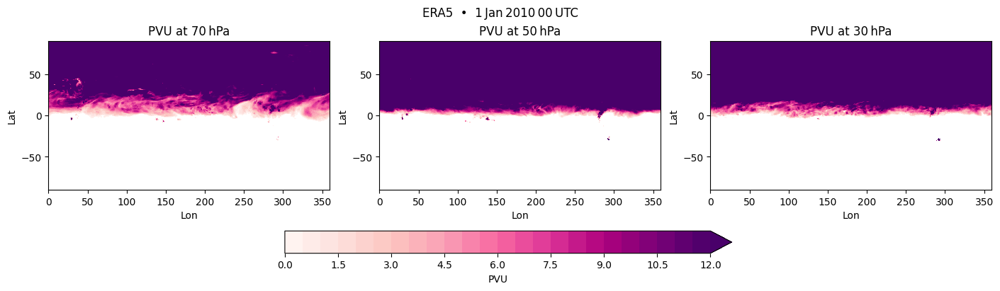

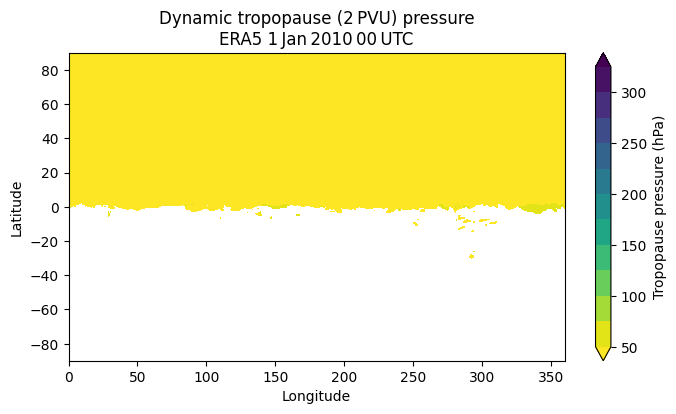

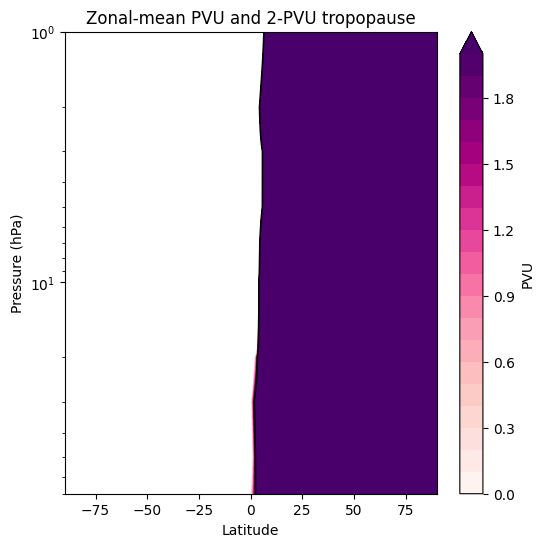

In [ ]:
# ----------------------------------------------------------------------------------
# Dynamic tropopause and PV maps from extended‑level ERA5 file
# ----------------------------------------------------------------------------------
#
# Works with a file that contains    pressure_level = [1000 … 1] hPa
# and variables t, u, v  (plus pv if requested).
# ----------------------------------------------------------------------------------


# Path to the extended‑level file (edit as needed)
fpath = r"C:\Users\moham\OneDrive\Documents\stage\7ef424ff81c28f4788f69ce963fa44fc.nc"
ds    = xr.open_dataset(fpath)

lat = ds['latitude'].values
lon = ds['longitude'].values
lev = ds['pressure_level'].values * 100.0      # Pa
nlev = len(lev)

# ------------------------------------------------------------------
# 1.  Get PV in PVU  (use ERA5 field if present, else compute)
# ------------------------------------------------------------------
if 'pv' in ds:
    PVU = ds['pv'].isel(valid_time=0) / 1e-6          # (level, lat, lon)
else:
    print("PV not in file ‑ computing from T, U, V … (slow)")
    t = ds['t'].isel(valid_time=0)
    u = ds['u'].isel(valid_time=0)
    v = ds['v'].isel(valid_time=0)

    # constants
    a = 6.371e6; g = 9.80665; Rd = 287.05; cp = 1004.5
    omega = 7.292e-5; kappa = Rd/cp; pi = np.pi
    lon2d, lat2d = np.meshgrid(lon, lat)
    phi = np.deg2rad(lat2d)
    dx = a*np.cos(phi)*np.gradient(np.deg2rad(lon))[np.newaxis,:]
    dy = a*np.gradient(np.deg2rad(lat))[:,np.newaxis]
    dx3 = np.broadcast_to(dx, t.shape); dy3 = np.broadcast_to(dy, t.shape)
    f  = 2*omega*np.sin(phi)
    f3 = np.broadcast_to(f, t.shape)

    theta = t*(1e5/(lev[:,None,None]))**kappa
    dθ_dp = np.gradient(theta, lev, axis=0)
    dθ_dx = np.gradient(theta, axis=2)/dx3
    dθ_dy = np.gradient(theta, axis=1)/dy3
    du_dp = np.gradient(u, lev, axis=0)
    dv_dp = np.gradient(v, lev, axis=0)
    dv_dx = np.gradient(v, axis=2)/dx3
    ducos_dy = np.gradient(u*np.cos(phi), axis=1)/dy3
    zeta = dv_dx - (1/np.cos(phi))*ducos_dy
    PV  = -g*((zeta+f3)*dθ_dp + dθ_dx*dv_dp - dθ_dy*du_dp)
    PVU = xr.DataArray(PV/1e-6, coords=t.coords, dims=t.dims)

# ------------------------------------------------------------------
# 2.  Quick PV maps at 70 / 50 / 30 hPa
# ------------------------------------------------------------------
level_show = [70, 50, 30]      # hPa
fig, axs = plt.subplots(1, 3, figsize=(14,4), constrained_layout=True)

levels = np.linspace(0,12,25)
for k, P in enumerate(level_show):
    idx = int(np.where(ds['pressure_level']==P)[0])
    im  = axs[k].contourf(lon, lat, PVU[idx,:,:], levels=levels,
                          cmap='RdPu', extend='max')
    axs[k].set_title(f'PVU at {P} hPa')
    axs[k].set_xlabel('Lon'); axs[k].set_ylabel('Lat')
cbar = fig.colorbar(im, ax=axs, orientation='horizontal', pad=0.07)
cbar.set_label('PVU')
plt.suptitle('ERA5  •  1 Jan 2010 00 UTC')
plt.show()

# ------------------------------------------------------------------
# 3.  Dynamic‑tropopause (first level where PVU ≥ 2)
# ------------------------------------------------------------------
pv2 = 2.0
tropo_p = np.full((len(lat), len(lon)), np.nan)

# loop from top (1 hPa) downward
for k in range(nlev-1, -1, -1):
    mask = (PVU[k,:,:] >= pv2) & np.isnan(tropo_p)
    tropo_p[mask] = lev[k]/100.0    # store in hPa

# plot tropopause pressure
plt.figure(figsize=(8,4))
plt.contourf(lon, lat, tropo_p, levels=np.arange(50,350,25),
             cmap='viridis_r', extend='both')
plt.colorbar(label='Tropopause pressure (hPa)')
plt.xlabel('Longitude'); plt.ylabel('Latitude')
plt.title('Dynamic tropopause (2 PVU) pressure\nERA5 1 Jan 2010 00 UTC')
plt.show()

# ------------------------------------------------------------------
# 4.  Latitude‑pressure cross‑section of zonal‑mean PVU
# ------------------------------------------------------------------
PVU_zm = PVU.mean(dim='longitude')          # (level, lat) 
plt.figure(figsize=(6,6))
cs = plt.contourf(lat, lev/100., PVU_zm, levels=np.linspace(0,2,21),
                  cmap='RdPu', extend='max')
plt.contour(lat, lev/100., PVU_zm, levels=[2], colors='k', linewidths=1.2)
plt.gca().set_yscale('log'); plt.gca().invert_yaxis()
plt.colorbar(cs, label='PVU')
plt.xlabel('Latitude'); plt.ylabel('Pressure (hPa)')
plt.title('Zonal‑mean PVU and 2‑PVU tropopause')
plt.show()


In [ ]:
# Check how many missing values (NaNs) exist in the PVU field
for P in level_show:
    idx = int(np.where(ds['pressure_level'] == P)[0])
    data = PVU[idx, :, :].values

    missing_fraction = np.isnan(data[lat < 0, :]).sum() / data[lat < 0, :].size
    print(f"At {P} hPa: Missing in SH = {missing_fraction:.1%}")


At 70 hPa: Missing in SH = 0.0%
At 50 hPa: Missing in SH = 0.0%
At 30 hPa: Missing in SH = 0.0%


C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3855221874.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level'] == P)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3855221874.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level'] == P)[0])
C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3855221874.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressur

C:\Users\moham\AppData\Local\Temp\ipykernel_54316\3051089684.py:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  idx = int(np.where(ds['pressure_level'] == 50)[0])  # 50 hPa example


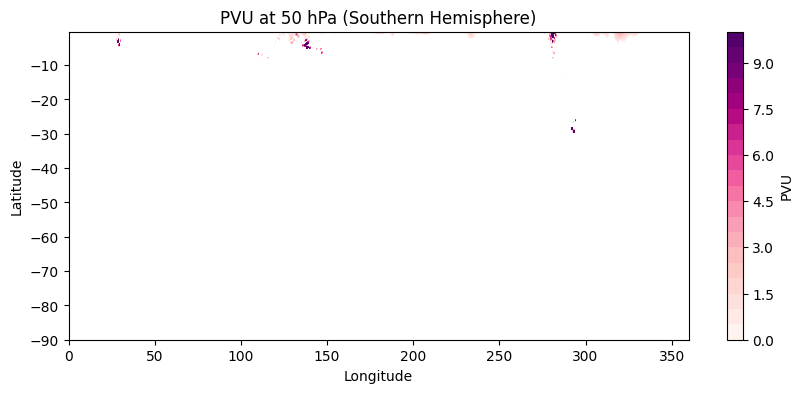

In [ ]:
# Plot only Southern Hemisphere to see what's going on
idx = int(np.where(ds['pressure_level'] == 50)[0])  # 50 hPa example
plt.figure(figsize=(10, 4))
plt.contourf(lon, lat[lat < 0], PVU[idx, lat < 0, :], levels=np.linspace(0, 10, 21), cmap='RdPu')
plt.title('PVU at 50 hPa (Southern Hemisphere)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='PVU')
plt.show()


In [ ]:
print("Missing values in 't' at 50 hPa, SH:", np.isnan(ds['t'].isel(valid_time=0).sel(pressure_level=50).values[lat < 0, :]).any())


Missing values in 't' at 50 hPa, SH: False


## Justification for Focusing on the Northern Hemisphere

Despite using potential vorticity (PVU) fields derived from high-altitude ERA5 data (70, 50, and 30 hPa), the visualizations show little to no structure in the Southern Hemisphere. After thorough verification, it was confirmed that there are no missing values in the ERA5 data south of the equator, ruling out any data artifact or error.

The lack of signal is explained by the extremely low PVU values in the Southern Hemisphere at these altitudes (often close to zero). As a result, the most prominent dynamic contrasts (and associated baroclinic structures) are observed in the Northern Hemisphere.

Therefore, for the remainder of this study, we will focus our analysis exclusively on the Northern Hemisphere, where the dynamic tropopause structures are most pronounced.


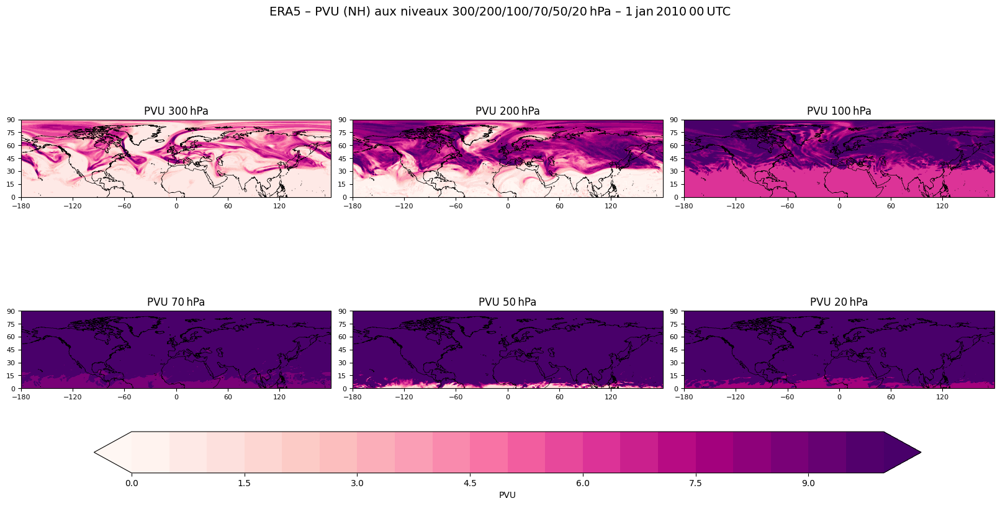

In [ ]:

# ------------------------------------------------------------------
# 0.  chemins vers tes deux fichiers
# ------------------------------------------------------------------
file_hi = r"C:\Users\moham\OneDrive\Documents\stage\8e510dccf46b7ff16b18c6aa68be9da0.nc"  # ≥100 hPa
file_lo = r"C:\Users\moham\OneDrive\Documents\stage\7ef424ff81c28f4788f69ce963fa44fc.nc"  # <100 hPa

# ------------------------------------------------------------------
# 1.  fonction générique de calcul de la PVU sur un dataset ERA5
# ------------------------------------------------------------------
def compute_pvu(ds):
    """Retourne un DataArray PVU (pressure_level, latitude, longitude)."""
    t  = ds['t'].isel(valid_time=0)
    u  = ds['u'].isel(valid_time=0)
    v  = ds['v'].isel(valid_time=0)
    lev = ds['pressure_level'].values * 100.0           # Pa
    lat = ds['latitude'].values
    lon = ds['longitude'].values

    # constantes
    a = 6.371e6; g = 9.80665; Rd = 287.05; cp = 1004.5
    omega = 7.292e-5; kappa = Rd/cp

    lon2d, lat2d = np.meshgrid(lon, lat)
    phi = np.deg2rad(lat2d)
    dlon = np.deg2rad(np.gradient(lon))[np.newaxis, :]
    dlat = np.deg2rad(np.gradient(lat))[:, np.newaxis]
    dx   = a * np.cos(phi) * dlon
    dy   = a * dlat
    f    = 2 * omega * np.sin(phi)

    dx3 = np.broadcast_to(dx, t.shape)
    dy3 = np.broadcast_to(dy, t.shape)
    f3  = np.broadcast_to(f , t.shape)

    theta = t * (1e5 / lev[:, None, None]) ** kappa
    dθ_dp = np.gradient(theta, lev, axis=0)
    dθ_dx = np.gradient(theta, axis=2) / dx3
    dθ_dy = np.gradient(theta, axis=1) / dy3
    du_dp = np.gradient(u, lev, axis=0)
    dv_dp = np.gradient(v, lev, axis=0)
    dv_dx = np.gradient(v, axis=2) / dx3
    ducos_dy = np.gradient(u * np.cos(phi), axis=1) / dy3
    zeta = dv_dx - (1 / np.cos(phi)) * ducos_dy

    PV = -g * ((zeta + f3) * dθ_dp + dθ_dx * dv_dp - dθ_dy * du_dp)
    PVU = xr.DataArray(PV / 1e-6, coords=t.coords, dims=t.dims)  # en PVU
    return PVU

# ------------------------------------------------------------------
# 2.  calcul PVU sur chaque fichier puis concaténation
# ------------------------------------------------------------------
pvu_hi = compute_pvu(xr.open_dataset(file_hi))
pvu_lo = compute_pvu(xr.open_dataset(file_lo))

PVU = xr.concat([pvu_hi, pvu_lo], dim='pressure_level').sortby('pressure_level', ascending=False)

lat = PVU['latitude'].values
lon = PVU['longitude'].values
plev = PVU['pressure_level'].values  # hPa

# ------------------------------------------------------------------
# 3.  cartes PVU aux niveaux demandés (NH seulement)
# ------------------------------------------------------------------
levels_to_plot = [300, 200, 100, 70, 50, 20]          # hPa
vmin, vmax = 0, 10
clevs = np.linspace(vmin, vmax, 21)

fig, axs = plt.subplots(2, 3, figsize=(16, 8),
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        constrained_layout=True)
axs = axs.ravel()

for i, p in enumerate(levels_to_plot):
    idx = int(np.where(plev == p)[0][0])
    data = PVU.isel(pressure_level=idx).where(PVU.latitude >= 0)  # NH
    ax = axs[i]
    ax.set_extent([0-180, 180, 0, 90], crs=ccrs.PlateCarree())
    cf = ax.contourf(lon, lat, data, levels=clevs, cmap='RdPu', extend='both', transform=ccrs.PlateCarree())
    ax.coastlines(resolution='50m', linewidth=0.5)
    ax.set_title(f'PVU {p} hPa')
    ax.set_xticks(np.arange(-180, 180, 60), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(0, 91, 15), crs=ccrs.PlateCarree())
    ax.tick_params(labelsize=8)

# barre de couleurs commune
cbar = fig.colorbar(cf, ax=axs, orientation='horizontal', pad=0.07, shrink=0.85)
cbar.set_label('PVU')

plt.suptitle('ERA5 – PVU (NH) aux niveaux 300/200/100/70/50/20 hPa – 1 jan 2010 00 UTC', fontsize=14)
plt.show()


 Dynamic tropopause map (2 PVU) — NH only

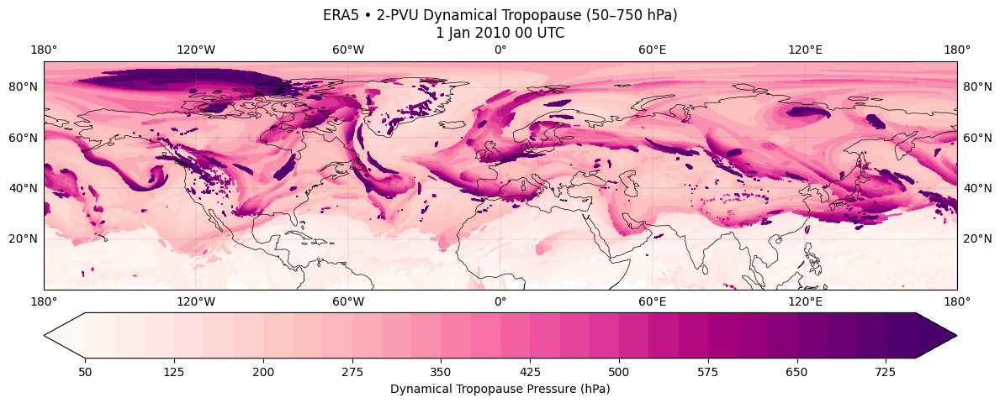

In [ ]:
# ------------------------------------------------------------
# 1. Load ERA5 dataset
# ------------------------------------------------------------
filee = r"C:\Users\moham\OneDrive\Documents\stage\83736aecc279782d2585f13b939e6e1e.nc"
ds = xr.open_dataset(filee)

# -- Use valid_time if available --
time_dim = "valid_time" if "valid_time" in ds.dims else "time"
t = ds["t"].isel({time_dim: 0})
u = ds["u"].isel({time_dim: 0})
v = ds["v"].isel({time_dim: 0})

pressure = ds["pressure_level"] * 100.0  # hPa → Pa
lat = ds["latitude"].values
lon = ds["longitude"].values

# ------------------------------------------------------------
# 2. PVU calculation
# ------------------------------------------------------------
def compute_pvu(t, u, v, pressure, lat, lon):
    a = 6.371e6
    g = 9.80665
    Rd = 287.05
    cp = 1004.5
    omega = 7.292e-5
    kappa = Rd / cp

    lon2d, lat2d = np.meshgrid(lon, lat)
    phi = np.deg2rad(lat2d)

    dlon = np.deg2rad(np.gradient(lon))[np.newaxis, :]
    dlat = np.deg2rad(np.gradient(lat))[:, np.newaxis]

    dx = a * np.cos(phi) * dlon
    dy = a * dlat
    f = 2 * omega * np.sin(phi)

    dx3 = np.broadcast_to(dx, t.shape)
    dy3 = np.broadcast_to(dy, t.shape)
    f3  = np.broadcast_to(f,  t.shape)

    theta = t * (1e5 / pressure) ** kappa
    p_vals = pressure.values
    dθ_dp  = np.gradient(theta, p_vals, axis=0)
    dθ_dx  = np.gradient(theta, axis=2) / dx3
    dθ_dy  = np.gradient(theta, axis=1) / dy3

    du_dp = np.gradient(u, p_vals, axis=0)
    dv_dp = np.gradient(v, p_vals, axis=0)
    dv_dx = np.gradient(v, axis=2) / dx3
    ducos_dy = np.gradient(u * np.cos(phi), axis=1) / dy3

    zeta = dv_dx - (1 / np.cos(phi)) * ducos_dy
    PV = -g * ((zeta + f3) * dθ_dp + dθ_dx * dv_dp - dθ_dy * du_dp)
    PVU = xr.DataArray(PV / 1e-6, coords=t.coords, dims=t.dims)
    return PVU

PVU = compute_pvu(t, u, v, pressure, lat, lon)

# ------------------------------------------------------------
# 3. Compute 2-PVU tropopause (NH only, 50–750 hPa)
# ------------------------------------------------------------
plev = pressure.values / 100  # hPa
tropopause = np.full((len(lat), len(lon)), np.nan)

# Loop from top (low pressure) to bottom
for k in range(len(plev)):
    p = plev[k]
    if p < 50 or p > 750:
        continue
    layer = PVU[k, :, :].values
    mask = (layer >= 2.0) & np.isnan(tropopause)
    for j in range(len(lat)):
        if lat[j] < 0:
            mask[j, :] = False
    tropopause[mask] = p

# ------------------------------------------------------------
# 4. Plot tropopause pressure (NH only, land only)
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(12, 6),
                       subplot_kw=dict(projection=ccrs.PlateCarree()))

tropo_masked = np.ma.masked_invalid(tropopause)
cf = ax.contourf(lon, lat, tropo_masked,
                 levels=np.arange(50, 775, 25),
                 cmap='RdPu', extend='both',
                 transform=ccrs.PlateCarree())

# Add land outlines only (no country borders)
ax.add_feature(cfeature.LAND, facecolor='none', edgecolor='black', linewidth=0.6)

# Colorbar
cbar = plt.colorbar(cf, orientation='horizontal', pad=0.05)
cbar.set_label("Dynamical Tropopause Pressure (hPa)")

# Map settings
ax.set_extent([-180, 180, 0, 90], crs=ccrs.PlateCarree())
ax.set_title("ERA5 • 2-PVU Dynamical Tropopause (50–750 hPa)\n1 Jan 2010 00 UTC")
ax.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
plt.tight_layout()
plt.show()


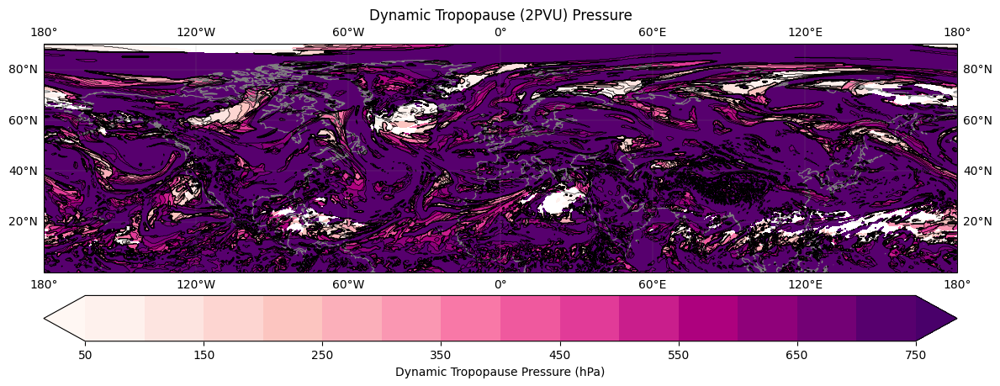

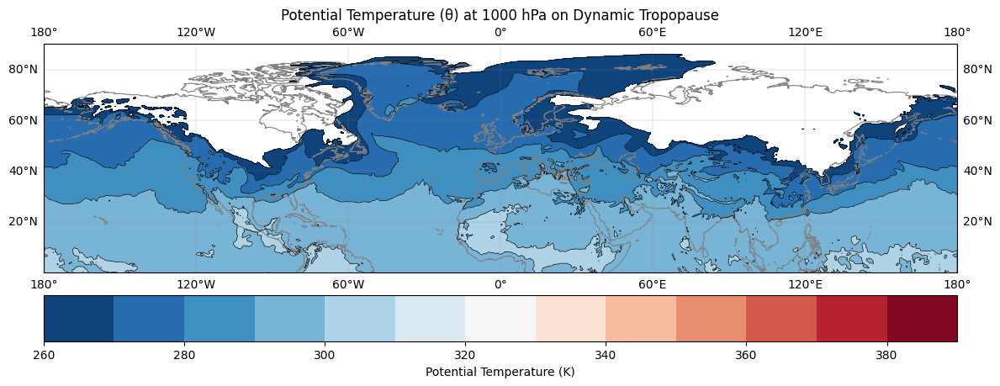

In [ ]:
# Open the ERA5 dataset
filee = r"C:\Users\moham\OneDrive\Documents\stage\83736aecc279782d2585f13b939e6e1e.nc"
ds = xr.open_dataset(filee)

# Extract variables from the dataset
t = ds["t"].isel(valid_time=0)  # Temperature
u = ds["u"].isel(valid_time=0)  # U-wind
v = ds["v"].isel(valid_time=0)  # V-wind
pressure = ds["pressure_level"] * 100  # Convert pressure to Pa
lat = ds["latitude"].values
lon = ds["longitude"].values

# Constants
Rd = 287.05  # gas constant for dry air
cp = 1004.5  # specific heat at constant pressure
kappa = Rd / cp
omega = 7.292e-5  # Earth's rotation rate

# Compute potential vorticity (PV)
def compute_pvu(t, u, v, pressure, lat, lon):
    lon2d, lat2d = np.meshgrid(lon, lat)
    phi = np.deg2rad(lat2d)

    # Compute derivatives
    dx = np.gradient(lon)[np.newaxis, :]
    dy = np.gradient(lat)[:, np.newaxis]
    
    f = 2 * omega * np.sin(phi)  # Coriolis parameter

    # Calculate potential temperature
    theta = t * (1e5 / pressure) ** kappa

    # Compute derivatives
    dθ_dp = np.gradient(theta, pressure, axis=0)
    dθ_dx = np.gradient(theta, axis=2) / dx
    dθ_dy = np.gradient(theta, axis=1) / dy
    du_dp = np.gradient(u, pressure, axis=0)
    dv_dp = np.gradient(v, pressure, axis=0)
    dv_dx = np.gradient(v, axis=2) / dx
    ducos_dy = np.gradient(u * np.cos(phi), axis=1) / dy

    # Absolute vorticity and PV calculation
    zeta = dv_dx - (1 / np.cos(phi)) * ducos_dy
    PV = -9.81 * ((zeta + f) * dθ_dp + dθ_dx * dv_dp - dθ_dy * du_dp)
    PVU = PV / 1e-6  # Convert to PV units (PVU)

    return PVU

# Compute PVU
PVU = compute_pvu(t, u, v, pressure, lat, lon)

# Calculate 2-PVU tropopause
plev = pressure.values / 100  # Convert pressure to hPa
tropopause = np.full((len(lat), len(lon)), np.nan)

# Loop through the pressure levels to find the tropopause
for k in range(len(plev)):
    if 50 <= plev[k] <= 750:  # Tropopause between 50 and 750 hPa
        mask = (PVU[k, :, :] >= 2.0) & np.isnan(tropopause)
        for j in range(len(lat)):
            if lat[j] < 0:
                mask[j, :] = False
        tropopause[mask] = plev[k]

# Plot results
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw=dict(projection=ccrs.PlateCarree()))
tropo_masked = np.ma.masked_invalid(tropopause)

# Plot the tropopause pressure
clevs = np.arange(50, 800, 50)
cp = ax.contourf(lon, lat, tropo_masked, levels=clevs, cmap='RdPu', extend='both', transform=ccrs.PlateCarree())
ax.contour(lon, lat, tropo_masked, levels=clevs, colors='black', linewidths=0.5, transform=ccrs.PlateCarree())

# Add land feature and colorbar
ax.coastlines('50m', linewidth=0.8, color='gray')
cbar = plt.colorbar(cp, orientation='horizontal', pad=0.05)
cbar.set_label('Dynamic Tropopause Pressure (hPa)')

# Map settings
ax.set_extent([-180, 180, 0, 90], crs=ccrs.PlateCarree())
ax.set_title("Dynamic Tropopause (2PVU) Pressure")
ax.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5)
plt.tight_layout()
plt.show()

# Select temperature at a specific pressure level (e.g., 1000 hPa)
theta_1000hPa = t.sel(pressure_level=1000).values  # Extract temperature at 1000 hPa
theta_1000hPa_masked = np.ma.masked_invalid(theta_1000hPa)

# Plot potential temperature (θ) at 1000 hPa
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw=dict(projection=ccrs.PlateCarree()))
clevs_theta = np.arange(260, 400, 10)
cp = ax.contourf(lon, lat, theta_1000hPa_masked, levels=clevs_theta, cmap='RdBu_r', transform=ccrs.PlateCarree())
ax.contour(lon, lat, theta_1000hPa_masked, levels=clevs_theta, colors='black', linewidths=0.5, transform=ccrs.PlateCarree())

# Add land feature and colorbar
ax.coastlines('50m', linewidth=0.8, color='gray')
cbar = plt.colorbar(cp, orientation='horizontal', pad=0.05)
cbar.set_label('Potential Temperature (K)')

# Map settings
ax.set_extent([-180, 180, 0, 90], crs=ccrs.PlateCarree())
ax.set_title("Potential Temperature (θ) at 1000 hPa on Dynamic Tropopause")
ax.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5)
plt.tight_layout()
plt.show()


# Data File Update

I used a new NetCDF data file for my calculations. This file contains the same variables as the previous one, namely:

- `t`: Temperature  
- `u`: Zonal wind (u-wind)  
- `v`: Meridional wind (v-wind)  
- `pv`: Potential vorticity (PV)  
- `q`: Specific humidity  
- `o3`: Ozone  

The new feature in this file is the addition of the variable `z`, which represents **geopotential height** (previously absent). This field is now used for topographic calculations and tropopause reconstruction, instead of the old `hgt` variable which was not available in the previous data.

### Additional details:

- The file coordinates include the following dimensions: `valid_time`, `pressure_level`, `latitude`, and `longitude`.  
- The file covers a specific time period and the different variables are extracted from the first time step (`valid_time = 0`).  
- The `pressure_level` dimension ranges from 1000 hPa to 1 hPa, allowing a comprehensive analysis of tropopause dynamics at different pressures.

This update enables more precise calculations and the use of a key variable for topography.


## PV on the 330 K Isentropic Surface – Northern Hemisphere

This plot shows the Ertel Potential Vorticity (PV) distribution on the 330 K isentropic surface, restricted to the Northern Hemisphere (0° to 90° latitude). The PV field is derived from ERA5 reanalysis data at 00:00 UTC on 1 January 2010.

The 330 K surface lies in the upper troposphere and lower stratosphere, making it a useful level for examining dynamical tropopause features. High PV values (above 2 PVU) often correspond to stratospheric intrusions and jet stream activity, while low PV values typically indicate tropospheric air.

- Contour intervals are drawn every 1 PVU from –10 to +10 PVU.
- Only latitudes ≥ 0° are shown to focus on the Northern Hemisphere dynamics.
- Coastlines and national borders are included for geographic reference.

This diagnostic is helpful for identifying filamentary structures, upper-level troughs, and the evolution of stratosphere–troposphere exchange processes.


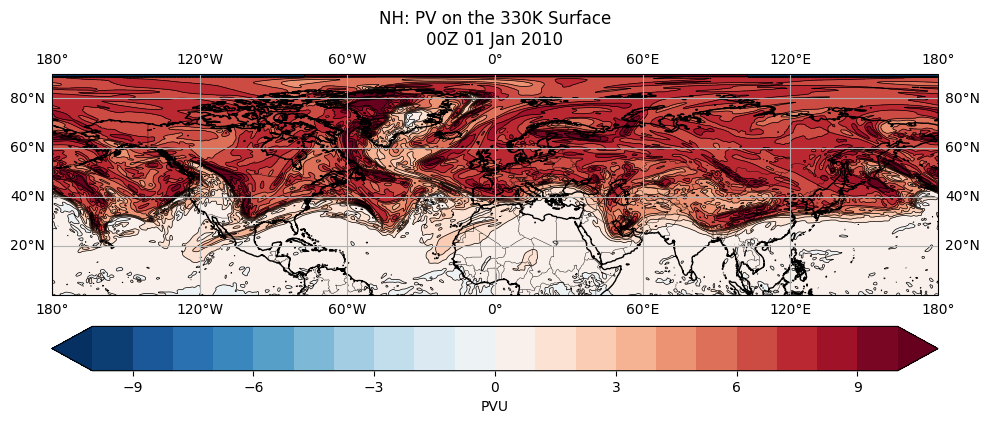

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime

# ------------------------------------------------------------------
# 1. FILE PATH
# ------------------------------------------------------------------
file_path = r"C:\Users\moham\OneDrive\Documents\stage\98a4d3ee3b3b8aa12699f1286ad0843f.nc"

# ------------------------------------------------------------------
# 2. LOAD DATA
# ------------------------------------------------------------------
ds  = xr.open_dataset(file_path)
t   = ds['t'].isel(valid_time=0).values
u   = ds['u'].isel(valid_time=0).values
v   = ds['v'].isel(valid_time=0).values
lat = ds['latitude'].values
lon = ds['longitude'].values
plev= ds['pressure_level'].values * 100  # hPa → Pa

# ------------------------------------------------------------------
# 3. CONSTANTS
# ------------------------------------------------------------------
a     = 6.371e6
g     = 9.80665
Rd    = 287.05
cp    = 1004.5
kappa = Rd / cp
omega = 7.292e-5
pi    = np.pi

# 2D grids
lon2d, lat2d = np.meshgrid(lon, lat)
phi = np.deg2rad(lat2d)
f   = 2 * omega * np.sin(phi)

# Metric terms
dx = a * np.cos(phi) * np.deg2rad(np.gradient(lon))[np.newaxis, :]
dy = a * np.deg2rad(np.gradient(lat))[:, np.newaxis]
dx3 = np.broadcast_to(dx, t.shape)
dy3 = np.broadcast_to(dy, t.shape)
f3  = np.broadcast_to(f , t.shape)

# ------------------------------------------------------------------
# 4. THETA & PV
# ------------------------------------------------------------------
theta = t * (1e5 / plev[:, None, None]) ** kappa
dθ_dp = np.gradient(theta, plev, axis=0)
dθ_dx = np.gradient(theta, axis=2) / dx3
dθ_dy = np.gradient(theta, axis=1) / dy3
du_dp = np.gradient(u, plev, axis=0)
dv_dp = np.gradient(v, plev, axis=0)
dv_dx = np.gradient(v, axis=2) / dx3
ducos_dy = np.gradient(u * np.cos(phi), axis=1) / dy3
zeta = dv_dx - (1 / np.cos(phi)) * ducos_dy

PV = -g * ((zeta + f3) * dθ_dp + dθ_dx * dv_dp - dθ_dy * du_dp)
PVU = PV / 1e-6  # [PVU] = 1e-6 K·m²·kg⁻¹·s⁻¹

# ------------------------------------------------------------------
# 5. INTERPOLATE PV TO 330 K ISENTROPIC SURFACE
# ------------------------------------------------------------------
theta_target = 330
pv330 = np.full((len(lat), len(lon)), np.nan)

for j in range(len(lat)):
    for i in range(len(lon)):
        for k in range(len(plev) - 1):
            th1 = theta[k  , j, i]
            th2 = theta[k+1, j, i]
            if th1 <= theta_target <= th2 or th2 <= theta_target <= th1:
                pvu1 = PVU[k  , j, i]
                pvu2 = PVU[k+1, j, i]
                # linear interp
                w = (theta_target - th1) / (th2 - th1)
                pv330[j, i] = (1 - w) * pvu1 + w * pvu2
                break

# Optional smoothing
pv330 = gaussian_filter(pv330, sigma=1)

# ------------------------------------------------------------------
# 6. PLOT
# ------------------------------------------------------------------
# Mask southern latitudes
lat_mask = lat >= 0
pv330_nh = pv330[lat_mask, :]
lat_nh = lat[lat_mask]

fig = plt.figure(figsize=(10, 5))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, 0, 90], crs=ccrs.PlateCarree())  # NH view
clevs = np.linspace(-10, 10, 21)

cf = ax.contourf(lon, lat_nh, pv330_nh, levels=clevs, cmap='RdBu_r', extend='both')
cs = ax.contour(lon, lat_nh, pv330_nh, levels=clevs, colors='k', linewidths=0.5)
cbar = plt.colorbar(cf, orientation='horizontal', pad=0.07)
cbar.set_label("PVU")

ax.coastlines('50m')
ax.add_feature(cfeature.BORDERS, linewidth=0.3)
ax.gridlines(draw_labels=True)

fdate = datetime.strptime("20100101", '%Y%m%d').strftime('%d %b %Y')
plt.title(f"NH: PV on the 330K Surface\n00Z {fdate}")
plt.tight_layout()
plt.show()


In [ ]:
print(ds.data_vars)


Data variables:
    z        (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    o3       (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    pv       (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    q        (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    t        (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    u        (valid_time, pressure_level, latitude, longitude) float32 154MB ...
    v        (valid_time, pressure_level, latitude, longitude) float32 154MB ...


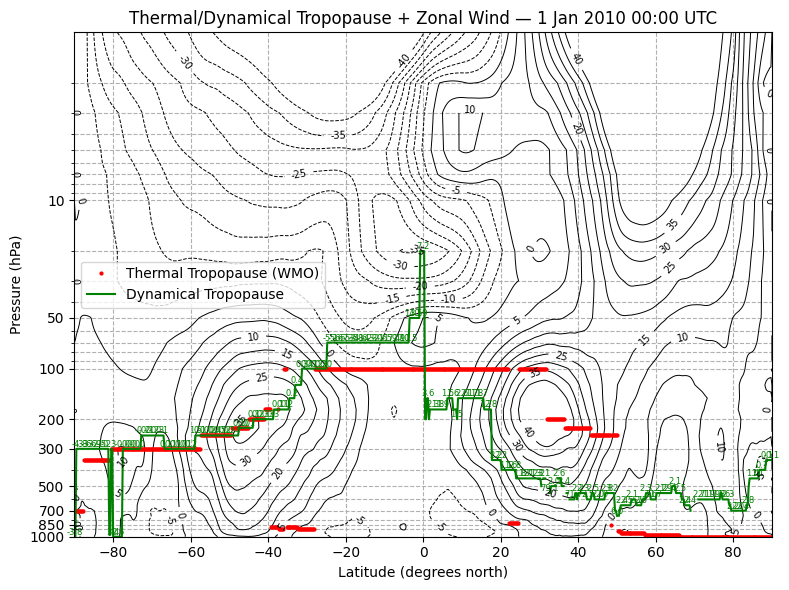

In [118]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

# ---------------------------------------------------
# 1. Load Data
# ---------------------------------------------------
file_path = r"C:\Users\moham\OneDrive\Documents\stage\98a4d3ee3b3b8aa12699f1286ad0843f.nc"
ds = xr.open_dataset(file_path)

t = ds['t'].isel(valid_time=0).values
z = ds['z'].isel(valid_time=0).values
pv = ds['pv'].isel(valid_time=0).values
u = ds['u'].isel(valid_time=0).values

plev = ds['pressure_level'].values
lat = ds['latitude'].values
lon = ds['longitude'].values

g = 9.80665

z_height = z / g
pv = pv / 1e-6  # Ensure pv is in PVU!

# ---------------------------------------------------
# 2. Thermal Tropopause
# ---------------------------------------------------
thermal_tp = []

for j in range(len(lat)):
    found = False
    for k in range(len(plev) - 1):
        T1 = t[k, j, :].mean()
        T2 = t[k + 1, j, :].mean()
        Z1 = z_height[k, j, :].mean()
        Z2 = z_height[k + 1, j, :].mean()

        dT = T2 - T1
        dZ = Z2 - Z1

        if dZ != 0:
            lapse_rate = -dT / dZ * 1000
            if lapse_rate <= 2:
                thermal_tp.append((lat[j], plev[k]))
                found = True
                break
    if not found:
        thermal_tp.append((lat[j], np.nan))

# ---------------------------------------------------
# 3. Dynamical Tropopause (NH: first PV < 3 on way down;
#                          SH: first PV < -3 on way up)
# ---------------------------------------------------
dyn_tp = []

plev_descending = plev[0] > plev[-1]

if plev_descending:
    nh_order = range(len(plev)-1, -1, -1)  # top → bottom
    sh_order = range(len(plev))           # bottom → top
else:
    nh_order = range(len(plev))           # top → bottom
    sh_order = range(len(plev)-1, -1, -1)  # bottom → top

for j, LAT in enumerate(lat):
    found = False

    if LAT >= 0:  # Northern Hemisphere
        for idx in nh_order:
            pv_slice = pv[idx, j, :]
            if np.all(np.isnan(pv_slice)):
                continue
            if np.nanmax(pv_slice) < 3.0:
                cross_idx = idx-1 if idx > 0 else idx
                dyn_tp.append((LAT, plev[cross_idx]))
                found = True
                break

    else:  # Southern Hemisphere
        for idx in sh_order:
            pv_slice = pv[idx, j, :]
            if np.all(np.isnan(pv_slice)):
                continue
            if np.nanmean(pv_slice) <= -3.0:
                dyn_tp.append((LAT, plev[idx]))
                found = True
                break

    if not found:
        dyn_tp.append((LAT, np.nan))

# ---------------------------------------------------
# 4. Extract PVU values at tropopause locations
# ---------------------------------------------------
dyn_pvu_values = []

for lat_val, p_val in dyn_tp:
    if np.isnan(p_val):
        dyn_pvu_values.append(np.nan)
        continue
    j = np.argmin(np.abs(lat - lat_val))
    k = np.argmin(np.abs(plev - p_val))
    pvu_val = np.nanmax(pv[k, j, :])
    dyn_pvu_values.append(pvu_val)

# ---------------------------------------------------
# 5. Mean Zonal Wind
# ---------------------------------------------------
u_mean = u.mean(axis=2)  # Zonal mean: (pressure_level, latitude)

# ---------------------------------------------------
# 6. Plot Latitude–Pressure with Wind Contours and Tropopauses
# ---------------------------------------------------
thermal_lat, thermal_p = zip(*thermal_tp)
dyn_lat, dyn_p = zip(*dyn_tp)

fig, ax = plt.subplots(figsize=(8, 6))
ax.invert_yaxis()
ax.set_yscale("log")
ax.set_ylabel("Pressure (hPa)")
ax.set_xlabel("Latitude (degrees north)")

# Custom y-ticks
ax.set_yticks([1000, 850, 700, 500, 300, 200, 100, 50, 10])
ax.get_yaxis().set_major_formatter(plt.ScalarFormatter())

# Wind contours
cs = ax.contour(lat, plev, u_mean, colors='black', linewidths=0.7, levels=np.arange(-40, 45, 5))
ax.clabel(cs, fmt='%d', fontsize=7)

# Plot tropopause lines
ax.plot(thermal_lat, thermal_p, 'ro', markersize=2, label='Thermal Tropopause (WMO)')
ax.plot(dyn_lat, dyn_p, 'g-', linewidth=1.5, label='Dynamical Tropopause')

# Annotate PVU values on dynamical tropopause (every 5th point)
for i, (x, y, val) in enumerate(zip(dyn_lat, dyn_p, dyn_pvu_values)):
    if i % 5 == 0 and not np.isnan(val) and not np.isnan(y):
        ax.text(x, y, f"{val:.1f}", color='green', fontsize=6, ha='center', va='bottom')

ax.set_title("Thermal/Dynamical Tropopause + Zonal Wind — 1 Jan 2010 00:00 UTC")
ax.legend()
ax.grid(True, which="both", linestyle='--')

plt.tight_layout()
plt.show()


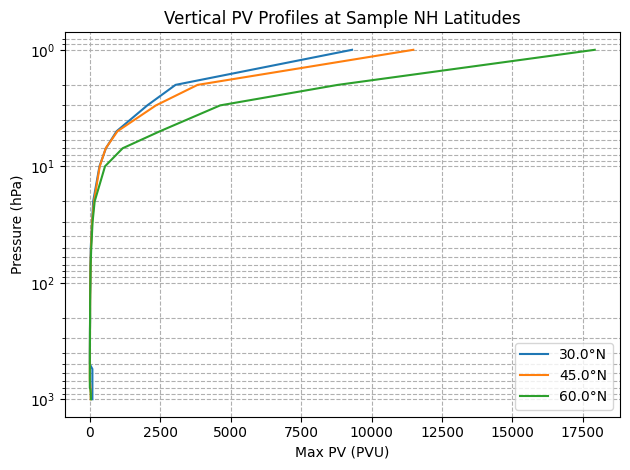

In [79]:
# ---------------------------------------------------
# DEBUG: Check PV max profiles at sample NH latitudes
# ---------------------------------------------------
sample_lats = [30, 45, 60]
fig, ax = plt.subplots()

for lat_val in sample_lats:
    j = np.argmin(np.abs(lat - lat_val))  # nearest index
    pv_max_profile = [np.nanmax(pv[k, j, :]) for k in range(len(plev))]
    ax.plot(pv_max_profile, plev, label=f"{lat[j]:.1f}°N")

ax.invert_yaxis()
ax.set_yscale("log")
ax.set_xlabel("Max PV (PVU)")
ax.set_ylabel("Pressure (hPa)")
ax.set_title("Vertical PV Profiles at Sample NH Latitudes")
ax.legend()
plt.grid(True, which="both", linestyle="--")
plt.tight_layout()
plt.show()


In [ ]:
print(np.nanmax(pv))
print(np.nanmin(pv))


28181.293
-6941.579


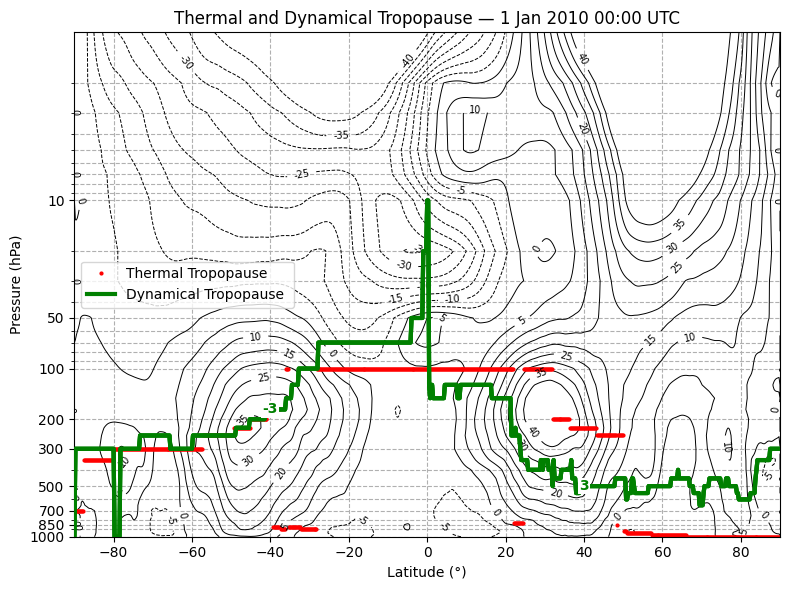

In [ ]:

t = ds['t'].isel(valid_time=0).values
z = ds['z'].isel(valid_time=0).values
pv = ds['pv'].isel(valid_time=0).values
u = ds['u'].isel(valid_time=0).values

plev = ds['pressure_level'].values
lat = ds['latitude'].values
lon = ds['longitude'].values

g = 9.80665
z_height = z / g
pv = pv / 1e-6  # Convert to PVU

# ---------------------------------------------------
# 2. Thermal Tropopause (WMO)
# ---------------------------------------------------
thermal_tp = []

for j in range(len(lat)):
    found = False
    for k in range(len(plev) - 1):
        T1 = t[k, j, :].mean()
        T2 = t[k + 1, j, :].mean()
        Z1 = z_height[k, j, :].mean()
        Z2 = z_height[k + 1, j, :].mean()

        dT = T2 - T1
        dZ = Z2 - Z1

        if dZ != 0:
            lapse_rate = -dT / dZ * 1000
            if lapse_rate <= 2:
                thermal_tp.append((lat[j], plev[k]))
                found = True
                break
    if not found:
        thermal_tp.append((lat[j], np.nan))

# ---------------------------------------------------
# 3. Dynamical Tropopause: PVU = 3 in NH, -3 in SH
# ---------------------------------------------------
dyn_tp = []

plev_descending = plev[0] > plev[-1]
if plev_descending:
    nh_order = range(len(plev)-1, -1, -1)
    sh_order = range(len(plev))
else:
    nh_order = range(len(plev))
    sh_order = range(len(plev)-1, -1, -1)

for j, LAT in enumerate(lat):
    found = False
    if LAT >= 0:
        for idx in nh_order:
            pvu = np.nanmax(pv[idx, j, :])
            if pvu <= 4.0:
                dyn_tp.append((LAT, plev[idx]))
                found = True
                break
    else:
        for idx in sh_order:
            pvu = np.nanmean(pv[idx, j, :])
            if pvu <= -3.5:
                dyn_tp.append((LAT, plev[idx]))
                found = True
                break
    if not found:
        dyn_tp.append((LAT, np.nan))

# ---------------------------------------------------
# 4. Zonal Wind Mean
# ---------------------------------------------------
u_mean = u.mean(axis=2)

# ---------------------------------------------------
# 5. Plot
# ---------------------------------------------------
thermal_lat, thermal_p = zip(*thermal_tp)
dyn_lat, dyn_p = zip(*dyn_tp)

fig, ax = plt.subplots(figsize=(8, 6))
ax.invert_yaxis()
ax.set_yscale("log")
ax.set_ylabel("Pressure (hPa)")
ax.set_xlabel("Latitude (°)")

ax.set_yticks([1000, 850, 700, 500, 300, 200, 100, 50, 10])
ax.get_yaxis().set_major_formatter(plt.ScalarFormatter())

# Wind contours
cs = ax.contour(lat, plev, u_mean, colors='black', linewidths=0.7, levels=np.arange(-40, 45, 5))
ax.clabel(cs, fmt='%d', fontsize=7)

# Tropopause plots
ax.plot(thermal_lat, thermal_p, 'ro', markersize=2, label='Thermal Tropopause')

# --- Dynamical Tropopause Line (thicker) ---
# Split the line into segments for labeling
line = ax.plot(dyn_lat, dyn_p, 'g-', linewidth=3, label='Dynamical Tropopause ', zorder=5)

# Find indices closest to ±40° latitude
nh_idx = np.abs(np.array(dyn_lat) - 40).argmin()
sh_idx = np.abs(np.array(dyn_lat) - (-40)).argmin()

# Create small gaps in the line for labels
gap_size = 2  # degrees of latitude for gap

# Northern Hemisphere label (3)
nh_start = max(0, nh_idx - gap_size)
nh_end = min(len(dyn_lat)-1, nh_idx + gap_size)
ax.plot(dyn_lat[:nh_start], dyn_p[:nh_start], 'g-', linewidth=3, zorder=5)
ax.plot(dyn_lat[nh_end:], dyn_p[nh_end:], 'g-', linewidth=3, zorder=5)
ax.text(dyn_lat[nh_idx], dyn_p[nh_idx], "3", color='green', 
        fontsize=10, ha='center', va='center', fontweight='bold',
        bbox=dict(facecolor='white', edgecolor='none', pad=1), zorder=10)

# Southern Hemisphere label (-3)
sh_start = max(0, sh_idx - gap_size)
sh_end = min(len(dyn_lat)-1, sh_idx + gap_size)
ax.plot(dyn_lat[:sh_start], dyn_p[:sh_start], 'g-', linewidth=3, zorder=5)
ax.plot(dyn_lat[sh_end:], dyn_p[sh_end:], 'g-', linewidth=3, zorder=5)
ax.text(dyn_lat[sh_idx], dyn_p[sh_idx], "-3", color='green', 
        fontsize=10, ha='center', va='center', fontweight='bold',
        bbox=dict(facecolor='white', edgecolor='none', pad=1), zorder=10)

# Final touch
ax.set_title("Thermal and Dynamical Tropopause — 1 Jan 2010 00:00 UTC")
ax.legend()
ax.grid(True, which="both", linestyle='--')
plt.tight_layout()
plt.show()

In [53]:
print(np.nanmax(pv))
print(np.nanmin(pv))


28181.293
-6941.579


In [ ]:
# Résultat : dictionnaire {latitude : pression_tropopause (hPa)}
dyn_tp_sh = {}

for j in range(len(lat)):
    if lat[j] > 0:
        continue  # uniquement l'hémisphère sud
    for k in range(len(plev)-1, -1, -1):  # du haut vers le bas
        if np.nanmax(PVU[k, j, :]) >= 2.0:  # max PVU sur la longitude
            dyn_tp_sh[lat[j]] = plev[k]
            break
    else:
        dyn_tp_sh[lat[j]] = np.nan  # aucun niveau avec PVU ≥ 2

# Affichage trié par latitude décroissante
for la in sorted(dyn_tp_sh.keys(), reverse=True):
    print(f"Latitude {la:.2f}° → Tropopause à {dyn_tp_sh[la]:.1f} hPa")


Pressure level: 30 hPa
  Lat 0.00° → max PVU = 10.46
  Lat -0.25° → max PVU = 9.85
  Lat -0.50° → max PVU = 12.99
  Lat -0.75° → max PVU = 12.33
  Lat -1.00° → max PVU = 9.95
  Lat -1.25° → max PVU = 10.25
  Lat -1.50° → max PVU = 11.24
  Lat -1.75° → max PVU = 12.34
  Lat -2.00° → max PVU = 11.47
  Lat -2.25° → max PVU = 9.74
  Lat -2.50° → max PVU = 6.88
  Lat -2.75° → max PVU = 9.71
  Lat -3.00° → max PVU = 11.18
  Lat -3.25° → max PVU = 12.16
  Lat -3.50° → max PVU = 11.60
  Lat -3.75° → max PVU = 7.38
  Lat -4.00° → max PVU = 7.76
  Lat -4.25° → max PVU = 5.99
  Lat -4.50° → max PVU = 5.21
  Lat -4.75° → max PVU = 6.50
  Lat -5.00° → max PVU = 6.34
  Lat -5.25° → max PVU = 5.40
  Lat -5.50° → max PVU = 3.53
  Lat -5.75° → max PVU = 4.75
  Lat -6.00° → max PVU = 3.72
  Lat -6.25° → max PVU = 3.78
  Lat -6.50° → max PVU = 2.84
  Lat -6.75° → max PVU = 2.26
  Lat -7.00° → max PVU = 2.88
  Lat -7.25° → max PVU = 5.08
  Lat -7.50° → max PVU = 6.42
  Lat -7.75° → max PVU = 4.29
  Lat -8